In [ ]:
import warnings
warnings.filterwarnings('ignore')

## **12 Bulan (1 tahun)**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

for region, model_config in best_models.items():

    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    forecast_steps = 12
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 1 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 1 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **24 Bulan (2 Tahun)**

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

# Forecasting for each region
for region, model_config in best_models.items():
    # Filter data for the region
    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    # Define the time series
    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 2 years
    forecast_steps = 24
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    # Create a DataFrame for predictions
    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    # Create a DataFrame for predictions
    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    # Print forecast results
    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    # Calculate metrics if enough true values are available
    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 2 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 2 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **36 Bulan (3 Tahun)**

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

# Forecasting for each region
for region, model_config in best_models.items():
    # Filter data for the region
    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    # Define the time series
    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 3 years
    forecast_steps = 36
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    # Create a DataFrame for predictions
    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    # Create a DataFrame for predictions
    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    # Print forecast results
    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    # Calculate metrics if enough true values are available
    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 3 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 3 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **48 Bulan (4 Tahun)**

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

# Forecasting for each region
for region, model_config in best_models.items():
    # Filter data for the region
    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    # Define the time series
    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 4 years
    forecast_steps = 48
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    # Create a DataFrame for predictions
    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    # Create a DataFrame for predictions
    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    # Print forecast results
    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    # Calculate metrics if enough true values are available
    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 4 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 4 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **60 Bulan (5 Tahun)**

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

# Forecasting for each region
for region, model_config in best_models.items():
    # Filter data for the region
    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    # Define the time series
    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 5 years
    forecast_steps = 60
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    # Create a DataFrame for predictions
    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    # Create a DataFrame for predictions
    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    # Print forecast results
    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    # Calculate metrics if enough true values are available
    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 5 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 5 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **72 Bulan (6 Tahun)**

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

# Forecasting for each region
for region, model_config in best_models.items():
    # Filter data for the region
    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    # Define the time series
    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 6 years
    forecast_steps = 72
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    # Create a DataFrame for predictions
    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    # Create a DataFrame for predictions
    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    # Print forecast results
    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    # Calculate metrics if enough true values are available
    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 6 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 6 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **84 Bulan (7 Tahun)**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

for region, model_config in best_models.items():

    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 7 years
    forecast_steps = 84
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    # Create a DataFrame for predictions
    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    # Create a DataFrame for predictions
    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    # Print forecast results
    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    # Calculate metrics if enough true values are available
    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 7 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 7 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **96 Bulan (8 Tahun)**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

# Forecasting for each region
for region, model_config in best_models.items():
    # Filter data for the region
    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    # Define the time series
    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 8 years
    forecast_steps = 96
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    # Create a DataFrame for predictions
    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    # Create a DataFrame for predictions
    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    # Print forecast results
    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    # Calculate metrics if enough true values are available
    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 8 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 8 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **108 Bulan (9 Tahun)**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

for region, model_config in best_models.items():

    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    forecast_steps = 108
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 9 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 9 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **120 Bulan (10 Tahun)**

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

# Forecasting for each region
for region, model_config in best_models.items():
    # Filter data for the region
    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    # Define the time series
    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 10 years
    forecast_steps = 120
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    # Create a DataFrame for predictions
    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    # Create a DataFrame for predictions
    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    # Print forecast results
    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    # Calculate metrics if enough true values are available
    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 10 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 10 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1, 1, 2, 1, 1, 2, 12),
    'Bengkalis': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hilir': (0, 1, 2, 0, 1, 1, 12),
    'Indragiri Hulu': (0, 1, 2, 0, 1, 1, 12),
    'Kampar': (3, 1, 3, 0, 1, 1, 12),
    'Kepulauan Meranti': (2, 1, 3, 1, 1, 2, 12),
    'Kota Dumai': (0, 1, 2, 0, 1, 1, 12),
    'Kota Pekanbaru': (1, 1, 3, 0, 1, 1, 12),
    'Kuantan Singingi': (3, 1, 3, 0, 1, 3, 12),
    'Pelalawan': (0, 1, 2, 0, 1, 1, 12),
    'Rokan Hilir': (1, 1, 3, 0, 1, 1, 12),
    'Rokan Hulu': (3, 1, 3, 0, 1, 1, 12),
    'Siak': (2, 1, 3, 0, 1, 1, 12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((true_values - pred_values) / true_values)) * 100
    return mae, mse, rmse, mape

# Forecasting for each region
for region, model_config in best_models.items():
    # Filter data for the region
    region_data = data[data['Kota/Kabupaten'] == region]
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)

    # Define the time series
    ts = region_data['Rata-rata Suhu (°C) - Differenced']
    ts_original = region_data['Rata-rata Suhu (°C)']

    ts.dropna(inplace=True)
    ts_original.dropna(inplace=True)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 20 years
    forecast_steps = 240
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    # Create a DataFrame for predictions
    forecast_df_diff = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C) - Differenced': pred_diff.predicted_mean
    })

    # Create a DataFrame for predictions
    forecast_df_original = pd.DataFrame({
        'Date': pred_diff_index,
        'Predicted Temperature (°C)': pred_original
    })

    forecast_df_diff.set_index('Date', inplace=True)
    forecast_df_original.set_index('Date', inplace=True)

    # Print forecast results
    print(f"Forecast for {region} (Differenced):")
    print(forecast_df_diff)

    print(f"Forecast for {region} (Original):")
    print(forecast_df_original)

    # Calculate metrics if enough true values are available
    if len(ts_original) >= (len(ts) + forecast_steps):
        true_values = ts_original.iloc[-forecast_steps:].values
        mae, mse, rmse, mape = calculate_metrics(true_values, pred_original)
        print(f"Metrics for {region} - MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
    else:
        print(f"Not enough true values available for {region} to calculate metrics.")

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts, label='Actual Data Differenced', color='blue')
    plt.plot(forecast_df_diff, label='Forecasted Data Differenced', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 20 Years - Differenced)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(ts_original, label='Actual Data', color='blue')
    plt.plot(forecast_df_original, label='Forecasted Data', color='red', linestyle='--')
    plt.title(f'Forecast for {region} (Next 20 Years - Original)')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

Output hidden; open in https://colab.research.google.com to view.

## **Tanpa White Noise**

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# Forecasting and plotting for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(sarima_fit.aic, 2)}")
    print(sarima_fit.summary())

    # Diagnostics plot
    sarima_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Get forecast for the next 108 periods (for the differenced data)
    forecast_steps = 108
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_ci = pred_diff.conf_int()  # Confidence intervals for differenced predictions
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)

    ### Plot 1: Differenced Data and its Forecast ###
    plt.figure(figsize=(15, 8))
    plt.plot(ts, label='Differenced Data', color='blue')
    plt.plot(pred_diff_index, pred_diff.predicted_mean, label='Forecasted (Differenced)', color='red', linestyle='--')
    plt.fill_between(pred_diff_index,
                     pred_ci.iloc[:, 0],
                     pred_ci.iloc[:, 1],
                     color='k', alpha=.2)
    plt.xlabel('Date')
    plt.ylabel('Differenced Temperature (°C)')
    plt.title(f'Differenced Data and Forecast for {region}')
    plt.legend()
    plt.show()

    ### Plot 2: Original Data and Forecasted Data (in Original Scale) ###
    plt.figure(figsize=(15, 8))
    plt.plot(ts_original, label='Original Data', color='blue')
    plt.plot(pred_diff_index, pred_original, label='Forecasted Data (Original Scale)', color='red', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Original Data and Forecast for {region} (Next 108 Steps)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(ts_original.iloc[1:]), len(pred_original[1:]))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(ts_original.iloc[1:min_length_orig+1], pred_original[1:min_length_orig+1])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")

    ### Plot Observed and Predicted for Differenced Data ###
    LAST_N_SAMPLES = 50
    X_obs_diff = ts[-LAST_N_SAMPLES:].index  # Dates for observed differenced data
    X_pred_diff = pred_diff_index  # Dates for predicted differenced data

    plt.figure(figsize=(15, 8))
    plt.plot(X_obs_diff, ts[-LAST_N_SAMPLES:], label='Observed Differenced', color='blue')
    plt.plot(X_pred_diff, pred_diff.predicted_mean, label='Forecasted Differenced', alpha=.7, color='red')
    plt.fill_between(X_pred_diff,
                     pred_ci.iloc[:, 0],
                     pred_ci.iloc[:, 1],
                     color='k', alpha=.2)
    plt.xlabel('Date')
    plt.ylabel('Differenced Temperature (°C)')
    plt.title(f'Last Observed Differenced and Forecast for {region}')
    plt.legend()
    plt.show()

    ### Plot Observed and Predicted for Original Scale Data ###
    X_obs = ts_original[-LAST_N_SAMPLES:].index  # Dates for observed data
    X_pred = pred_diff_index  # Dates for predicted data

    plt.figure(figsize=(15, 8))
    plt.plot(X_obs, ts_original[-LAST_N_SAMPLES:], label='Observed', color='blue')
    plt.plot(X_pred, pred_original, label='Forecast', alpha=.7, color='red')
    plt.fill_between(X_pred,
                     pred_ci.iloc[:, 0] + ts_original.iloc[-1],  # Reverse differencing for lower bound
                     pred_ci.iloc[:, 1] + ts_original.iloc[-1],  # Reverse differencing for upper bound
                     color='k', alpha=.2)
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Last Observed and Forecast for {region}')
    plt.legend()
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Create an empty DataFrame to store the forecasted results
forecast_results = pd.DataFrame(columns=['Date', 'Kota/Kabupaten', 'Suhu', 'Upper CI', 'Lower CI'])

# Forecasting and saving results for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Forecast for the next 108 periods (for the differenced data)
    forecast_steps = 108
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_ci = pred_diff.conf_int()  # Confidence intervals for differenced predictions
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)
    upper_ci_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 1])
    lower_ci_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 0])

    # Create a temporary DataFrame to store the results for this region
    temp_df = pd.DataFrame({
        'Date': pred_diff_index,
        'Kota/Kabupaten': region,
        'Suhu': pred_original.values,
        'Upper CI': upper_ci_original.values,
        'Lower CI': lower_ci_original.values
    })

    # Append the temporary DataFrame to the main DataFrame
    forecast_results = pd.concat([forecast_results, temp_df], ignore_index=True)

# Export the final results to an Excel file
output_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Hasil_Peramalan.xlsx'
forecast_results.to_excel(output_path, index=False)

print("Forecast results saved to Excel file.")

Forecast results saved to Excel file.


In [ ]:
df_result = pd.read_excel('/content/drive/MyDrive/data hasil Citra ke Numerik/Hasil_Peramalan.xlsx')
df_result

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
0,2021-01-31,Riau,27.158666,28.410567,25.906764
1,2021-02-28,Riau,27.800846,30.748795,24.852897
2,2021-03-31,Riau,28.652716,33.304686,24.000746
3,2021-04-30,Riau,28.281042,34.637141,21.924943
4,2021-05-31,Riau,27.832996,35.893233,19.772760
...,...,...,...,...,...
1399,2029-08-31,Siak,24.053589,270.749092,-222.641914
1400,2029-09-30,Siak,24.843606,273.921938,-224.234726
1401,2029-10-31,Siak,24.322436,275.783572,-227.138700
1402,2029-11-30,Siak,23.271860,277.115784,-230.572064


In [ ]:
df_result['Kota/Kabupaten'].unique()

array(['Riau', 'Bengkalis', 'Indragiri Hilir', 'Indragiri Hulu', 'Kampar',
       'Kepulauan Meranti', 'Kota Dumai', 'Kota Pekanbaru',
       'Kuantan Singingi', 'Pelalawan', 'Rokan Hilir', 'Rokan Hulu',
       'Siak'], dtype=object)

In [ ]:
df_riau = df_result[df_result['Kota/Kabupaten'] == 'Riau']

df_riau

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
0,2021-01-31,Riau,27.158666,28.410567,25.906764
1,2021-02-28,Riau,27.800846,30.748795,24.852897
2,2021-03-31,Riau,28.652716,33.304686,24.000746
3,2021-04-30,Riau,28.281042,34.637141,21.924943
4,2021-05-31,Riau,27.832996,35.893233,19.772760
...,...,...,...,...,...
103,2029-08-31,Riau,25.597039,204.152896,-152.958817
104,2029-09-30,Riau,26.321071,206.606467,-153.964326
105,2029-10-31,Riau,26.106717,208.121655,-155.908220
106,2029-11-30,Riau,25.004926,208.749400,-158.739547


In [ ]:
df_Bengkalis = df_result[df_result['Kota/Kabupaten'] == 'Bengkalis']

df_Bengkalis

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
108,2021-01-31,Bengkalis,27.348358,29.296830,25.399886
109,2021-02-28,Bengkalis,28.393507,32.877761,23.909254
110,2021-03-31,Bengkalis,28.809959,35.829994,21.789924
111,2021-04-30,Bengkalis,28.611391,38.167208,19.055575
112,2021-05-31,Bengkalis,28.090209,40.181807,15.998610
...,...,...,...,...,...
211,2029-08-31,Bengkalis,24.176672,287.340433,-238.987089
212,2029-09-30,Bengkalis,24.846603,290.546711,-240.853505
213,2029-10-31,Bengkalis,23.934574,292.171028,-244.301881
214,2029-11-30,Bengkalis,22.751215,293.524016,-248.021585


In [ ]:
df_inhil = df_result[df_result['Kota/Kabupaten'] == 'Indragiri Hilir']

df_inhil

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
216,2021-01-31,Indragiri Hilir,27.614185,29.226801,26.001568
217,2021-02-28,Indragiri Hilir,28.296271,32.100366,24.492175
218,2021-03-31,Indragiri Hilir,28.967678,34.963252,22.972104
219,2021-04-30,Indragiri Hilir,28.462511,36.649564,20.275458
220,2021-05-31,Indragiri Hilir,28.133920,38.512452,17.755388
...,...,...,...,...,...
319,2029-08-31,Indragiri Hilir,25.785770,253.108214,-201.536675
320,2029-09-30,Indragiri Hilir,26.489695,256.003781,-203.024391
321,2029-10-31,Indragiri Hilir,26.651223,258.356952,-205.054505
322,2029-11-30,Indragiri Hilir,26.002787,259.900157,-207.894584


In [ ]:
df_inhul = df_result[df_result['Kota/Kabupaten'] == 'Indragiri Hulu']

df_inhul

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
324,2021-01-31,Indragiri Hulu,26.918046,28.725222,25.110870
325,2021-02-28,Indragiri Hulu,27.170000,31.421444,22.918555
326,2021-03-31,Indragiri Hulu,28.069588,34.765307,21.373868
327,2021-04-30,Indragiri Hulu,27.905030,37.045032,18.765028
328,2021-05-31,Indragiri Hulu,27.499918,39.084209,15.915626
...,...,...,...,...,...
427,2029-08-31,Indragiri Hulu,24.384662,278.020251,-229.250926
428,2029-09-30,Indragiri Hulu,25.446107,281.527384,-230.635171
429,2029-10-31,Indragiri Hulu,25.436577,283.963556,-233.090403
430,2029-11-30,Indragiri Hulu,24.479540,285.452233,-236.493154


In [ ]:
df_Kampar = df_result[df_result['Kota/Kabupaten'] == 'Kampar']

df_Kampar

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
432,2021-01-31,Kampar,26.348542,27.892819,24.804266
433,2021-02-28,Kampar,26.900960,30.521031,23.280889
434,2021-03-31,Kampar,28.006584,33.705339,22.307829
435,2021-04-30,Kampar,27.589986,35.368515,19.811458
436,2021-05-31,Kampar,27.446641,37.309313,17.583969
...,...,...,...,...,...
535,2029-08-31,Kampar,21.921883,243.391537,-199.547771
536,2029-09-30,Kampar,22.644606,246.269175,-200.979964
537,2029-10-31,Kampar,22.305337,248.084975,-203.474302
538,2029-11-30,Kampar,21.388875,249.323584,-206.545834


In [ ]:
df_kepri = df_result[df_result['Kota/Kabupaten'] == 'Kepulauan Meranti']

df_kepri

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
540,2021-01-31,Kepulauan Meranti,26.120736,27.659121,24.582351
541,2021-02-28,Kepulauan Meranti,26.550901,30.050065,23.051737
542,2021-03-31,Kepulauan Meranti,27.455031,32.943688,21.966375
543,2021-04-30,Kepulauan Meranti,27.163260,34.715044,19.611476
544,2021-05-31,Kepulauan Meranti,26.635128,36.255325,17.014931
...,...,...,...,...,...
643,2029-08-31,Kepulauan Meranti,22.373020,240.262224,-195.516184
644,2029-09-30,Kepulauan Meranti,22.930891,242.931756,-197.069973
645,2029-10-31,Kepulauan Meranti,22.704094,244.816585,-199.408396
646,2029-11-30,Kepulauan Meranti,21.655181,245.879240,-202.568878


In [ ]:
df_dumai = df_result[df_result['Kota/Kabupaten'] == 'Kota Dumai']

df_dumai

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
648,2021-01-31,Kota Dumai,27.800183,30.569288,25.031077
649,2021-02-28,Kota Dumai,29.317746,35.764488,22.871004
650,2021-03-31,Kota Dumai,29.413460,39.537838,19.289082
651,2021-04-30,Kota Dumai,29.148807,42.950822,15.346792
652,2021-05-31,Kota Dumai,28.638871,46.118523,11.159220
...,...,...,...,...,...
751,2029-08-31,Kota Dumai,24.794930,406.386193,-356.796333
752,2029-09-30,Kota Dumai,25.613339,410.882704,-359.656026
753,2029-10-31,Kota Dumai,24.969073,413.916541,-363.978394
754,2029-11-30,Kota Dumai,23.461089,416.086659,-369.164482


In [ ]:
df_pekanbaru = df_result[df_result['Kota/Kabupaten'] == 'Kota Pekanbaru']

df_pekanbaru

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
756,2021-01-31,Kota Pekanbaru,29.262521,32.304156,26.220885
757,2021-02-28,Kota Pekanbaru,27.502283,34.377232,20.627335
758,2021-03-31,Kota Pekanbaru,28.036094,38.803808,17.268380
759,2021-04-30,Kota Pekanbaru,29.058969,43.766073,14.351864
760,2021-05-31,Kota Pekanbaru,30.209369,48.888581,11.530157
...,...,...,...,...,...
859,2029-08-31,Kota Pekanbaru,25.884528,447.266117,-395.497060
860,2029-09-30,Kota Pekanbaru,25.650078,451.116920,-399.816765
861,2029-10-31,Kota Pekanbaru,25.846068,455.398224,-403.706088
862,2029-11-30,Kota Pekanbaru,26.195436,459.832749,-407.441876


In [ ]:
df_kuantan = df_result[df_result['Kota/Kabupaten'] == 'Kuantan Singingi']

df_kuantan

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
864,2021-01-31,Kuantan Singingi,26.477775,28.253696,24.701853
865,2021-02-28,Kuantan Singingi,27.087342,31.351724,22.822959
866,2021-03-31,Kuantan Singingi,28.011297,34.789512,21.233081
867,2021-04-30,Kuantan Singingi,27.919548,37.219345,18.619752
868,2021-05-31,Kuantan Singingi,27.535838,39.357418,15.714258
...,...,...,...,...,...
967,2029-08-31,Kuantan Singingi,23.312733,289.302151,-242.676686
968,2029-09-30,Kuantan Singingi,24.452589,293.073423,-244.168244
969,2029-10-31,Kuantan Singingi,24.190655,295.443074,-247.061764
970,2029-11-30,Kuantan Singingi,23.519092,297.403096,-250.364912


In [ ]:
df_pelalawan = df_result[df_result['Kota/Kabupaten'] == 'Pelalawan']

df_pelalawan

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
972,2021-01-31,Pelalawan,27.319584,29.040541,25.598627
973,2021-02-28,Pelalawan,27.722441,31.754140,23.690741
974,2021-03-31,Pelalawan,28.591416,34.933860,22.248971
975,2021-04-30,Pelalawan,28.451808,37.105001,19.798615
976,2021-05-31,Pelalawan,28.116431,39.080376,17.152486
...,...,...,...,...,...
1075,2029-08-31,Pelalawan,26.114412,270.451370,-218.222545
1076,2029-09-30,Pelalawan,26.649493,273.389721,-220.090734
1077,2029-10-31,Pelalawan,26.679947,275.823455,-222.463561
1078,2029-11-30,Pelalawan,25.533258,277.080057,-226.013540


In [ ]:
df_rohil = df_result[df_result['Kota/Kabupaten'] == 'Rokan Hilir']

df_rohil

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
1080,2021-01-31,Rokan Hilir,26.854432,28.754419,24.954445
1081,2021-02-28,Rokan Hilir,27.924995,32.163264,23.686727
1082,2021-03-31,Rokan Hilir,28.713409,35.302561,22.124256
1083,2021-04-30,Rokan Hilir,28.212066,37.163431,19.260701
1084,2021-05-31,Rokan Hilir,27.946777,39.268894,16.624659
...,...,...,...,...,...
1183,2029-08-31,Rokan Hilir,23.351721,272.933357,-226.229915
1184,2029-09-30,Rokan Hilir,23.812748,275.803200,-228.177703
1185,2029-10-31,Rokan Hilir,22.838509,277.237831,-231.560813
1186,2029-11-30,Rokan Hilir,21.568787,278.376831,-235.239258


In [ ]:
df_rohul = df_result[df_result['Kota/Kabupaten'] == 'Rokan Hulu']

df_rohul

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
1188,2021-01-31,Rokan Hulu,26.871405,28.550398,25.192413
1189,2021-02-28,Rokan Hulu,27.602226,31.510368,23.694084
1190,2021-03-31,Rokan Hulu,28.773842,34.923303,22.624380
1191,2021-04-30,Rokan Hulu,28.017818,36.418995,19.616641
1192,2021-05-31,Rokan Hulu,28.214314,38.870370,17.558258
...,...,...,...,...,...
1291,2029-08-31,Rokan Hulu,23.283396,262.285088,-215.718297
1292,2029-09-30,Rokan Hulu,23.786930,265.099645,-217.525784
1293,2029-10-31,Rokan Hulu,23.292308,266.916128,-220.331511
1294,2029-11-30,Rokan Hulu,22.204494,268.139418,-223.730431


In [ ]:
df_siak = df_result[df_result['Kota/Kabupaten'] == 'Siak']

df_siak

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
1296,2021-01-31,Siak,27.013887,28.719206,25.308568
1297,2021-02-28,Siak,27.717105,31.743126,23.691084
1298,2021-03-31,Siak,28.391652,34.738376,22.044928
1299,2021-04-30,Siak,28.256922,36.933674,19.580171
1300,2021-05-31,Siak,27.570129,38.586309,16.553950
...,...,...,...,...,...
1399,2029-08-31,Siak,24.053589,270.749092,-222.641914
1400,2029-09-30,Siak,24.843606,273.921938,-224.234726
1401,2029-10-31,Siak,24.322436,275.783572,-227.138700
1402,2029-11-30,Siak,23.271860,277.115784,-230.572064


## **Dengan White Noise**

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# Forecasting and plotting for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(sarima_fit.aic, 2)}")
    print(sarima_fit.summary())

    # Diagnostics plot
    sarima_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Get forecast for the next 108 periods (for the differenced data)
    forecast_steps = 108
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_ci = pred_diff.conf_int()  # Confidence intervals for differenced predictions
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)
    lower_bound_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 0])
    upper_bound_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 1])

    # Add noise based on residual standard deviation
    noise = np.random.normal(loc=0, scale=sarima_fit.resid.std(), size=forecast_steps)

    # Add noise to predictions and confidence intervals
    pred_original_with_noise = pred_original + noise
    upper_bound_original_with_noise = upper_bound_original + noise
    lower_bound_original_with_noise = lower_bound_original + noise


    # Add noise (optional: scale down or skip)
    # noise = np.random.normal(loc=0, scale=0.2 * sarima_fit.resid.std(), size=forecast_steps)  # Reduce noise scale
    # pred_original_with_noise = pred_original + noise  # Use noise, or skip noise

    ### Plot 1: Original Data and Forecasted Data (in Original Scale) ###
    plt.figure(figsize=(15, 8))
    plt.plot(ts_original, label='Original Data', color='blue')
    plt.plot(pred_diff_index, pred_original_with_noise, label='Forecasted Data (Original Scale with Noise)', color='red', linestyle='--')
    plt.fill_between(pred_diff_index,
                     lower_bound_original,
                     upper_bound_original,
                     color='k', alpha=.2)
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Original Data and Forecast for {region} (Next 108 Steps)')
    plt.legend()
    plt.show()

    # Focus on recent data
    recent_data = ts_original[-36:]  # Last 3 years

    # Plot with adjusted y-axis limits
    plt.figure(figsize=(15, 8))
    plt.plot(recent_data, label='Original Data (Last 3 Years)', color='blue')
    plt.plot(pred_diff_index, pred_original_with_noise, label='Forecasted Data (Original Scale)', color='red', linestyle='--')
    plt.fill_between(pred_diff_index,
                    lower_bound_original,
                    upper_bound_original,
                    color='k', alpha=.2)
    plt.ylim([recent_data.min() - 5, recent_data.max() + 5])  # Set y-axis limits based on recent data
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Original Data and Forecast for {region} (Next 108 Steps)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(ts_original.iloc[1:]), len(pred_original_with_noise[1:]))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(ts_original.iloc[1:min_length_orig+1], pred_original_with_noise[1:min_length_orig+1])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# Forecasting and plotting for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(sarima_fit.aic, 2)}")
    print(sarima_fit.summary())

    # Diagnostics plot
    sarima_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Get forecast for the next 108 periods (for the differenced data)
    forecast_steps = 108
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_ci = pred_diff.conf_int()  # Confidence intervals for differenced predictions
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)
    lower_bound_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 0])
    upper_bound_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 1])

    # Add noise based on residual standard deviation
    noise = np.random.normal(loc=0, scale=sarima_fit.resid.std(), size=forecast_steps)
    #pred_original_with_noise = pred_original + noise

    # Add noise (optional: scale down or skip)
    #noise = np.random.normal(loc=0, scale=0.2 * sarima_fit.resid.std(), size=forecast_steps)  # Reduce noise scale
    pred_original_with_noise = pred_original + noise  # Use noise, or skip noise

    # Add noise to predictions and confidence intervals
    upper_bound_original_with_noise = upper_bound_original + noise
    lower_bound_original_with_noise = lower_bound_original + noise

    ### Plot 1: Original Data and Forecasted Data (in Original Scale) ###
    plt.figure(figsize=(15, 8))
    plt.plot(ts_original, label='Original Data', color='blue')
    plt.plot(pred_diff_index, pred_original_with_noise, label='Forecasted Data (Original Scale with Noise)', color='red', linestyle='--')
    plt.fill_between(pred_diff_index,
                     pred_ci.iloc[:, 0] + ts_original.iloc[-1] + noise,  # Reverse differencing for lower bound
                     pred_ci.iloc[:, 1] + ts_original.iloc[-1] + noise,  # Reverse differencing for upper bound
                     #upper_bound_original_with_noise,
                     #lower_bound_original_with_noise,
                     color='k', alpha=.2)
    #plt.ylim([recent_data.min() - 5, recent_data.max() + 5])  # Set y-axis limits based on recent data
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Original Data and Forecast for {region} (Next 108 Steps)')
    plt.legend()
    plt.show()

    # Focus on recent data
    recent_data = ts_original[-36:]  # Last 3 years

    # Plot with adjusted y-axis limits
    plt.figure(figsize=(15, 8))
    plt.plot(recent_data, label='Original Data (Last 3 Years)', color='blue')
    plt.plot(pred_diff_index, pred_original_with_noise, label='Forecasted Data (Original Scale)', color='red', linestyle='--')
    plt.fill_between(pred_diff_index,
                     pred_ci.iloc[:, 0] + ts_original.iloc[-1] + noise,  # Reverse differencing for lower bound
                     pred_ci.iloc[:, 1] + ts_original.iloc[-1] + noise,  # Reverse differencing for upper bound
                     #upper_bound_original_with_noise,
                     #lower_bound_original_with_noise,
                     color='k', alpha=.2)
    #plt.ylim([recent_data.min() - 1, recent_data.max() + 1])  # Set y-axis limits based on recent data
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Original Data and Forecast for {region} (Next 108 Steps)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(ts_original.iloc[1:]), len(pred_original_with_noise[1:]))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(ts_original.iloc[1:min_length_orig+1], pred_original_with_noise[1:min_length_orig+1])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# DataFrame to store all forecasting results
forecast_results = pd.DataFrame(columns=['Date', 'Kota/Kabupaten', 'Suhu', 'Upper CI', 'Lower CI'])

# Forecasting and saving results for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Get forecast for the next 108 periods (for the differenced data)
    forecast_steps = 108
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_ci = pred_diff.conf_int()  # Confidence intervals for differenced predictions
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)
    lower_bound_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 0])
    upper_bound_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 1])

    # Add noise based on residual standard deviation
    noise = np.random.normal(loc=0, scale=sarima_fit.resid.std(), size=forecast_steps)
    pred_original_with_noise = pred_original + noise

    # Add noise to predictions and confidence intervals
    upper_bound_original_with_noise = upper_bound_original + noise
    lower_bound_original_with_noise = lower_bound_original + noise

    # Create DataFrame for the region
    region_forecast = pd.DataFrame({
        'Date': pred_diff_index,
        'Kota/Kabupaten': region,
        'Suhu': pred_original_with_noise.values,
        'Upper CI': upper_bound_original_with_noise.values,
        'Lower CI': lower_bound_original_with_noise.values
    })

    # Append to the main forecast_results DataFrame
    forecast_results = pd.concat([forecast_results, region_forecast], ignore_index=True)

# Save forecast results to Excel
output_file = '/content/drive/MyDrive/data hasil Citra ke Numerik/Hasil Peramalan dengan noise.xlsx'
forecast_results.to_excel(output_file, index=False)
print(f"Forecast results saved to {output_file}")


Forecast results saved to /content/drive/MyDrive/data hasil Citra ke Numerik/Hasil Peramalan dengan noise.xlsx


In [ ]:
import pandas as pd

df_result_wn = pd.read_excel('/content/drive/MyDrive/data hasil Citra ke Numerik/Hasil Peramalan dengan noise.xlsx')
df_result_wn

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
0,2021-01-31,Riau,28.531645,29.783546,27.279744
1,2021-02-28,Riau,26.638102,29.586051,23.690153
2,2021-03-31,Riau,27.805953,32.457923,23.153984
3,2021-04-30,Riau,27.782501,34.138600,21.426402
4,2021-05-31,Riau,28.499651,36.559888,20.439414
...,...,...,...,...,...
1399,2029-08-31,Siak,24.559595,271.255098,-222.135908
1400,2029-09-30,Siak,26.190975,275.269307,-222.887358
1401,2029-10-31,Siak,24.405013,275.866149,-227.056123
1402,2029-11-30,Siak,23.825373,277.669297,-230.018551


In [ ]:
df_result_wn['Kota/Kabupaten'].unique()

array(['Riau', 'Bengkalis', 'Indragiri Hilir', 'Indragiri Hulu', 'Kampar',
       'Kepulauan Meranti', 'Kota Dumai', 'Kota Pekanbaru',
       'Kuantan Singingi', 'Pelalawan', 'Rokan Hilir', 'Rokan Hulu',
       'Siak'], dtype=object)

In [ ]:
df_result_wn_Riau = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Riau']
df_result_wn_Riau

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
0,2021-01-31,Riau,28.531645,29.783546,27.279744
1,2021-02-28,Riau,26.638102,29.586051,23.690153
2,2021-03-31,Riau,27.805953,32.457923,23.153984
3,2021-04-30,Riau,27.782501,34.138600,21.426402
4,2021-05-31,Riau,28.499651,36.559888,20.439414
...,...,...,...,...,...
103,2029-08-31,Riau,26.676598,205.232455,-151.879258
104,2029-09-30,Riau,26.733737,207.019134,-153.551659
105,2029-10-31,Riau,26.958543,208.973481,-155.056394
106,2029-11-30,Riau,25.837106,209.581579,-157.907367


In [ ]:
df_result_wn_Bengkalis = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Bengkalis']
df_result_wn_Bengkalis

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
108,2021-01-31,Bengkalis,28.348178,30.296649,26.399706
109,2021-02-28,Bengkalis,27.258546,31.742800,22.774293
110,2021-03-31,Bengkalis,27.524831,34.544866,20.504796
111,2021-04-30,Bengkalis,25.709011,35.264828,16.153194
112,2021-05-31,Bengkalis,27.714194,39.805792,15.622595
...,...,...,...,...,...
211,2029-08-31,Bengkalis,22.323809,285.487570,-240.839953
212,2029-09-30,Bengkalis,23.758558,289.458666,-241.941549
213,2029-10-31,Bengkalis,25.556439,293.792893,-242.680015
214,2029-11-30,Bengkalis,23.164693,293.937493,-247.608108


In [ ]:
df_result_wn_IndragiriHilir = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Indragiri Hilir']
df_result_wn_IndragiriHilir

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
216,2021-01-31,Indragiri Hilir,26.589074,28.201691,24.976458
217,2021-02-28,Indragiri Hilir,27.945532,31.749627,24.141437
218,2021-03-31,Indragiri Hilir,27.224297,33.219871,21.228723
219,2021-04-30,Indragiri Hilir,26.964336,35.151389,18.777283
220,2021-05-31,Indragiri Hilir,29.864039,40.242571,19.485507
...,...,...,...,...,...
319,2029-08-31,Indragiri Hilir,25.814177,253.136622,-201.508267
320,2029-09-30,Indragiri Hilir,23.672520,253.186607,-205.841566
321,2029-10-31,Indragiri Hilir,26.446304,258.152033,-205.259424
322,2029-11-30,Indragiri Hilir,25.699829,259.597199,-208.197542


In [ ]:
df_result_wn_IndragiriHulu = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Indragiri Hulu']
df_result_wn_IndragiriHulu

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
324,2021-01-31,Indragiri Hulu,26.782164,28.589340,24.974987
325,2021-02-28,Indragiri Hulu,26.312022,30.563466,22.060578
326,2021-03-31,Indragiri Hulu,27.399815,34.095534,20.704095
327,2021-04-30,Indragiri Hulu,26.391880,35.531881,17.251878
328,2021-05-31,Indragiri Hulu,27.165034,38.749325,15.580742
...,...,...,...,...,...
427,2029-08-31,Indragiri Hulu,25.276632,278.912221,-228.358957
428,2029-09-30,Indragiri Hulu,24.923666,281.004943,-231.157612
429,2029-10-31,Indragiri Hulu,26.058457,284.585436,-232.468522
430,2029-11-30,Indragiri Hulu,24.190072,285.162766,-236.782621


In [ ]:
df_result_wn_Kampar = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Kampar']
df_result_wn_Kampar

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
432,2021-01-31,Kampar,26.405455,27.949731,24.861178
433,2021-02-28,Kampar,26.405627,30.025698,22.785556
434,2021-03-31,Kampar,27.561239,33.259994,21.862484
435,2021-04-30,Kampar,26.757967,34.536495,18.979438
436,2021-05-31,Kampar,28.249989,38.112661,18.387317
...,...,...,...,...,...
535,2029-08-31,Kampar,21.449828,242.919482,-200.019826
536,2029-09-30,Kampar,22.528830,246.153400,-201.095740
537,2029-10-31,Kampar,23.683394,249.463032,-202.096245
538,2029-11-30,Kampar,21.659342,249.594051,-206.275368


In [ ]:
df_result_wn_KepulauanMeranti = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Kepulauan Meranti']
df_result_wn_KepulauanMeranti

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
540,2021-01-31,Kepulauan Meranti,25.399448,26.937833,23.861063
541,2021-02-28,Kepulauan Meranti,27.552671,31.051835,24.053507
542,2021-03-31,Kepulauan Meranti,26.779567,32.268224,21.290910
543,2021-04-30,Kepulauan Meranti,26.580021,34.131805,19.028237
544,2021-05-31,Kepulauan Meranti,25.042523,34.662720,15.422326
...,...,...,...,...,...
643,2029-08-31,Kepulauan Meranti,22.247717,240.136922,-195.641487
644,2029-09-30,Kepulauan Meranti,22.492501,242.493366,-197.508363
645,2029-10-31,Kepulauan Meranti,20.351977,242.464467,-201.760513
646,2029-11-30,Kepulauan Meranti,22.336558,246.560617,-201.887500


In [ ]:
df_result_wn_KotaDumai = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Kota Dumai']
df_result_wn_KotaDumai

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
648,2021-01-31,Kota Dumai,24.982066,27.751171,22.212960
649,2021-02-28,Kota Dumai,28.362790,34.809532,21.916048
650,2021-03-31,Kota Dumai,28.003116,38.127494,17.878738
651,2021-04-30,Kota Dumai,27.113347,40.915361,13.311332
652,2021-05-31,Kota Dumai,25.690425,43.170076,8.210773
...,...,...,...,...,...
751,2029-08-31,Kota Dumai,23.856112,405.447375,-357.735151
752,2029-09-30,Kota Dumai,25.423717,410.693082,-359.845648
753,2029-10-31,Kota Dumai,25.812336,414.759804,-363.135131
754,2029-11-30,Kota Dumai,22.557965,415.183535,-370.067605


In [ ]:
df_result_wn_KotaPekanbaru = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Kota Pekanbaru']
df_result_wn_KotaPekanbaru

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
756,2021-01-31,Kota Pekanbaru,26.774799,29.816434,23.733163
757,2021-02-28,Kota Pekanbaru,27.026959,33.901907,20.152010
758,2021-03-31,Kota Pekanbaru,29.149779,39.917493,18.382065
759,2021-04-30,Kota Pekanbaru,30.391781,45.098885,15.684676
760,2021-05-31,Kota Pekanbaru,29.890371,48.569583,11.211160
...,...,...,...,...,...
859,2029-08-31,Kota Pekanbaru,25.417587,446.799175,-395.964002
860,2029-09-30,Kota Pekanbaru,24.186388,449.653231,-401.280454
861,2029-10-31,Kota Pekanbaru,27.973429,457.525585,-401.578727
862,2029-11-30,Kota Pekanbaru,26.466937,460.104250,-407.170376


In [ ]:
df_result_wn_KuantanSingingi = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Kuantan Singingi']
df_result_wn_KuantanSingingi

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
864,2021-01-31,Kuantan Singingi,26.870103,28.646024,25.094181
865,2021-02-28,Kuantan Singingi,27.843678,32.108060,23.579295
866,2021-03-31,Kuantan Singingi,27.958471,34.736686,21.180255
867,2021-04-30,Kuantan Singingi,27.740296,37.040092,18.440499
868,2021-05-31,Kuantan Singingi,27.700119,39.521699,15.878539
...,...,...,...,...,...
967,2029-08-31,Kuantan Singingi,23.068447,289.057865,-242.920972
968,2029-09-30,Kuantan Singingi,23.752768,292.373602,-244.868065
969,2029-10-31,Kuantan Singingi,23.242353,294.494771,-248.010066
970,2029-11-30,Kuantan Singingi,22.745163,296.629167,-251.138841


In [ ]:
df_result_wn_Pelalawan = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Pelalawan']
df_result_wn_Pelalawan

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
972,2021-01-31,Pelalawan,26.457000,28.177957,24.736042
973,2021-02-28,Pelalawan,27.384074,31.415773,23.352374
974,2021-03-31,Pelalawan,27.450255,33.792700,21.107810
975,2021-04-30,Pelalawan,28.259744,36.912937,19.606551
976,2021-05-31,Pelalawan,27.789419,38.753364,16.825474
...,...,...,...,...,...
1075,2029-08-31,Pelalawan,26.059989,270.396946,-218.276969
1076,2029-09-30,Pelalawan,26.347603,273.087831,-220.392624
1077,2029-10-31,Pelalawan,26.308603,275.452112,-222.834905
1078,2029-11-30,Pelalawan,27.107584,278.654383,-224.439215


In [ ]:
df_result_wn_RokanHilir = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Rokan Hilir']
df_result_wn_RokanHilir

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
1080,2021-01-31,Rokan Hilir,27.211655,29.111642,25.311668
1081,2021-02-28,Rokan Hilir,27.495421,31.733689,23.257152
1082,2021-03-31,Rokan Hilir,29.158773,35.747926,22.569621
1083,2021-04-30,Rokan Hilir,27.358172,36.309537,18.406807
1084,2021-05-31,Rokan Hilir,29.028617,40.350734,17.706500
...,...,...,...,...,...
1183,2029-08-31,Rokan Hilir,24.808432,274.390068,-224.773204
1184,2029-09-30,Rokan Hilir,23.900673,275.891125,-228.089779
1185,2029-10-31,Rokan Hilir,24.909196,279.308518,-229.490127
1186,2029-11-30,Rokan Hilir,20.410213,277.218258,-236.397832


In [ ]:
df_result_wn_RokanHulu = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Rokan Hulu']
df_result_wn_RokanHulu

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
1188,2021-01-31,Rokan Hulu,25.035148,26.714141,23.356155
1189,2021-02-28,Rokan Hulu,27.011890,30.920032,23.103748
1190,2021-03-31,Rokan Hulu,30.063639,36.213101,23.914178
1191,2021-04-30,Rokan Hulu,29.071602,37.472779,20.670425
1192,2021-05-31,Rokan Hulu,29.724636,40.380692,19.068580
...,...,...,...,...,...
1291,2029-08-31,Rokan Hulu,23.432981,262.434673,-215.568712
1292,2029-09-30,Rokan Hulu,24.223684,265.536399,-217.089031
1293,2029-10-31,Rokan Hulu,23.030389,266.654208,-220.593431
1294,2029-11-30,Rokan Hulu,23.046028,268.980952,-222.888897


In [ ]:
df_result_wn_Siak = df_result_wn[df_result_wn['Kota/Kabupaten'] == 'Siak']
df_result_wn_Siak

,Date,Kota/Kabupaten,Suhu,Upper CI,Lower CI
1296,2021-01-31,Siak,24.838507,26.543826,23.133188
1297,2021-02-28,Siak,27.908511,31.934532,23.882490
1298,2021-03-31,Siak,28.806299,35.153023,22.459576
1299,2021-04-30,Siak,27.523775,36.200527,18.847024
1300,2021-05-31,Siak,27.071316,38.087495,16.055137
...,...,...,...,...,...
1399,2029-08-31,Siak,24.559595,271.255098,-222.135908
1400,2029-09-30,Siak,26.190975,275.269307,-222.887358
1401,2029-10-31,Siak,24.405013,275.866149,-227.056123
1402,2029-11-30,Siak,23.825373,277.669297,-230.018551


In [ ]:
# Initialize an empty list to store results
metrics_results = []

# Forecasting and plotting for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(ts, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Get forecast for the next 108 periods (for the differenced data)
    forecast_steps = 108
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_ci = pred_diff.conf_int()  # Confidence intervals for differenced predictions
    pred_diff_index = pd.date_range(start=ts.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = ts_original.iloc[-1] + np.cumsum(pred_diff.predicted_mean)
    lower_bound_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 0])
    upper_bound_original = ts_original.iloc[-1] + np.cumsum(pred_ci.iloc[:, 1])

    # Add noise based on residual standard deviation
    noise = np.random.normal(loc=0, scale=sarima_fit.resid.std(), size=forecast_steps)
    pred_original_with_noise = pred_original + noise  # Use noise, or skip noise

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(ts_original.iloc[1:]), len(pred_original_with_noise[1:]))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(ts_original.iloc[1:min_length_orig+1], pred_original_with_noise[1:min_length_orig+1])

    # Add the results to the metrics_results list
    metrics_results.append({
        'Model': f"SARIMAX {model_config}",
        'Kota/Kabupaten': region,
        'MAE': f"{mae_sarima_orig:.2f}",
        'MSE': f"{mse_sarima_orig:.2f}",
        'RMSE': f"{rmse_sarima_orig:.2f}"
    })

# Convert the results into a DataFrame
metrics_df = pd.DataFrame(metrics_results)

# Display the table
metrics_df


,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMAX (1, 1, 2, 1, 1, 2, 12)",Riau,2.13,6.30,2.51
1,"SARIMAX (0, 1, 2, 0, 1, 1, 12)",Bengkalis,2.96,12.29,3.51
2,"SARIMAX (0, 1, 2, 0, 1, 1, 12)",Indragiri Hilir,2.00,5.97,2.44
3,"SARIMAX (0, 1, 2, 0, 1, 1, 12)",Indragiri Hulu,2.25,7.57,2.75
4,"SARIMAX (3, 1, 3, 0, 1, 1, 12)",Kampar,4.15,21.37,4.62
5,"SARIMAX (2, 1, 3, 1, 1, 2, 12)",Kepulauan Meranti,3.59,16.45,4.06
6,"SARIMAX (0, 1, 2, 0, 1, 1, 12)",Kota Dumai,2.80,11.85,3.44
7,"SARIMAX (1, 1, 3, 0, 1, 1, 12)",Kota Pekanbaru,3.59,18.07,4.25
8,"SARIMAX (3, 1, 3, 0, 1, 3, 12)",Kuantan Singingi,3.14,13.79,3.71
9,"SARIMAX (0, 1, 2, 0, 1, 1, 12)",Pelalawan,1.78,4.42,2.10


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# Forecasting and plotting for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets (80% train, 20% test)
    train_size = int(len(ts_original) * 0.8)
    train_data, test_data = ts_original[:train_size], ts_original[train_size:]

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(sarima_fit.aic, 2)}")
    print(sarima_fit.summary())

    # Diagnostics plot
    sarima_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Get forecast for the next 20% (test data length)
    forecast_steps = len(test_data)
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_ci = pred_diff.conf_int()  # Confidence intervals for differenced predictions
    pred_diff_index = pd.date_range(start=train_data.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = train_data.iloc[-1] + np.cumsum(pred_diff.predicted_mean)
    lower_bound_original = train_data.iloc[-1] + np.cumsum(pred_ci.iloc[:, 0])
    upper_bound_original = train_data.iloc[-1] + np.cumsum(pred_ci.iloc[:, 1])

    # Add noise based on residual standard deviation
    noise = np.random.normal(loc=0, scale=sarima_fit.resid.std(), size=forecast_steps)
    pred_original_with_noise = pred_original + noise  # Use noise, or skip noise

    # ### Plot 1: Original Data and Forecasted Data (in Original Scale) ###
    plt.figure(figsize=(15, 8))
    plt.plot(ts_original, label='Original Data', color='blue')
    plt.plot(pred_diff_index, pred_original_with_noise, label='Forecasted Data (Original Scale with Noise)', color='red', linestyle='--')
    plt.fill_between(pred_diff_index,
                     pred_ci.iloc[:, 0] + train_data.iloc[-1] + noise,  # Reverse differencing for lower bound
                     pred_ci.iloc[:, 1] + train_data.iloc[-1] + noise,  # Reverse differencing for upper bound
                     color='k', alpha=.2)
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Original Data and Forecast for {region} (Next 20% Test Data)')
    plt.legend()
    plt.show()

    # Focus on recent data
    recent_data = ts_original[-36:]  # Last 3 years

    # Plot with adjusted y-axis limits
    plt.figure(figsize=(15, 8))
    plt.plot(recent_data, label='Original Data (Last 3 Years)', color='blue')
    plt.plot(pred_diff_index, pred_original_with_noise, label='Forecasted Data (Original Scale)', color='red', linestyle='--')
    plt.fill_between(pred_diff_index,
                     pred_ci.iloc[:, 0] + train_data.iloc[-1] + noise,  # Reverse differencing for lower bound
                     pred_ci.iloc[:, 1] + train_data.iloc[-1] + noise,  # Reverse differencing for upper bound
                     color='k', alpha=.2)
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Original Data and Forecast for {region} (Last 3 Years and Next 20% Test Data)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(test_data), len(pred_original_with_noise))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(test_data[:min_length_orig], pred_original_with_noise[:min_length_orig])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting and plotting for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets (80% train, 20% test)
    train_size = int(len(ts) * 0.8)
    train_data, test_data = ts[:train_size], ts[train_size:]

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    sarima_model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, S))
    sarima_fit = sarima_model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(sarima_fit.aic, 2)}")
    print(sarima_fit.summary())

    # Diagnostics plot
    sarima_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Get forecast for the next 20% (test data length)
    forecast_steps = len(test_data)
    pred_diff = sarima_fit.get_forecast(steps=forecast_steps)
    pred_ci = pred_diff.conf_int()  # Confidence intervals for differenced predictions
    pred_diff_index = pd.date_range(start=train_data.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

    # Reverse differencing to get predictions back to original scale
    pred_original = train_data.iloc[-1] + np.cumsum(pred_diff.predicted_mean)
    lower_bound_original = train_data.iloc[-1] + np.cumsum(pred_ci.iloc[:, 0])
    upper_bound_original = train_data.iloc[-1] + np.cumsum(pred_ci.iloc[:, 1])

    # Add noise based on residual standard deviation
    noise = np.random.normal(loc=0, scale=sarima_fit.resid.std(), size=forecast_steps)
    pred_original_with_noise = pred_original + noise  # Use noise, or skip noise

    # ### Plot 1: Original Data and Forecasted Data (in Original Scale) ###
    plt.figure(figsize=(15, 8))
    plt.plot(ts_original, label='Original Data', color='blue')
    plt.plot(pred_diff_index, pred_original_with_noise, label='Forecasted Data (Original Scale with Noise)', color='red', linestyle='--')
    plt.fill_between(pred_diff_index,
                     pred_ci.iloc[:, 0] + train_data.iloc[-1] + noise,  # Reverse differencing for lower bound
                     pred_ci.iloc[:, 1] + train_data.iloc[-1] + noise,  # Reverse differencing for upper bound
                     color='k', alpha=.2)
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Original Data and Forecast for {region} (Next 20% Test Data)')
    plt.legend()
    plt.show()

    # Focus on recent data
    recent_data = ts_original[-36:]  # Last 3 years

    # Plot with adjusted y-axis limits
    plt.figure(figsize=(15, 8))
    plt.plot(recent_data, label='Original Data (Last 3 Years)', color='blue')
    plt.plot(pred_diff_index, pred_original_with_noise, label='Forecasted Data (Original Scale)', color='red', linestyle='--')
    plt.fill_between(pred_diff_index,
                     pred_ci.iloc[:, 0] + train_data.iloc[-1] + noise,  # Reverse differencing for lower bound
                     pred_ci.iloc[:, 1] + train_data.iloc[-1] + noise,  # Reverse differencing for upper bound
                     color='k', alpha=.2)
    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Original Data and Forecast for {region} (Last 3 Years and Next 20% Test Data)')
    plt.legend()
    plt.show()

    # Ljung-Box test on residuals
    ljung_box = acorr_ljungbox(sarima_fit.resid, lags=[10], return_df=True)
    print(f"Ljung-Box Test p-value for {region}: {ljung_box['lb_pvalue'].values[0]}")

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(test_data), len(pred_original_with_noise))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(test_data[:min_length_orig], pred_original_with_noise[:min_length_orig])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")

    # Store the results in the list
    results.append({
        'Model': f"SARIMA({p},{d},{q}) x ({P},{D},{Q},{S})",
        'Kota/Kabupaten': region,
        'MAE': mae_sarima_orig,
        'MSE': mse_sarima_orig,
        'RMSE': rmse_sarima_orig
    })

# Convert the results list into a DataFrame
results_df_80_20 = pd.DataFrame(results)

Output hidden; open in https://colab.research.google.com to view.

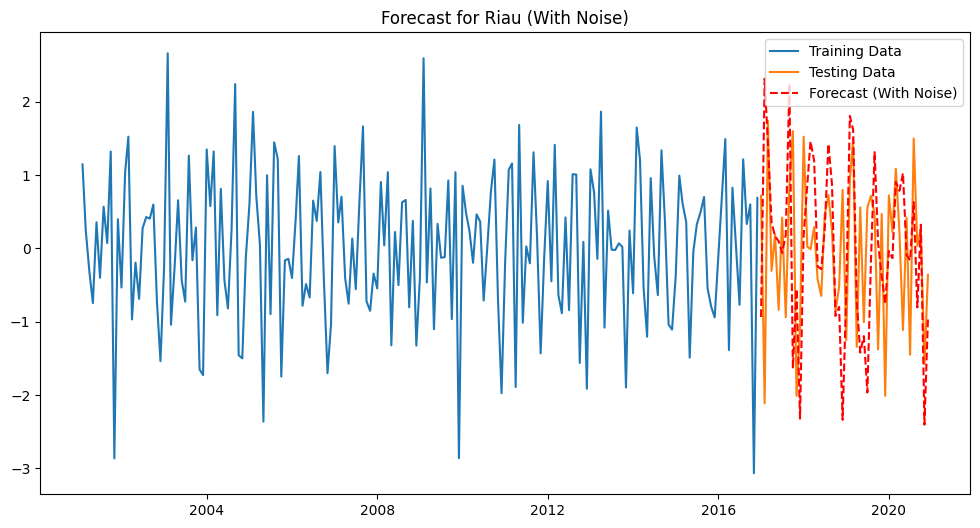

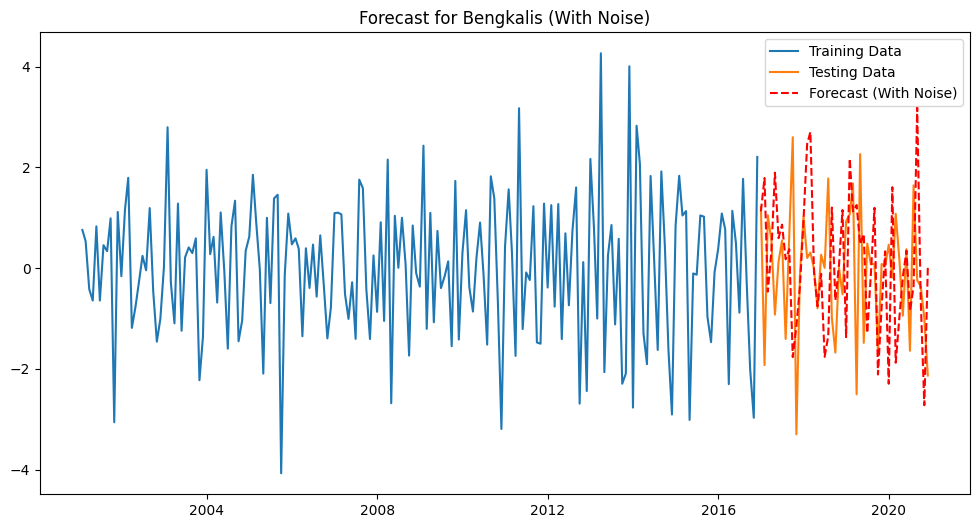

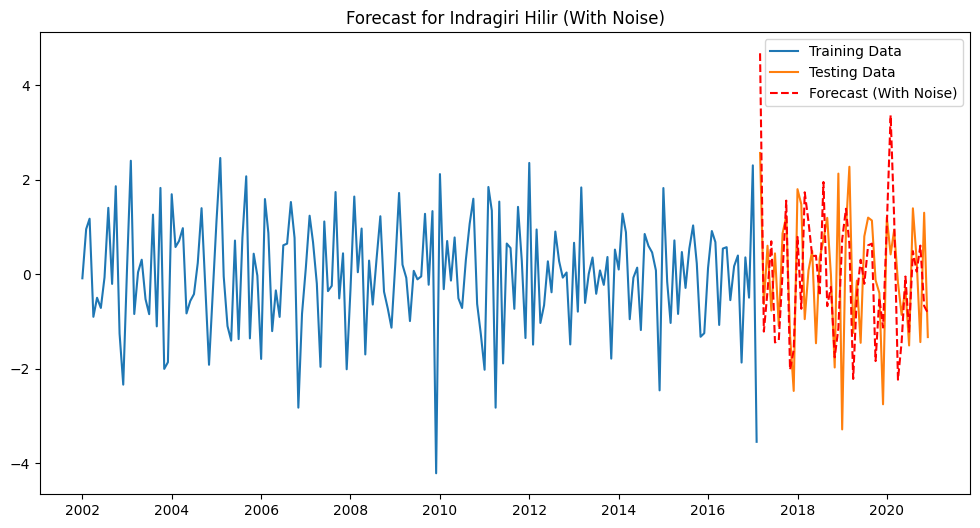

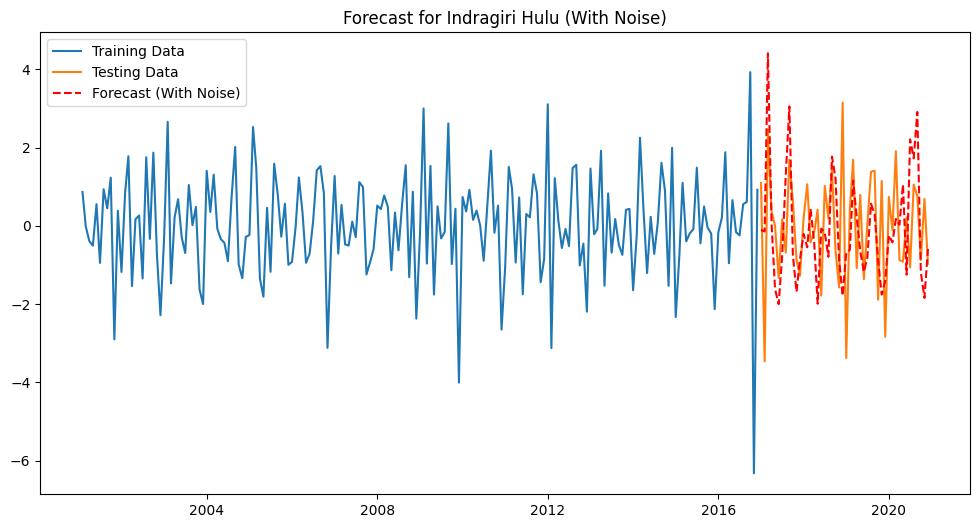

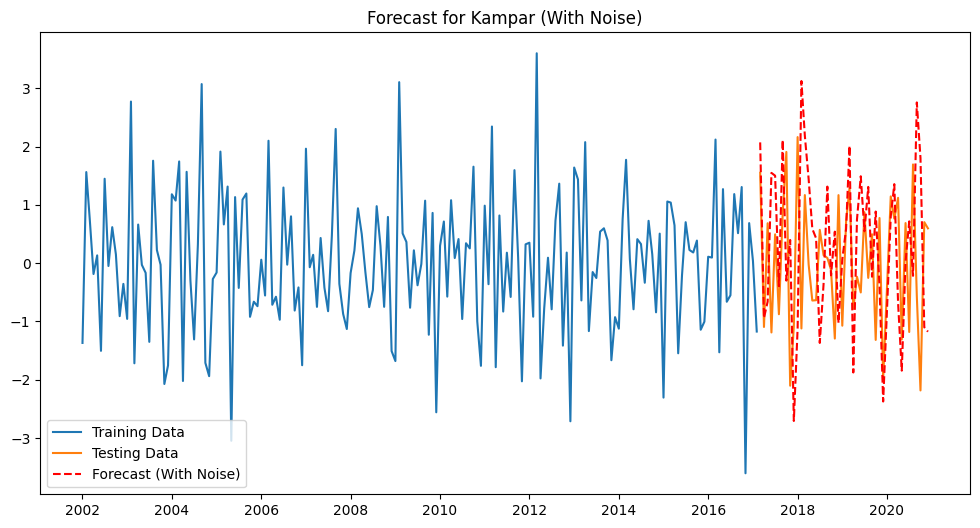

...

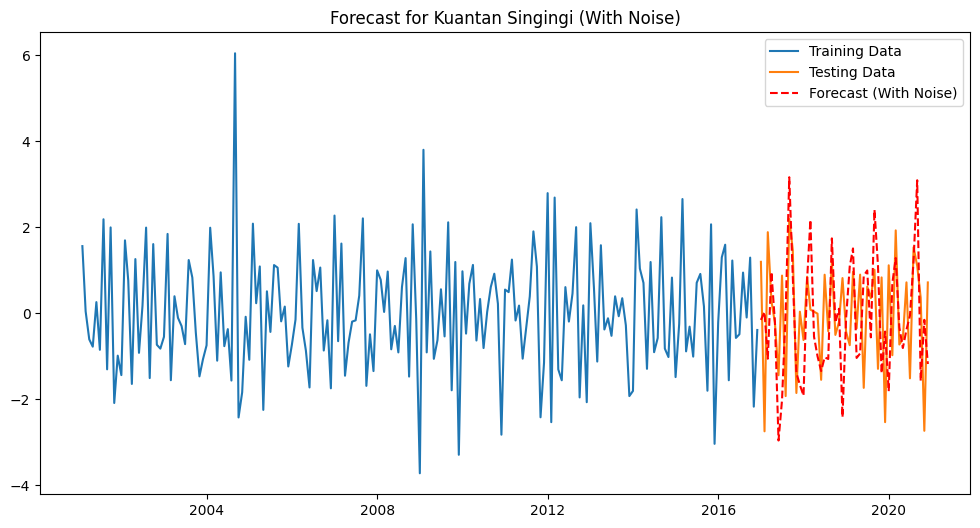

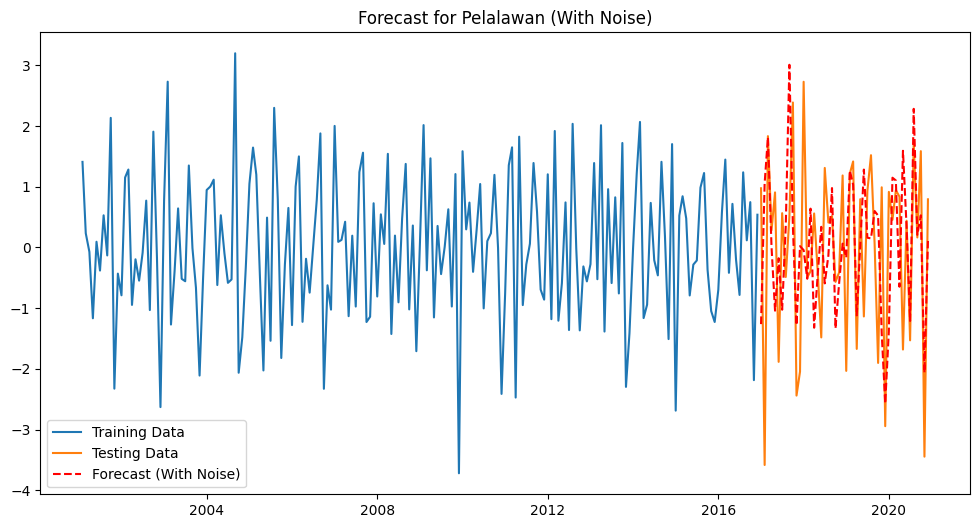

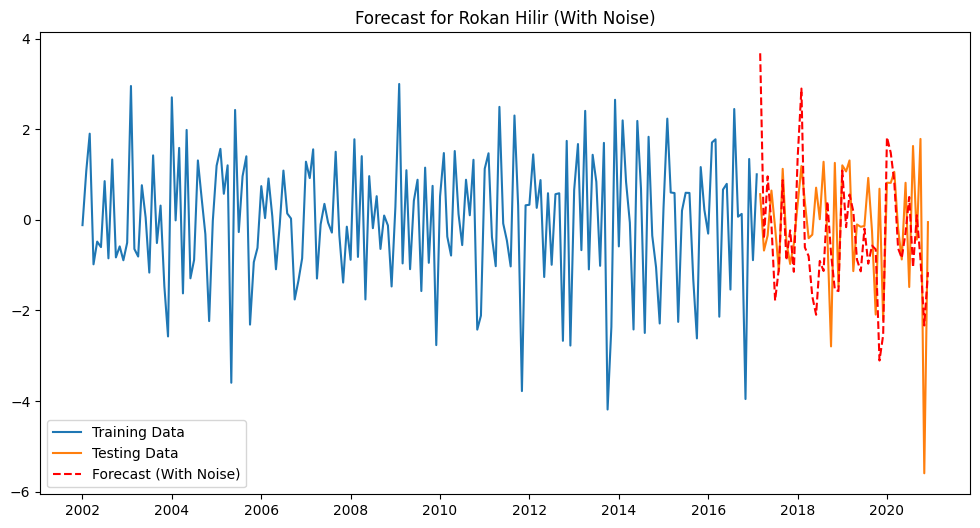

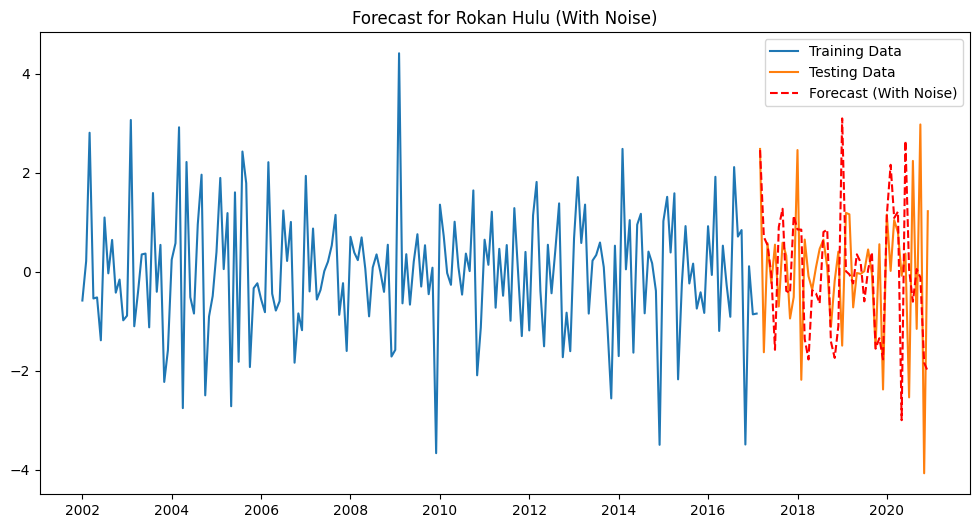

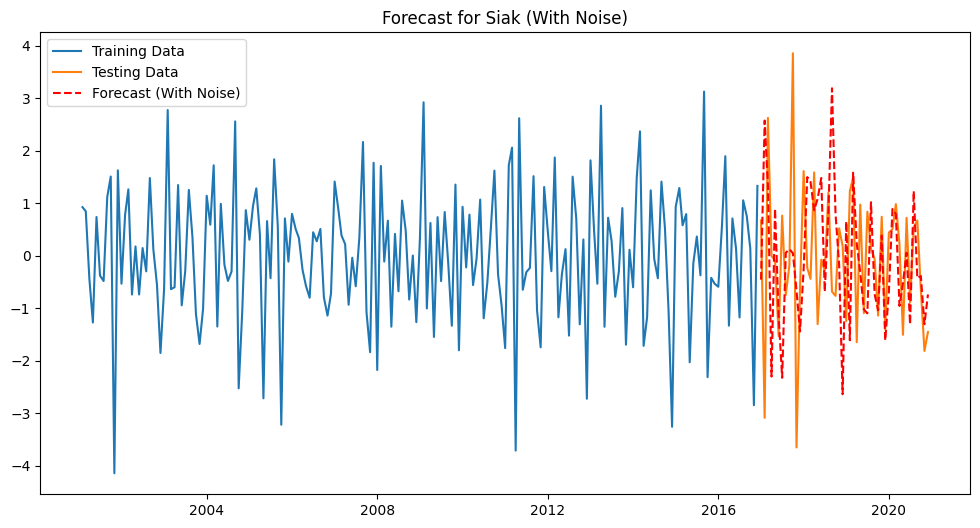

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.8)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast (With Noise)', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} (With Noise)")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_df_80_20 = pd.DataFrame(results)





Region: Riau - AIC: 452.47
                                       SARIMAX Results                                       
Dep. Variable:     Rata-rata Suhu (°C) - Differenced   No. Observations:                  215
Model:                SARIMAX(1, 1, 2)x(1, 1, 2, 12)   Log Likelihood                -219.237
Date:                               Fri, 27 Dec 2024   AIC                            452.474
Time:                                       22:51:56   BIC                            475.632
Sample:                                   02-01-2001   HQIC                           461.844
                                        - 12-01-2018                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0927      0.096     -0.969      0.333      -0.

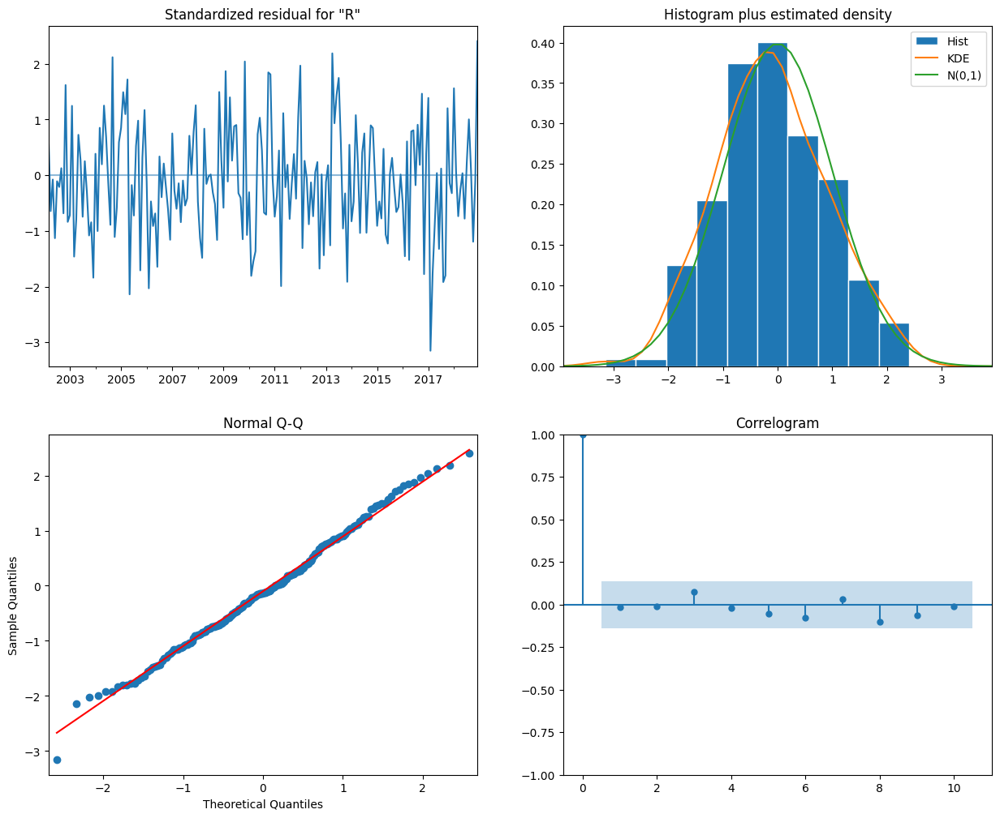

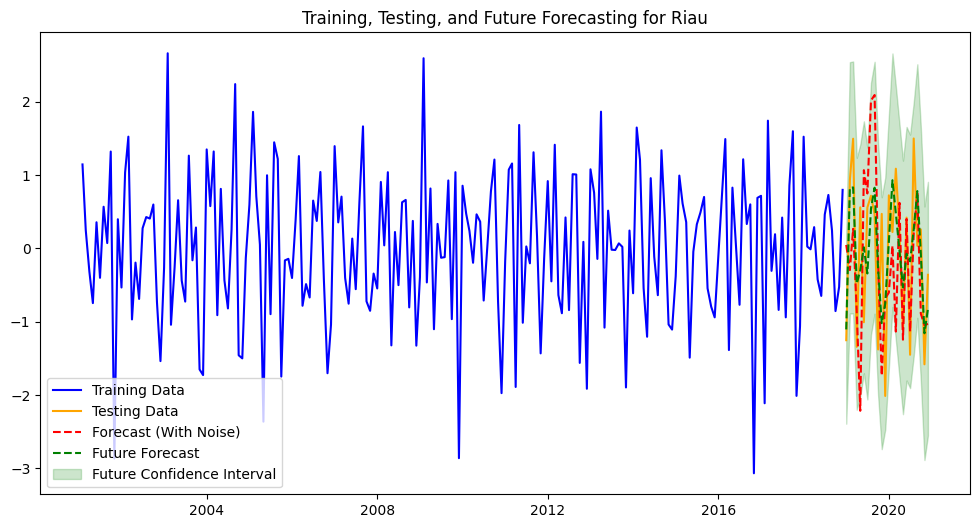

Region: Bengkalis - AIC: 620.46
                                       SARIMAX Results                                       
Dep. Variable:     Rata-rata Suhu (°C) - Differenced   No. Observations:                  215
Model:              SARIMAX(0, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -306.229
Date:                               Fri, 27 Dec 2024   AIC                            620.457
Time:                                       22:52:08   BIC                            633.690
Sample:                                   02-01-2001   HQIC                           625.811
                                        - 12-01-2018                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.8360      0.038    -48.592      0.000    

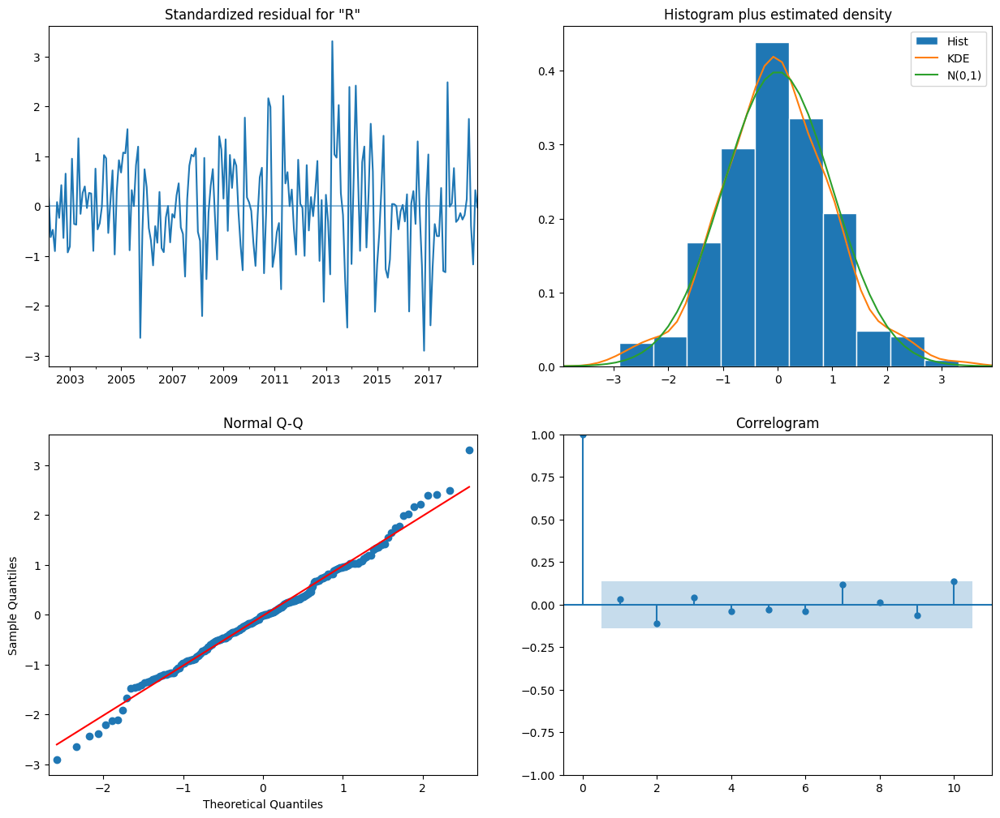

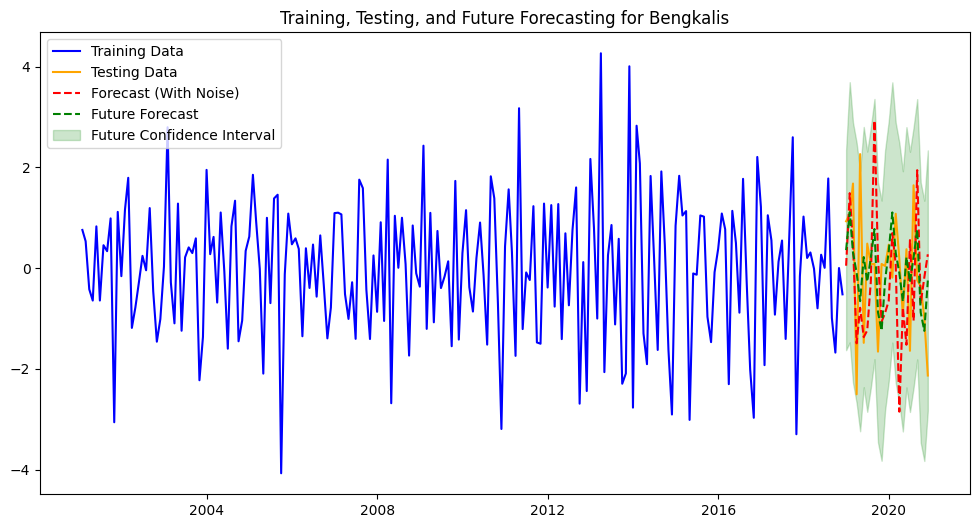

Region: Indragiri Hilir - AIC: 516.52
                                       SARIMAX Results                                       
Dep. Variable:     Rata-rata Suhu (°C) - Differenced   No. Observations:                  205
Model:              SARIMAX(0, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -254.260
Date:                               Fri, 27 Dec 2024   AIC                            516.520
Time:                                       22:52:20   BIC                            529.550
Sample:                                   01-01-2002   HQIC                           521.798
                                        - 01-01-2019                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.9214      0.033    -58.854      0.0

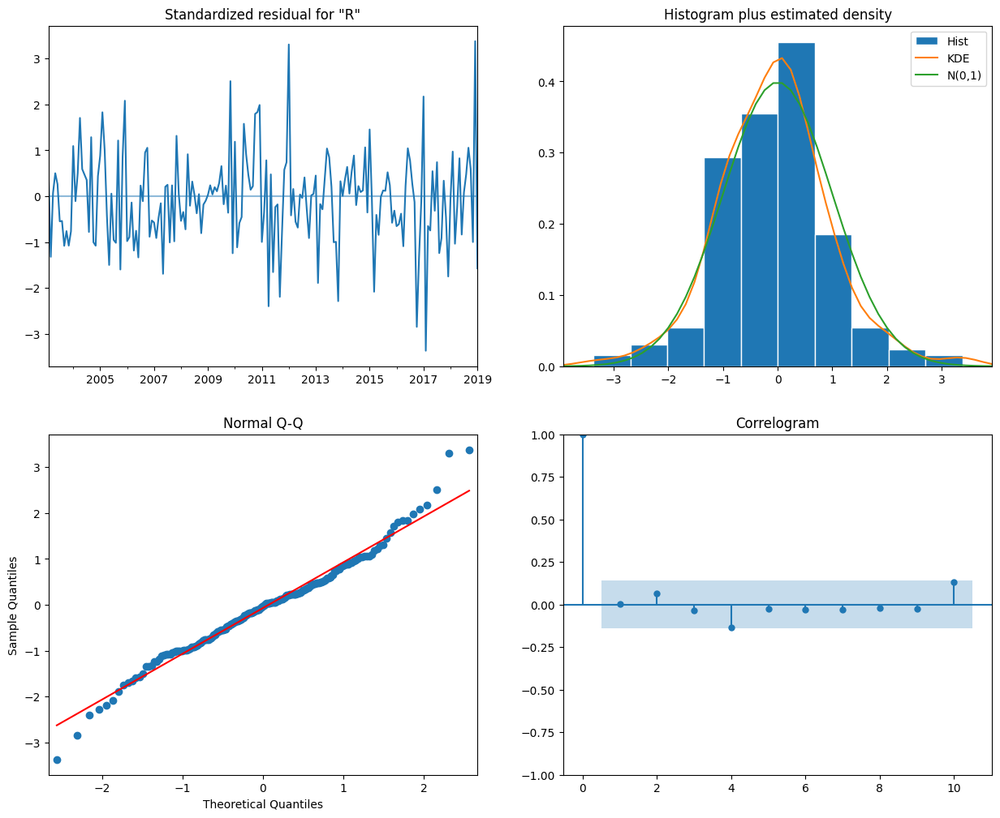

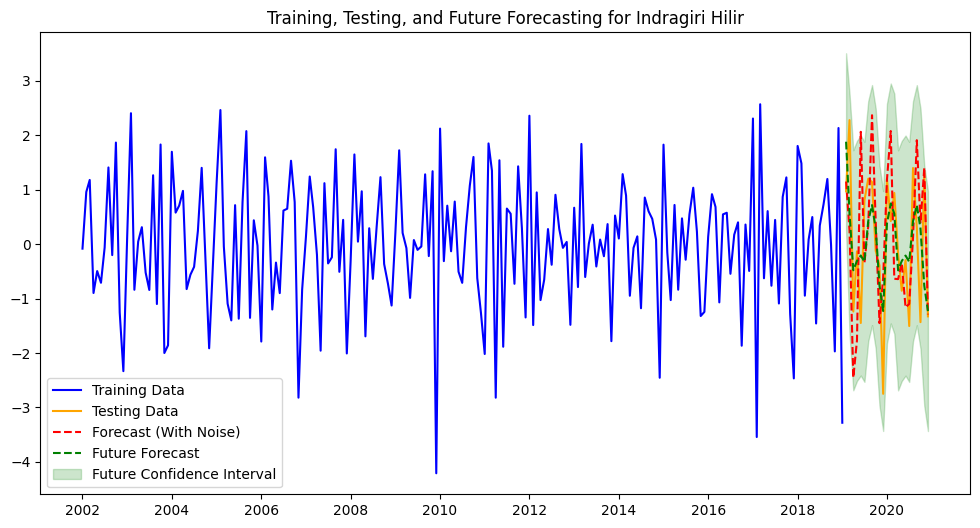

Region: Indragiri Hulu - AIC: 591.78
                                       SARIMAX Results                                       
Dep. Variable:     Rata-rata Suhu (°C) - Differenced   No. Observations:                  215
Model:              SARIMAX(0, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -291.889
Date:                               Fri, 27 Dec 2024   AIC                            591.777
Time:                                       22:52:27   BIC                            605.010
Sample:                                   02-01-2001   HQIC                           597.132
                                        - 12-01-2018                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.9100      0.033    -58.648      0.00

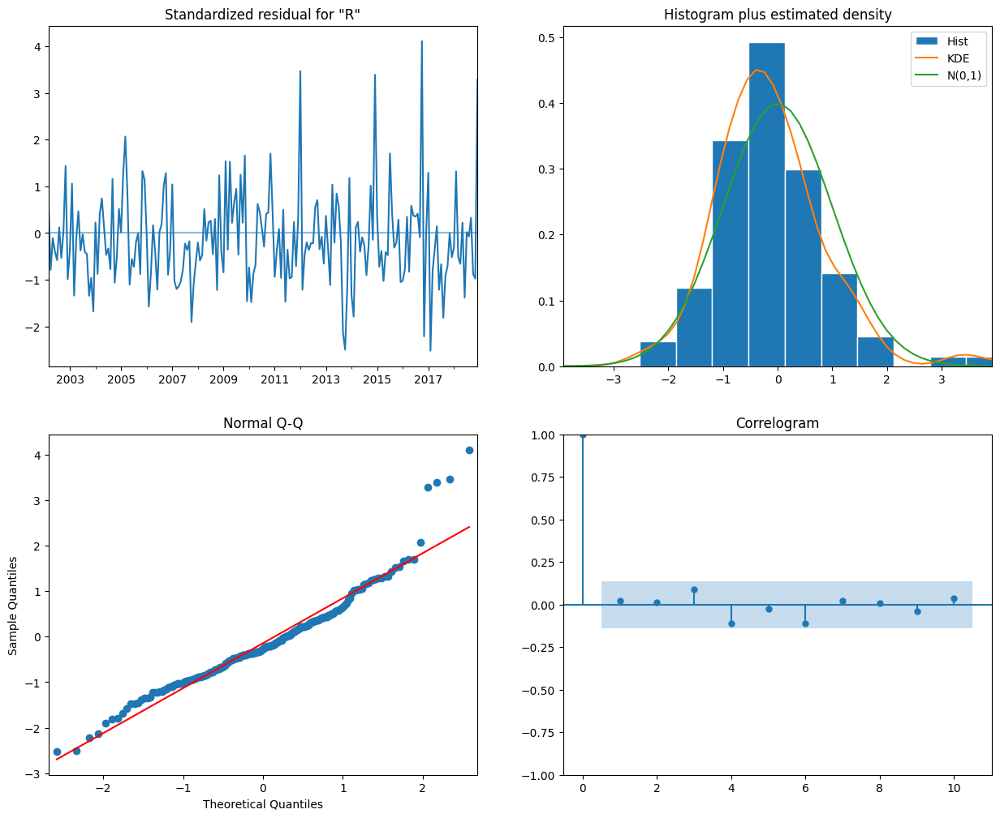

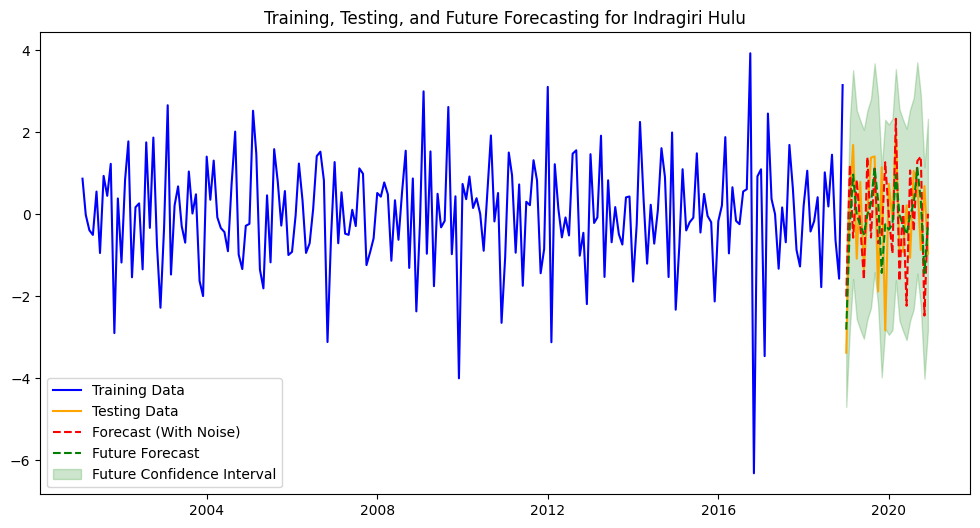

Region: Kampar - AIC: 502.08
                                       SARIMAX Results                                       
Dep. Variable:     Rata-rata Suhu (°C) - Differenced   No. Observations:                  205
Model:              SARIMAX(3, 1, 3)x(0, 1, [1], 12)   Log Likelihood                -243.038
Date:                               Fri, 27 Dec 2024   AIC                            502.076
Time:                                       22:52:38   BIC                            528.136
Sample:                                   01-01-2002   HQIC                           512.631
                                        - 01-01-2019                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9085      0.082    -11.026      0.000      -

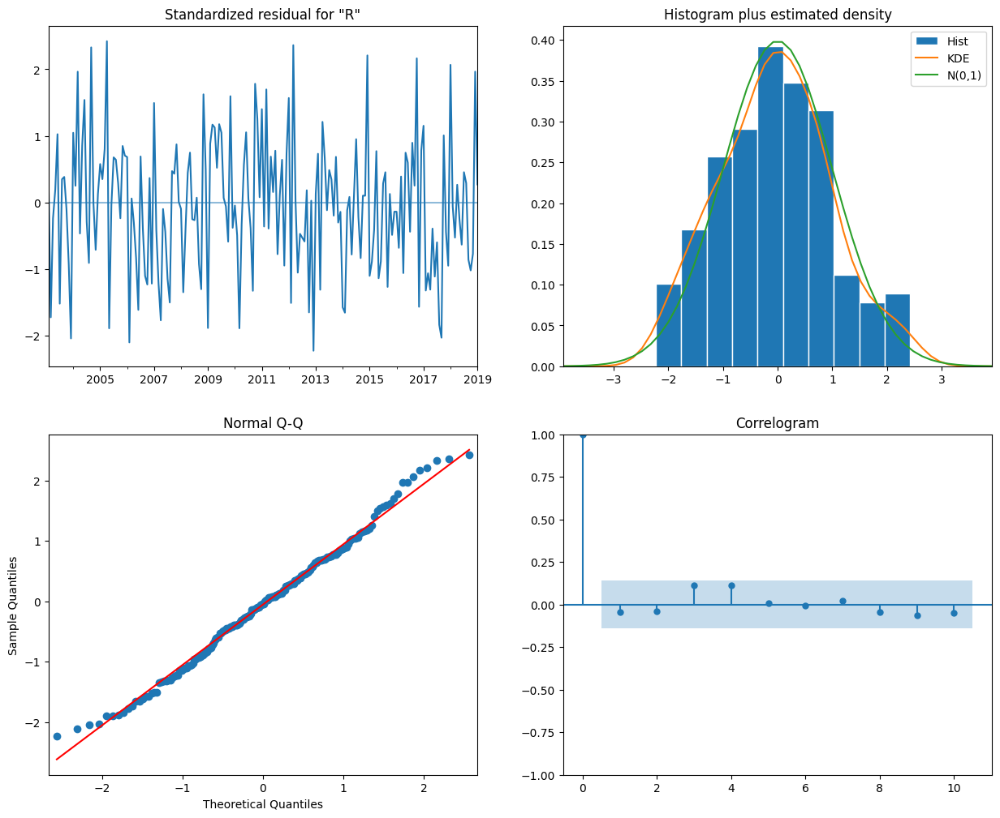

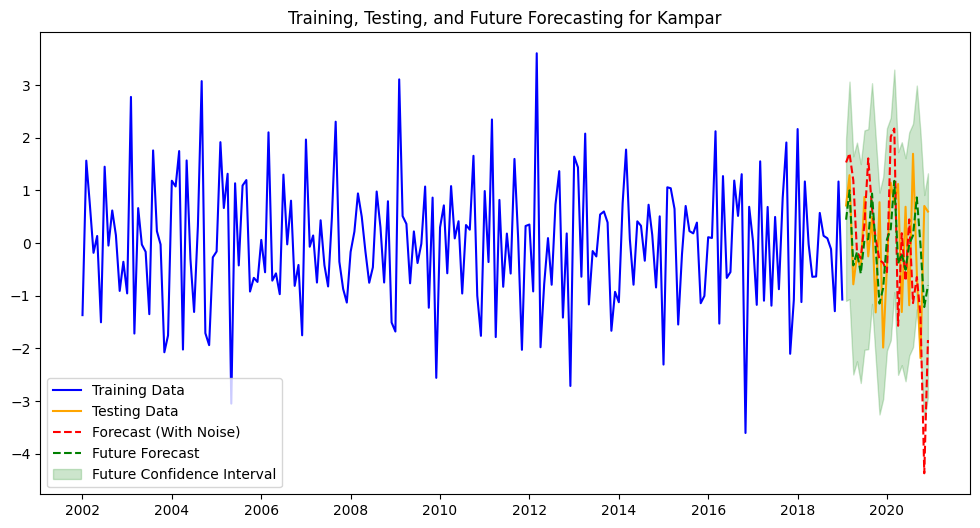

Region: Kepulauan Meranti - AIC: 524.39
                                        SARIMAX Results                                        
Dep. Variable:       Rata-rata Suhu (°C) - Differenced   No. Observations:                  215
Model:             SARIMAX(2, 1, 3)x(1, 1, [1, 2], 12)   Log Likelihood                -253.193
Date:                                 Fri, 27 Dec 2024   AIC                            524.386
Time:                                         22:52:53   BIC                            554.161
Sample:                                     02-01-2001   HQIC                           536.433
                                          - 12-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5148      0.211  

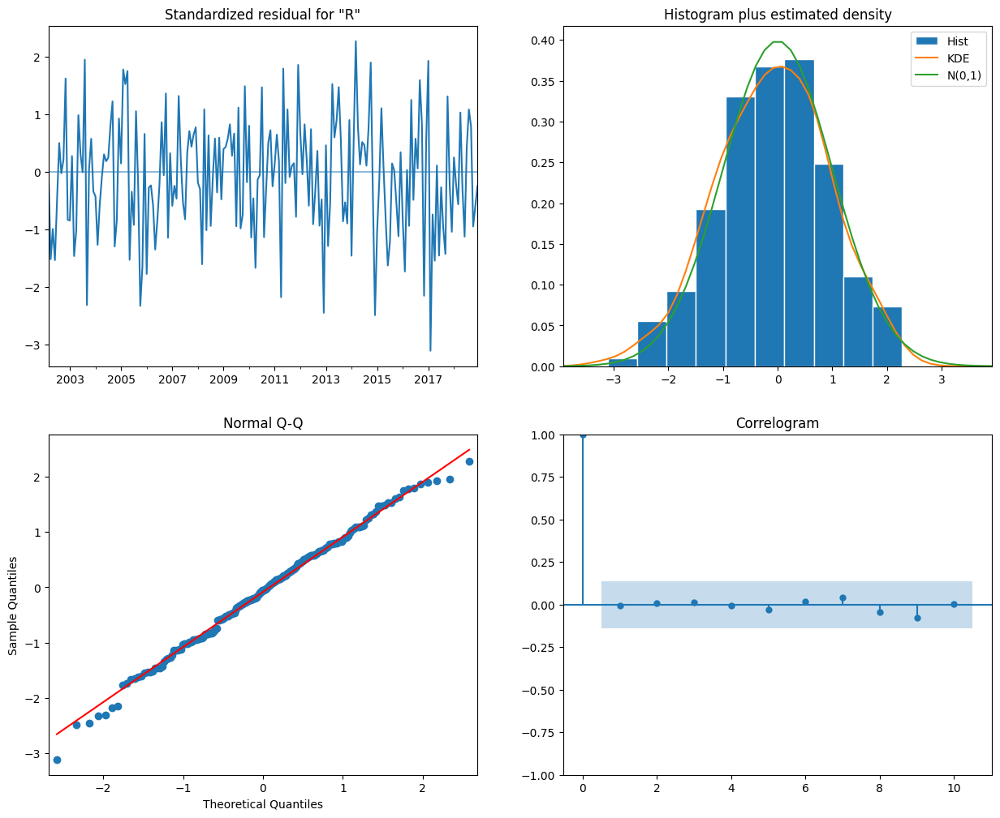

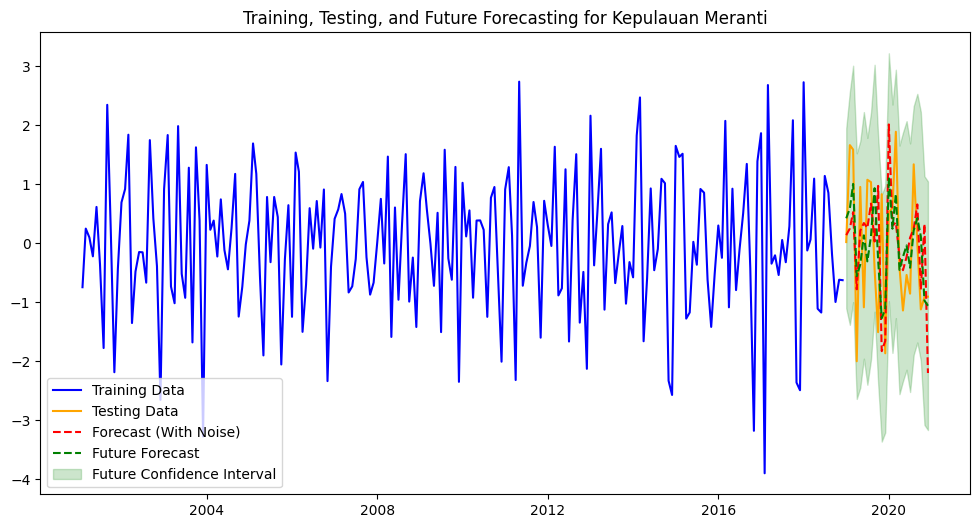

Region: Kota Dumai - AIC: 758.78
                                       SARIMAX Results                                       
Dep. Variable:     Rata-rata Suhu (°C) - Differenced   No. Observations:                  215
Model:              SARIMAX(0, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -375.388
Date:                               Fri, 27 Dec 2024   AIC                            758.775
Time:                                       22:52:58   BIC                            772.009
Sample:                                   02-01-2001   HQIC                           764.130
                                        - 12-01-2018                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.8778      0.041    -45.581      0.000   

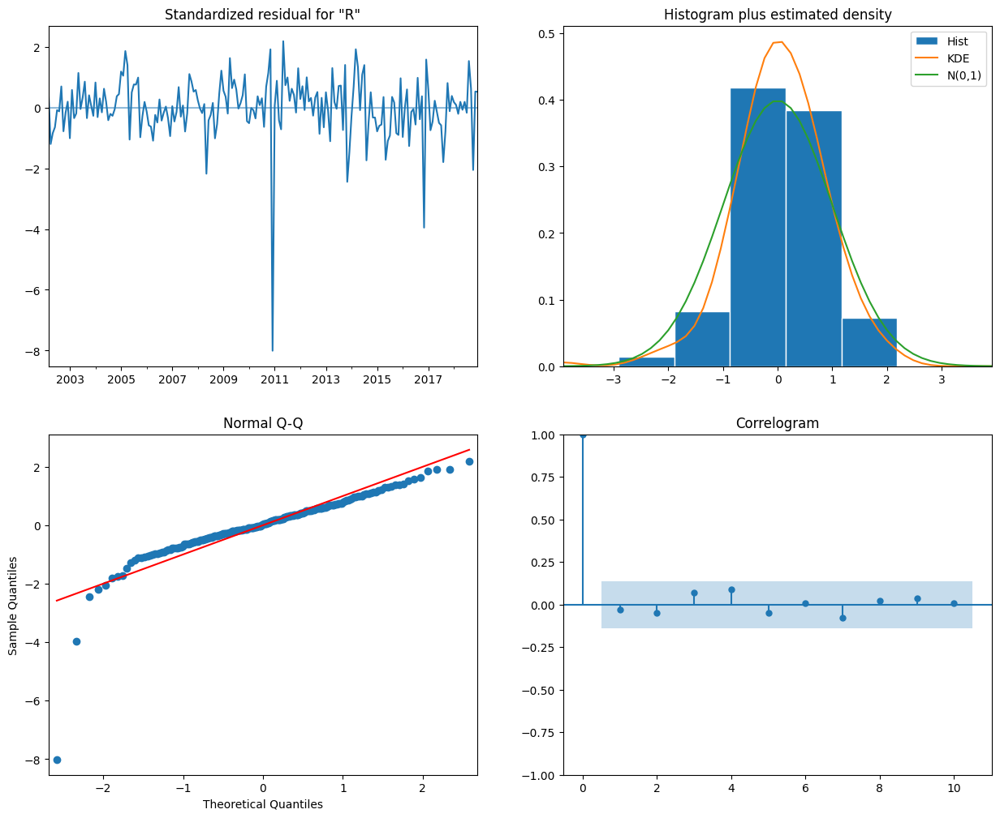

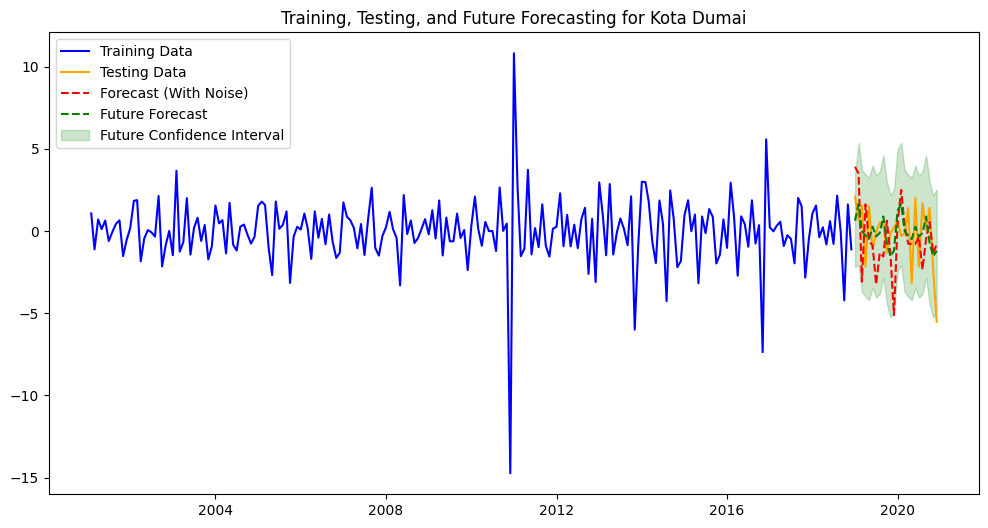

Region: Kota Pekanbaru - AIC: 708.82
                                       SARIMAX Results                                       
Dep. Variable:     Rata-rata Suhu (°C) - Differenced   No. Observations:                  192
Model:              SARIMAX(1, 1, 3)x(0, 1, [1], 12)   Log Likelihood                -348.411
Date:                               Fri, 27 Dec 2024   AIC                            708.823
Time:                                       22:53:06   BIC                            727.947
Sample:                                            0   HQIC                           716.577
                                               - 192                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8492      0.079    -10.768      0.00

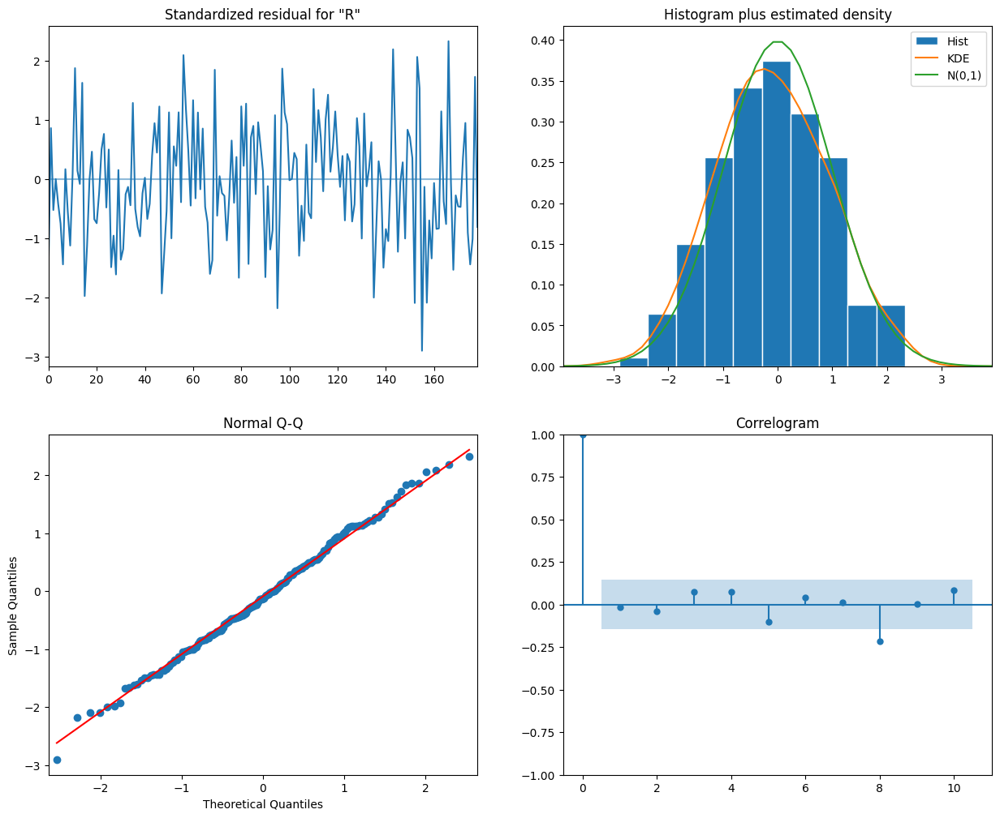

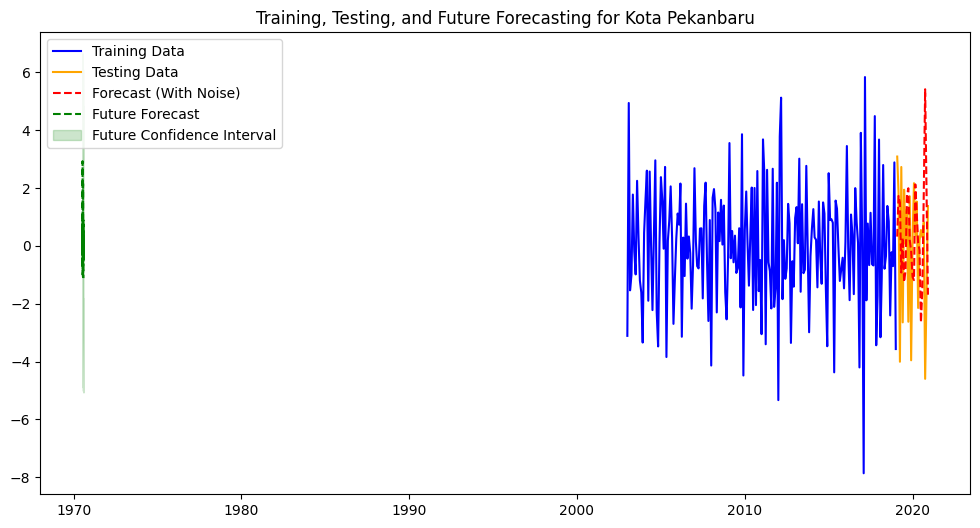

KeyboardInterrupt: 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with training, testing, and forecasting results
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.9)
    train, test = ts[:train_size], ts[train_size:]

    # # Fit SARIMA model on training data
    # model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    # model_fit = model.fit(disp=False)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, S))
    model_fit = model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(model_fit.aic, 2)}")
    print(model_fit.summary())

    # Diagnostics plot
    model_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean
    future_ci = forecast.conf_int()

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Future Forecasting based on test size
    future_steps = len(test)
    future_forecast = model_fit.get_forecast(steps=future_steps)
    future_forecast_mean = future_forecast.predicted_mean
    future_forecast_ci = future_forecast.conf_int()

    # Combine training, testing, and future forecasting for plotting
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data', color='blue')
    plt.plot(test, label='Testing Data', color='orange')
    plt.plot(test.index, forecast_with_noise, label='Forecast (With Noise)', color='red', linestyle='dashed')
    plt.plot(future_forecast_mean.index, future_forecast_mean, label='Future Forecast', color='green', linestyle='dashed')
    plt.fill_between(future_forecast_mean.index,
                     future_forecast_ci.iloc[:, 0],
                     future_forecast_ci.iloc[:, 1],
                     color='green', alpha=0.2, label='Future Confidence Interval')
    plt.title(f"Training, Testing, and Future Forecasting for {region}")
    plt.legend()
    plt.show()

    # Save results for analysis
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mean_absolute_error(test, forecast_with_noise),
        'MSE': mean_squared_error(test, forecast_with_noise),
        'RMSE': np.sqrt(mean_squared_error(test, forecast_with_noise))
    })

# Convert results to DataFrame
results_df_t9 = pd.DataFrame(results)


In [ ]:
results_df_t9

In [ ]:
results_df

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(1, 1, 2, 1, 1, 2, 12)",Riau,1.007000,1.787471,1.336963
1,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Bengkalis,1.437537,3.399977,1.843903
2,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hilir,1.161251,2.186797,1.478782
3,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hulu,1.357305,2.744209,1.656565
4,"SARIMA(3, 1, 3, 0, 1, 1, 12)",Kampar,1.421003,2.979886,1.726235
...,...,...,...,...,...
64,"SARIMA(3, 1, 3, 0, 1, 3, 12)",Kuantan Singingi,1.532381,3.147390,1.774088
65,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Pelalawan,1.512093,3.646339,1.909539
66,"SARIMA(1, 1, 3, 0, 1, 1, 12)",Rokan Hilir,1.175349,2.572415,1.603875
67,"SARIMA(3, 1, 3, 0, 1, 1, 12)",Rokan Hulu,1.392138,2.911256,1.706240


In [ ]:
results_df.to_excel('/content/drive/MyDrive/Hasil EM Forcasting/Hasil Forecasting 80 20.xlsx', index=False)

# **Train 90% dan Test 10%**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with training, testing, and forecasting results
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.9)
    train, test = ts[:train_size], ts[train_size:]

    # # Fit SARIMA model on training data
    # model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    # model_fit = model.fit(disp=False)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, S))
    model_fit = model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(model_fit.aic, 2)}")
    print(model_fit.summary())

    # Diagnostics plot
    model_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean
    future_ci = forecast.conf_int()

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Plot Training, Testing, and Future Forecast
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data', color='blue')
    plt.plot(test, label='Testing Data', color='orange')
    # Append future forecasting as extension with monthly frequency
    future_dates = pd.date_range(start=test.index[-1] + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='M')
    plt.plot(future_dates, forecast_with_noise, label='Future Forecast', color='red', linestyle='dashed')
    # Add confidence intervals for future forecast
    plt.fill_between(future_dates,
                    future_ci.iloc[:, 0],
                    future_ci.iloc[:, 1],
                    color='green', alpha=0.2, label='Future Confidence Interval')

    # Finalize the plot
    plt.title(f"Training, Testing, and Future Forecasting for {region}")
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(test), len(forecast_with_noise))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(test[:min_length_orig], forecast_with_noise[:min_length_orig])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")

    # Store the results in the list
    results.append({
        'Model': f"SARIMA({p},{d},{q}) x ({P},{D},{Q},{S})",
        'Kota/Kabupaten': region,
        'MAE': mae_sarima_orig,
        'MSE': mse_sarima_orig,
        'RMSE': rmse_sarima_orig
    })

    # Save results for analysis
    # results.append({
    #     'Model': f"SARIMA{model_config}",
    #     'Kota/Kabupaten': region,
    #     'MAE': mean_absolute_error(forecast_with_noise),
    #     'MSE': mean_squared_error(forecast_with_noise),
    #     'RMSE': np.sqrt(mean_squared_error(forecast_with_noise))
    # })

# Convert results to DataFrame
results_df_90 = pd.DataFrame(results)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
results_df_90

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(1,1,2) x (1,1,2,12)",Riau,1.247900,1.934905,1.391009
1,"SARIMA(0,1,2) x (0,1,1,12)",Bengkalis,1.254536,2.117108,1.455028
2,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hilir,0.981793,1.327796,1.152300
3,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hulu,1.385432,3.157902,1.777049
4,"SARIMA(3,1,3) x (0,1,1,12)",Kampar,1.020926,1.428636,1.195256
5,"SARIMA(2,1,3) x (1,1,2,12)",Kepulauan Meranti,1.372161,2.352386,1.533749
6,"SARIMA(0,1,2) x (0,1,1,12)",Kota Dumai,1.797422,4.521212,2.126314
7,"SARIMA(1,1,3) x (0,1,1,12)",Kota Pekanbaru,2.512561,9.477553,3.078563
8,"SARIMA(3,1,3) x (0,1,3,12)",Kuantan Singingi,1.267119,2.434150,1.560176
9,"SARIMA(0,1,2) x (0,1,1,12)",Pelalawan,1.302669,2.278651,1.509520


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with training, testing, and forecasting results
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.85)
    train, test = ts[:train_size], ts[train_size:]

    # # Fit SARIMA model on training data
    # model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    # model_fit = model.fit(disp=False)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, S))
    model_fit = model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(model_fit.aic, 2)}")
    print(model_fit.summary())

    # Diagnostics plot
    model_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean
    future_ci = forecast.conf_int()

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Plot Training, Testing, and Future Forecast
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data', color='blue')
    plt.plot(test, label='Testing Data', color='orange')
    # Append future forecasting as extension with monthly frequency
    future_dates = pd.date_range(start=test.index[-1] + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='M')
    plt.plot(future_dates, forecast_with_noise, label='Future Forecast', color='red', linestyle='dashed')
    # Add confidence intervals for future forecast
    plt.fill_between(future_dates,
                    future_ci.iloc[:, 0],
                    future_ci.iloc[:, 1],
                    color='green', alpha=0.2, label='Future Confidence Interval')

    # Finalize the plot
    plt.title(f"Training, Testing, and Future Forecasting for {region}")
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(test), len(forecast_with_noise))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(test[:min_length_orig], forecast_with_noise[:min_length_orig])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")

    # Store the results in the list
    results.append({
        'Model': f"SARIMA({p},{d},{q}) x ({P},{D},{Q},{S})",
        'Kota/Kabupaten': region,
        'MAE': mae_sarima_orig,
        'MSE': mse_sarima_orig,
        'RMSE': rmse_sarima_orig
    })

    # Save results for analysis
    # results.append({
    #     'Model': f"SARIMA{model_config}",
    #     'Kota/Kabupaten': region,
    #     'MAE': mean_absolute_error(forecast_with_noise),
    #     'MSE': mean_squared_error(forecast_with_noise),
    #     'RMSE': np.sqrt(mean_squared_error(forecast_with_noise))
    # })

# Convert results to DataFrame
results_df_85 = pd.DataFrame(results)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
results_df_85

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(1,1,2) x (1,1,2,12)",Riau,0.977942,1.535016,1.238958
1,"SARIMA(0,1,2) x (0,1,1,12)",Bengkalis,1.367628,2.618848,1.618285
2,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hilir,1.334705,2.709400,1.646026
3,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hulu,1.356358,2.708937,1.645885
4,"SARIMA(3,1,3) x (0,1,1,12)",Kampar,1.250442,2.612583,1.616349
5,"SARIMA(2,1,3) x (1,1,2,12)",Kepulauan Meranti,1.151640,1.965934,1.402118
6,"SARIMA(0,1,2) x (0,1,1,12)",Kota Dumai,1.908168,5.648849,2.376731
7,"SARIMA(1,1,3) x (0,1,1,12)",Kota Pekanbaru,2.215579,7.648839,2.765653
8,"SARIMA(3,1,3) x (0,1,3,12)",Kuantan Singingi,0.921582,1.212701,1.101227
9,"SARIMA(0,1,2) x (0,1,1,12)",Pelalawan,1.309285,2.504265,1.582487


# **Train 80% dan Test 20%**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with training, testing, and forecasting results
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.8)
    train, test = ts[:train_size], ts[train_size:]

    # # Fit SARIMA model on training data
    # model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    # model_fit = model.fit(disp=False)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, S))
    model_fit = model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(model_fit.aic, 2)}")
    print(model_fit.summary())

    # Diagnostics plot
    model_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean
    future_ci = forecast.conf_int()

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Plot Training, Testing, and Future Forecast
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data', color='blue')
    plt.plot(test, label='Testing Data', color='orange')
    # Append future forecasting as extension with monthly frequency
    future_dates = pd.date_range(start=test.index[-1] + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='M')
    plt.plot(future_dates, forecast_with_noise, label='Future Forecast', color='red', linestyle='dashed')
    # Add confidence intervals for future forecast
    plt.fill_between(future_dates,
                    future_ci.iloc[:, 0],
                    future_ci.iloc[:, 1],
                    color='green', alpha=0.2, label='Future Confidence Interval')

    # Finalize the plot
    plt.title(f"Training, Testing, and Future Forecasting for {region}")
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(test), len(forecast_with_noise))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(test[:min_length_orig], forecast_with_noise[:min_length_orig])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")

    # Store the results in the list
    results.append({
        'Model': f"SARIMA({p},{d},{q}) x ({P},{D},{Q},{S})",
        'Kota/Kabupaten': region,
        'MAE': mae_sarima_orig,
        'MSE': mse_sarima_orig,
        'RMSE': rmse_sarima_orig
    })

    # Save results for analysis
    # results.append({
    #     'Model': f"SARIMA{model_config}",
    #     'Kota/Kabupaten': region,
    #     'MAE': mean_absolute_error(forecast_with_noise),
    #     'MSE': mean_squared_error(forecast_with_noise),
    #     'RMSE': np.sqrt(mean_squared_error(forecast_with_noise))
    # })

# Convert results to DataFrame
results_df_80 = pd.DataFrame(results)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
results_df_80

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(1,1,2) x (1,1,2,12)",Riau,1.103101,1.900426,1.378559
1,"SARIMA(0,1,2) x (0,1,1,12)",Bengkalis,1.492858,3.662910,1.913873
2,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hilir,1.285275,2.575850,1.604946
3,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hulu,1.340247,3.088697,1.757469
4,"SARIMA(3,1,3) x (0,1,1,12)",Kampar,1.305962,2.240109,1.496699
5,"SARIMA(2,1,3) x (1,1,2,12)",Kepulauan Meranti,1.185092,2.438212,1.561478
6,"SARIMA(0,1,2) x (0,1,1,12)",Kota Dumai,1.543229,3.898310,1.974414
7,"SARIMA(1,1,3) x (0,1,1,12)",Kota Pekanbaru,2.442625,9.716318,3.117101
8,"SARIMA(3,1,3) x (0,1,3,12)",Kuantan Singingi,1.429612,3.114959,1.764925
9,"SARIMA(0,1,2) x (0,1,1,12)",Pelalawan,1.675630,4.053094,2.013230


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with training, testing, and forecasting results
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.75)
    train, test = ts[:train_size], ts[train_size:]

    # # Fit SARIMA model on training data
    # model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    # model_fit = model.fit(disp=False)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, S))
    model_fit = model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(model_fit.aic, 2)}")
    print(model_fit.summary())

    # Diagnostics plot
    model_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean
    future_ci = forecast.conf_int()

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Plot Training, Testing, and Future Forecast
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data', color='blue')
    plt.plot(test, label='Testing Data', color='orange')
    # Append future forecasting as extension with monthly frequency
    future_dates = pd.date_range(start=test.index[-1] + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='M')
    plt.plot(future_dates, forecast_with_noise, label='Future Forecast', color='red', linestyle='dashed')
    # Add confidence intervals for future forecast
    plt.fill_between(future_dates,
                    future_ci.iloc[:, 0],
                    future_ci.iloc[:, 1],
                    color='green', alpha=0.2, label='Future Confidence Interval')

    # Finalize the plot
    plt.title(f"Training, Testing, and Future Forecasting for {region}")
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(test), len(forecast_with_noise))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(test[:min_length_orig], forecast_with_noise[:min_length_orig])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")

    # Store the results in the list
    results.append({
        'Model': f"SARIMA({p},{d},{q}) x ({P},{D},{Q},{S})",
        'Kota/Kabupaten': region,
        'MAE': mae_sarima_orig,
        'MSE': mse_sarima_orig,
        'RMSE': rmse_sarima_orig
    })

    # Save results for analysis
    # results.append({
    #     'Model': f"SARIMA{model_config}",
    #     'Kota/Kabupaten': region,
    #     'MAE': mean_absolute_error(forecast_with_noise),
    #     'MSE': mean_squared_error(forecast_with_noise),
    #     'RMSE': np.sqrt(mean_squared_error(forecast_with_noise))
    # })

# Convert results to DataFrame
results_df_75 = pd.DataFrame(results)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
results_df_75

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(1,1,2) x (1,1,2,12)",Riau,1.065782,1.657628,1.287489
1,"SARIMA(0,1,2) x (0,1,1,12)",Bengkalis,1.321605,2.679147,1.636810
2,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hilir,1.443428,3.134445,1.770436
3,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hulu,1.280399,2.774348,1.665637
4,"SARIMA(3,1,3) x (0,1,1,12)",Kampar,1.160787,1.994391,1.412229
5,"SARIMA(2,1,3) x (1,1,2,12)",Kepulauan Meranti,1.254925,2.355377,1.534724
6,"SARIMA(0,1,2) x (0,1,1,12)",Kota Dumai,1.879468,5.460473,2.336766
7,"SARIMA(1,1,3) x (0,1,1,12)",Kota Pekanbaru,2.583054,11.044199,3.323281
8,"SARIMA(3,1,3) x (0,1,3,12)",Kuantan Singingi,1.341538,2.549974,1.596864
9,"SARIMA(0,1,2) x (0,1,1,12)",Pelalawan,1.225520,2.193900,1.481182


# **Train 70% dan Test 30%**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with training, testing, and forecasting results
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.7)
    train, test = ts[:train_size], ts[train_size:]

    # # Fit SARIMA model on training data
    # model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    # model_fit = model.fit(disp=False)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, S))
    model_fit = model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(model_fit.aic, 2)}")
    print(model_fit.summary())

    # Diagnostics plot
    model_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean
    future_ci = forecast.conf_int()

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Plot Training, Testing, and Future Forecast
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data', color='blue')
    plt.plot(test, label='Testing Data', color='orange')
    # Append future forecasting as extension with monthly frequency
    future_dates = pd.date_range(start=test.index[-1] + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='M')
    plt.plot(future_dates, forecast_with_noise, label='Future Forecast', color='red', linestyle='dashed')
    # Add confidence intervals for future forecast
    plt.fill_between(future_dates,
                    future_ci.iloc[:, 0],
                    future_ci.iloc[:, 1],
                    color='green', alpha=0.2, label='Future Confidence Interval')

    # Finalize the plot
    plt.title(f"Training, Testing, and Future Forecasting for {region}")
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(test), len(forecast_with_noise))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(test[:min_length_orig], forecast_with_noise[:min_length_orig])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")

    # Store the results in the list
    results.append({
        'Model': f"SARIMA({p},{d},{q}) x ({P},{D},{Q},{S})",
        'Kota/Kabupaten': region,
        'MAE': mae_sarima_orig,
        'MSE': mse_sarima_orig,
        'RMSE': rmse_sarima_orig
    })

    # Save results for analysis
    # results.append({
    #     'Model': f"SARIMA{model_config}",
    #     'Kota/Kabupaten': region,
    #     'MAE': mean_absolute_error(forecast_with_noise),
    #     'MSE': mean_squared_error(forecast_with_noise),
    #     'RMSE': np.sqrt(mean_squared_error(forecast_with_noise))
    # })

# Convert results to DataFrame
results_df_70 = pd.DataFrame(results)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
results_df_70

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(1,1,2) x (1,1,2,12)",Riau,0.922788,1.341735,1.158333
1,"SARIMA(0,1,2) x (0,1,1,12)",Bengkalis,1.315133,2.755510,1.659973
2,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hilir,1.042098,2.070353,1.438872
3,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hulu,1.340857,3.162464,1.778332
4,"SARIMA(3,1,3) x (0,1,1,12)",Kampar,1.137471,1.987409,1.409755
5,"SARIMA(2,1,3) x (1,1,2,12)",Kepulauan Meranti,1.347299,2.825766,1.681001
6,"SARIMA(0,1,2) x (0,1,1,12)",Kota Dumai,1.964932,5.531549,2.351924
7,"SARIMA(1,1,3) x (0,1,1,12)",Kota Pekanbaru,2.847015,11.585250,3.403711
8,"SARIMA(3,1,3) x (0,1,3,12)",Kuantan Singingi,1.416949,2.957150,1.719637
9,"SARIMA(0,1,2) x (0,1,1,12)",Pelalawan,1.223753,2.560384,1.600120


In [ ]:
import pandas as pd

results_df_90['Data Train dan Test'] = 'Train 90% Test 10%'
results_df_80['Data Train dan Test'] = 'Train 80% Test 20%'
results_df_70['Data Train dan Test'] = 'Train 70% Test 30%'

all_predictions = pd.concat([results_df_70, results_df_80, results_df_90], ignore_index=True)

# Pastikan kolom evaluasi berisi nilai numerik saja
for col in ['MAE', 'MSE', 'RMSE']:
    all_predictions[col] = pd.to_numeric(all_predictions[col], errors='coerce')

# Drop baris dengan nilai NaN akibat konversi
all_predictions = all_predictions.dropna(subset=['MAE', 'MSE', 'RMSE'])

all_predictions

,Model,Kota/Kabupaten,MAE,MSE,RMSE,Data Train dan Test
0,"SARIMA(1,1,2) x (1,1,2,12)",Riau,0.922788,1.341735,1.158333,Train 70% Test 30%
1,"SARIMA(0,1,2) x (0,1,1,12)",Bengkalis,1.315133,2.755510,1.659973,Train 70% Test 30%
2,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hilir,1.042098,2.070353,1.438872,Train 70% Test 30%
3,"SARIMA(0,1,2) x (0,1,1,12)",Indragiri Hulu,1.340857,3.162464,1.778332,Train 70% Test 30%
4,"SARIMA(3,1,3) x (0,1,1,12)",Kampar,1.137471,1.987409,1.409755,Train 70% Test 30%
5,"SARIMA(2,1,3) x (1,1,2,12)",Kepulauan Meranti,1.347299,2.825766,1.681001,Train 70% Test 30%
6,"SARIMA(0,1,2) x (0,1,1,12)",Kota Dumai,1.964932,5.531549,2.351924,Train 70% Test 30%
7,"SARIMA(1,1,3) x (0,1,1,12)",Kota Pekanbaru,2.847015,11.585250,3.403711,Train 70% Test 30%
8,"SARIMA(3,1,3) x (0,1,3,12)",Kuantan Singingi,1.416949,2.957150,1.719637,Train 70% Test 30%
9,"SARIMA(0,1,2) x (0,1,1,12)",Pelalawan,1.223753,2.560384,1.600120,Train 70% Test 30%


In [ ]:
# Perbandingan statistik evaluasi berdasarkan Data Train dan Test per region
evaluasi_stat = all_predictions.groupby(['Kota/Kabupaten', 'Data Train dan Test'])[['MAE', 'MSE', 'RMSE']].mean()

evaluasi_stat

MAE        MSE      RMSE
Kota/Kabupaten    Data Train dan Test                               
Bengkalis         Train 70% Test 30%   1.315133   2.755510  1.659973
                  Train 80% Test 20%   1.492858   3.662910  1.913873
                  Train 90% Test 10%   1.254536   2.117108  1.455028
Indragiri Hilir   Train 70% Test 30%   1.042098   2.070353  1.438872
                  Train 80% Test 20%   1.285275   2.575850  1.604946
                  Train 90% Test 10%   0.981793   1.327796  1.152300
Indragiri Hulu    Train 70% Test 30%   1.340857   3.162464  1.778332
                  Train 80% Test 20%   1.340247   3.088697  1.757469
                  Train 90% Test 10%   1.385432   3.157902  1.777049
Kampar            Train 70% Test 30%   1.137471   1.987409  1.409755
                  Train 80% Test 20%   1.305962   2.240109  1.496699
                  Train 90% Test 10%   1.020926   1.428636  1.195256
Kepulauan Meranti Train 70% Test 30%   1.347299   2.825766  1.681001
                  Train 80% Test 20%   1.185092   2.438212  1.561478
                  Train 90% Test 10%   1.372161   2.352386  1.533749
Kota Dumai        Train 70% Test 30%   1.964932   5.531549  2.351924
                  Train 80% Test 20%   1.543229   3.898310  1.974414
                  Train 90% Test 10%   1.797422   4.521212  2.126314
Kota Pekanbaru    Train 70% Test 30%   2.847015  11.585250  3.403711
                  Train 80% Test 20%   2.442625   9.716318  3.117101
                  Train 90% Test 10%   2.512561   9.477553  3.078563
Kuantan Singingi  Train 70% Test 30%   1.416949   2.957150  1.719637
                  Train 80% Test 20%   1.429612   3.114959  1.764925
                  Train 90% Test 10%   1.267119   2.434150  1.560176
Pelalawan         Train 70% Test 30%   1.223753   2.560384  1.600120
                  Train 80% Test 20%   1.675630   4.053094  2.013230
                  Train 90% Test 10%   1.302669   2.278651  1.509520
Riau              Train 70% Test 30%   0.922788   1.341735  1.158333
                  Train 80% Test 20%   1.103101   1.900426  1.378559
                  Train 90% Test 10%   1.247900   1.934905  1.391009
Rokan Hilir       Train 70% Test 30%   1.409179   3.078166  1.754470
                  Train 80% Test 20%   1.179222   2.231903  1.493955
                  Train 90% Test 10%   1.642640   3.797083  1.948610
Rokan Hulu        Train 70% Test 30%   1.183485   2.638900  1.624469
                  Train 80% Test 20%   1.354954   2.936675  1.713673
                  Train 90% Test 10%   1.358979   3.037970  1.742977
Siak              Train 70% Test 30%   1.376336   3.209916  1.791624
                  Train 80% Test 20%   1.326334   2.821744  1.679805
                  Train 90% Test 10%   0.948150   1.547278  1.243896

In [ ]:
# Bandingkan nilai evaluasi antara Data Train dan Test
comparison_stat = evaluasi_stat.unstack(level='Data Train dan Test')

comparison_stat

MAE                                        \
Data Train dan Test Train 70% Test 30% Train 80% Test 20% Train 90% Test 10%   
Kota/Kabupaten                                                                 
Bengkalis                     1.315133           1.492858           1.254536   
Indragiri Hilir               1.042098           1.285275           0.981793   
Indragiri Hulu                1.340857           1.340247           1.385432   
Kampar                        1.137471           1.305962           1.020926   
Kepulauan Meranti             1.347299           1.185092           1.372161   
Kota Dumai                    1.964932           1.543229           1.797422   
Kota Pekanbaru                2.847015           2.442625           2.512561   
Kuantan Singingi              1.416949           1.429612           1.267119   
Pelalawan                     1.223753           1.675630           1.302669   
Riau                          0.922788           1.103101           1.247900   
Rokan Hilir                   1.409179           1.179222           1.642640   
Rokan Hulu                    1.183485           1.354954           1.358979   
Siak                          1.376336           1.326334           0.948150   

                                   MSE                                        \
Data Train dan Test Train 70% Test 30% Train 80% Test 20% Train 90% Test 10%   
Kota/Kabupaten                                                                 
Bengkalis                     2.755510           3.662910           2.117108   
Indragiri Hilir               2.070353           2.575850           1.327796   
Indragiri Hulu                3.162464           3.088697           3.157902   
Kampar                        1.987409           2.240109           1.428636   
Kepulauan Meranti             2.825766           2.438212           2.352386   
Kota Dumai                    5.531549           3.898310           4.521212   
Kota Pekanbaru               11.585250           9.716318           9.477553   
Kuantan Singingi              2.957150           3.114959           2.434150   
Pelalawan                     2.560384           4.053094           2.278651   
Riau                          1.341735           1.900426           1.934905   
Rokan Hilir                   3.078166           2.231903           3.797083   
Rokan Hulu                    2.638900           2.936675           3.037970   
Siak                          3.209916           2.821744           1.547278   

                                  RMSE                                        
Data Train dan Test Train 70% Test 30% Train 80% Test 20% Train 90% Test 10%  
Kota/Kabupaten                                                                
Bengkalis                     1.659973           1.913873           1.455028  
Indragiri Hilir               1.438872           1.604946           1.152300  
Indragiri Hulu                1.778332           1.757469           1.777049  
Kampar                        1.409755           1.496699           1.195256  
Kepulauan Meranti             1.681001           1.561478           1.533749  
Kota Dumai                    2.351924           1.974414           2.126314  
Kota Pekanbaru                3.403711           3.117101           3.078563  
Kuantan Singingi              1.719637           1.764925           1.560176  
Pelalawan                     1.600120           2.013230           1.509520  
Riau                          1.158333           1.378559           1.391009  
Rokan Hilir                   1.754470           1.493955           1.948610  
Rokan Hulu                    1.624469           1.713673           1.742977  
Siak                          1.791624           1.679805           1.243896

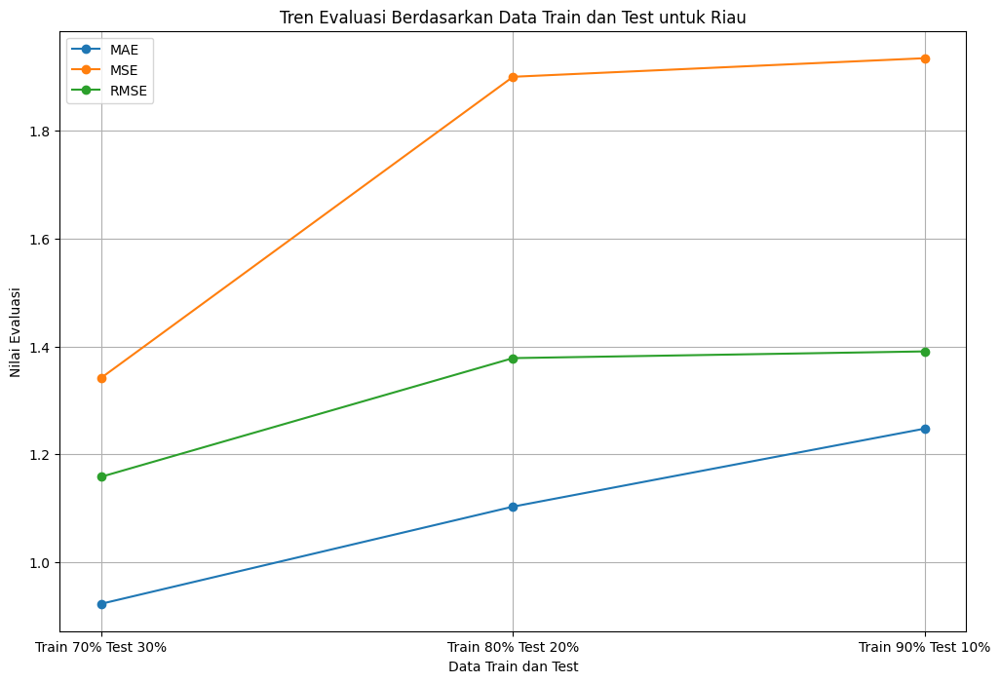

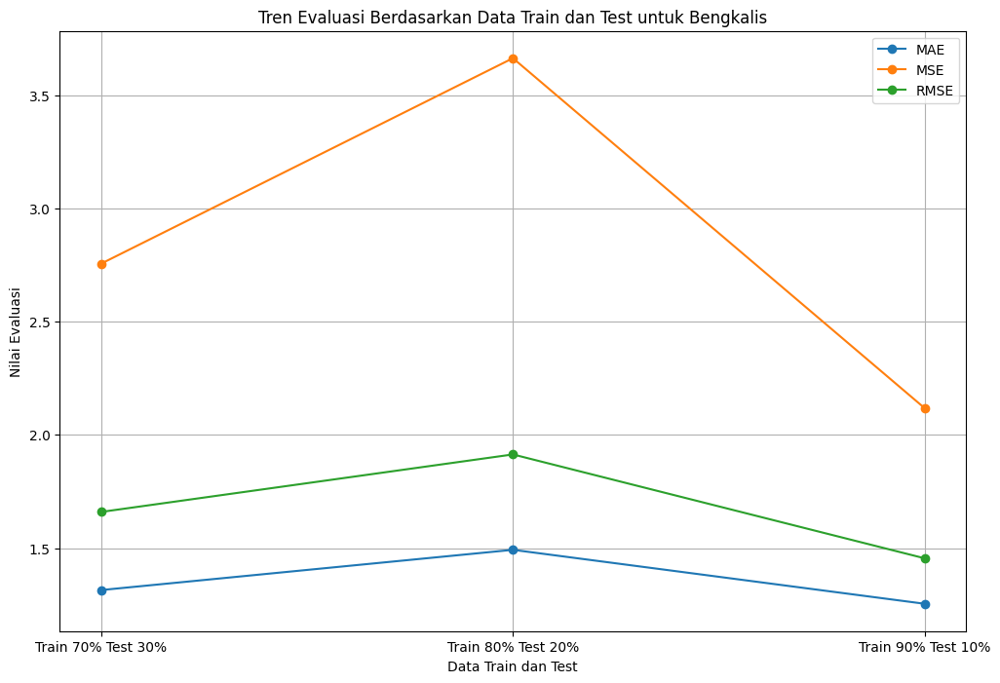

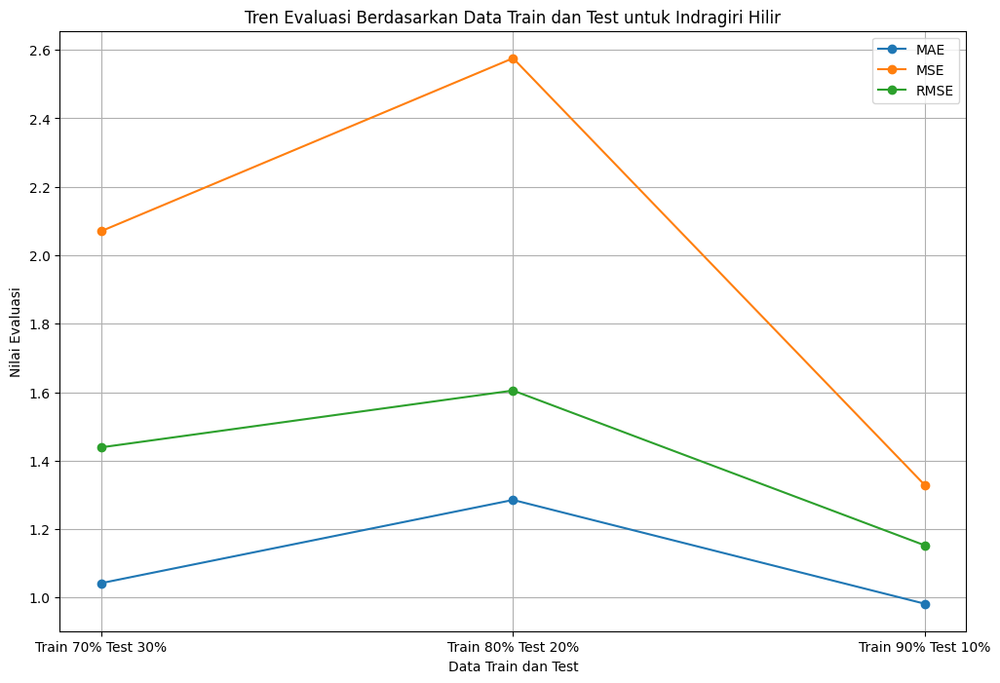

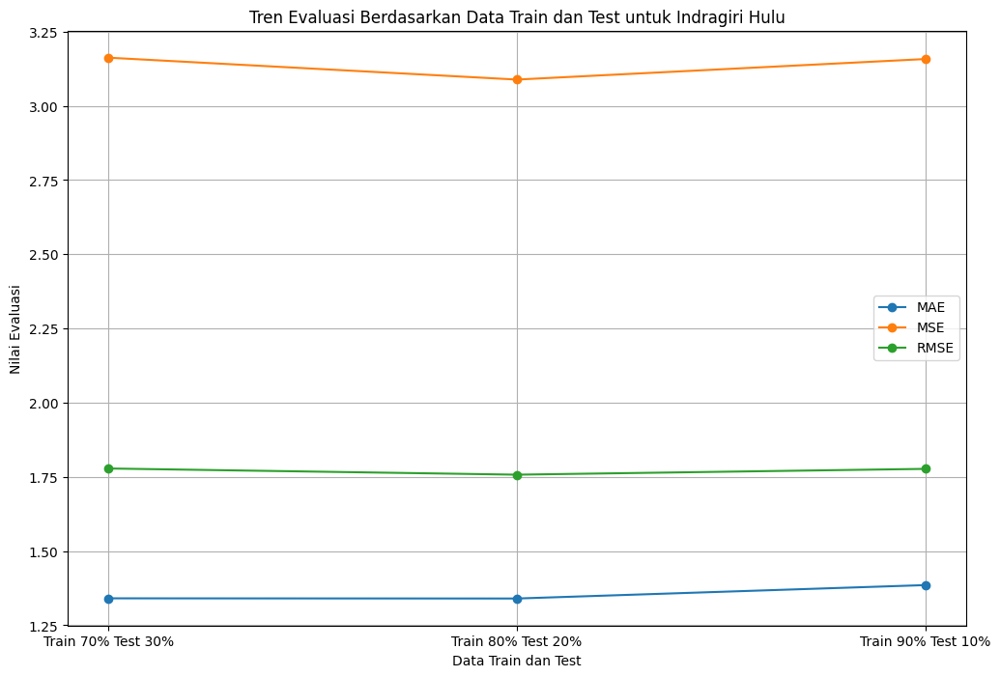

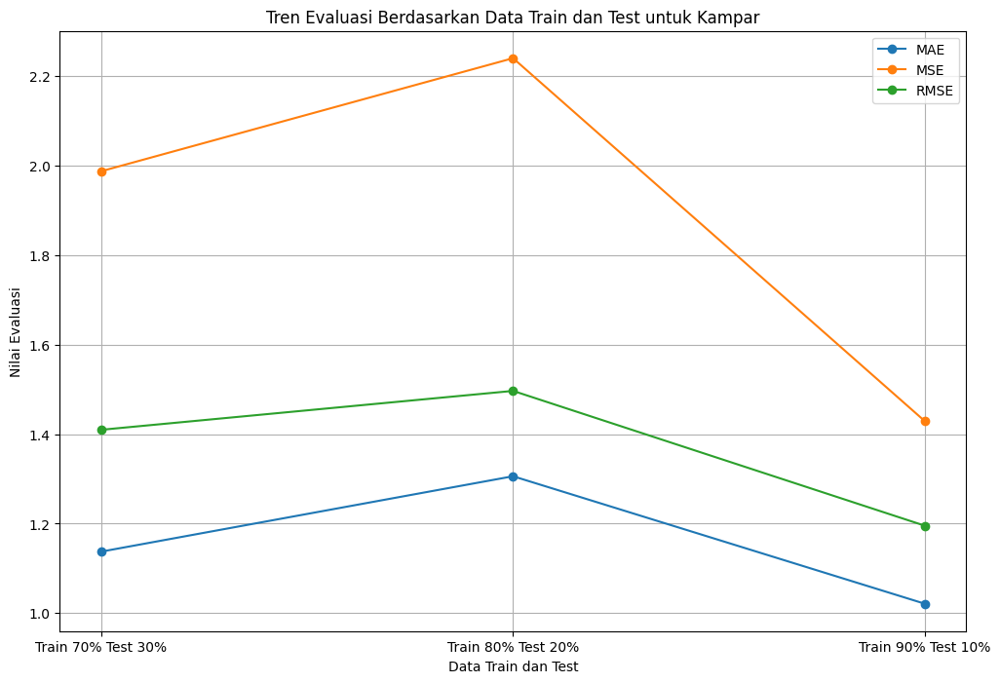

...

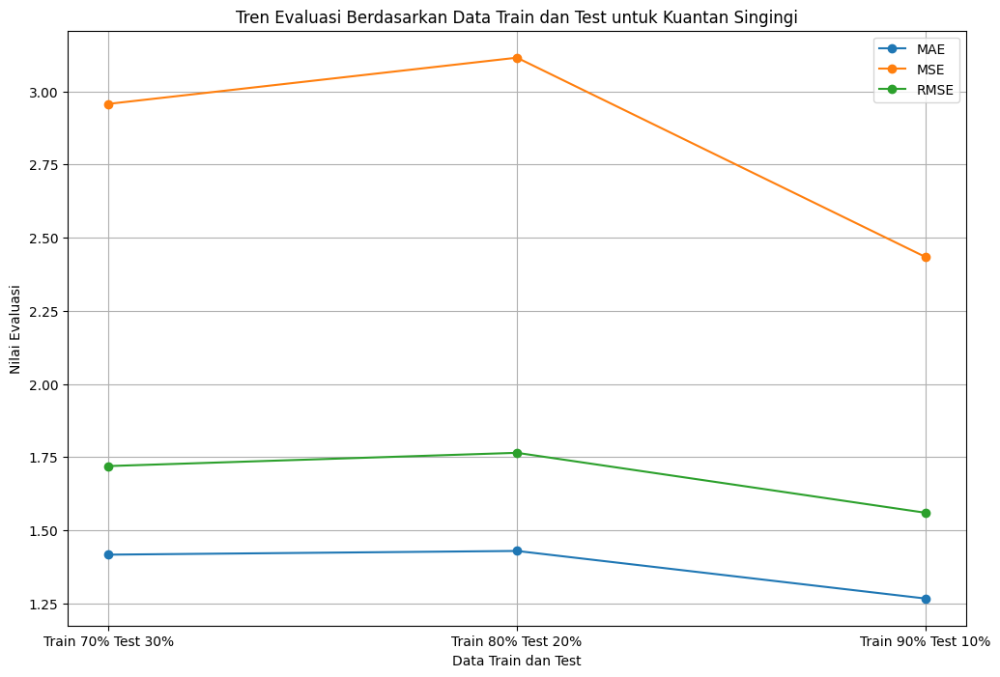

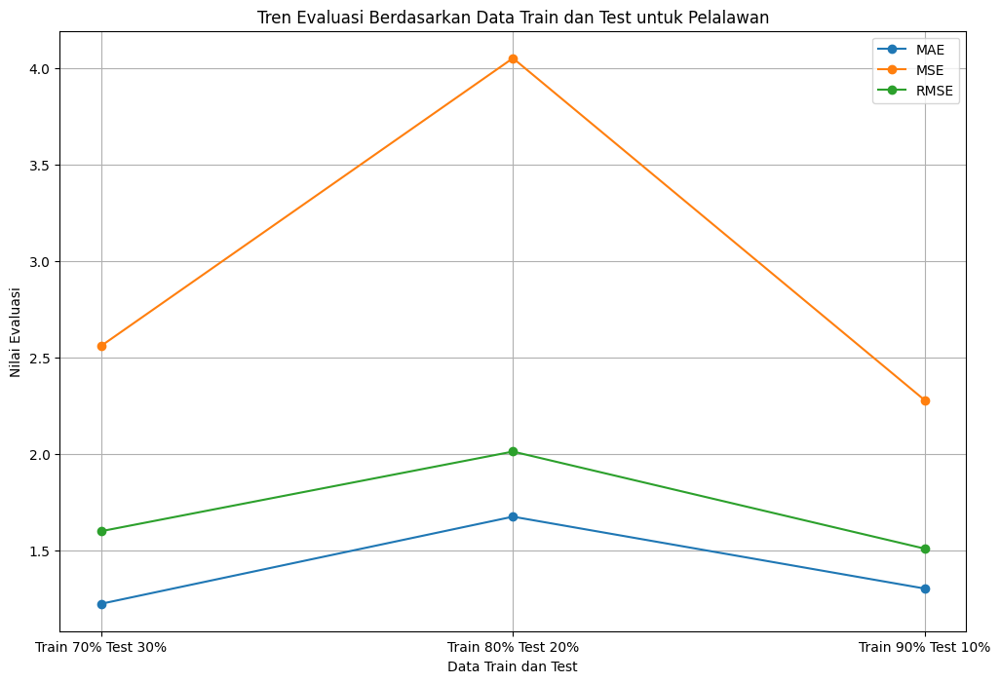

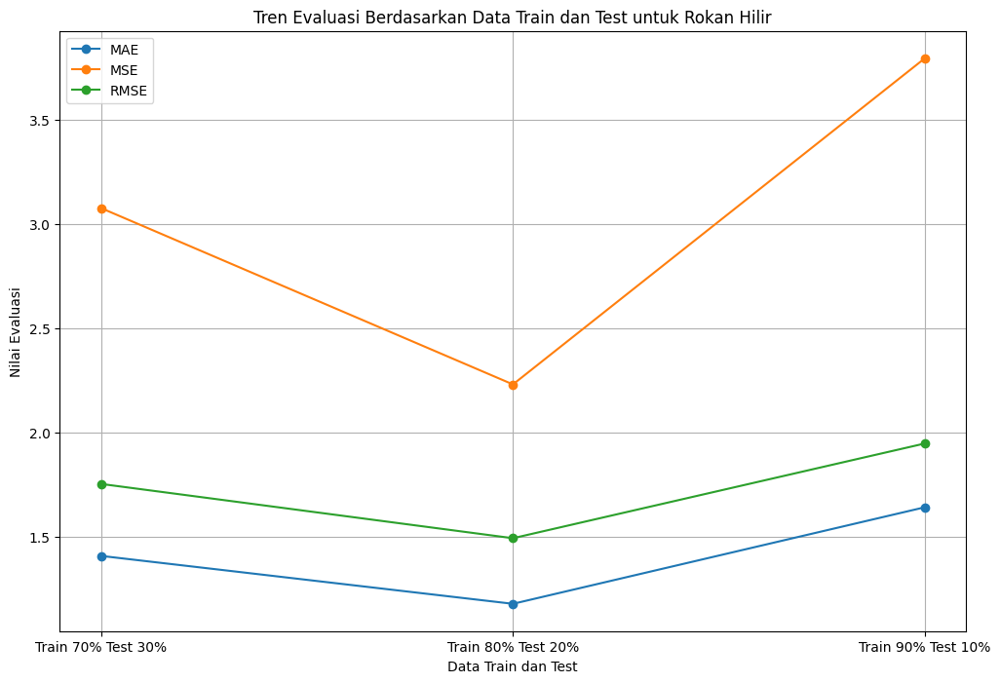

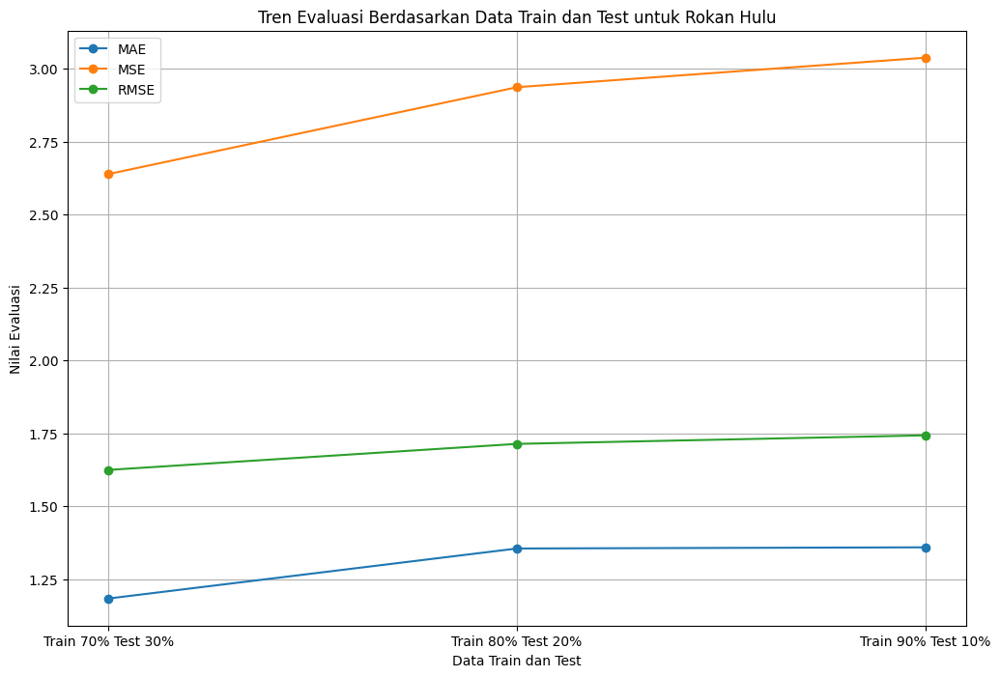

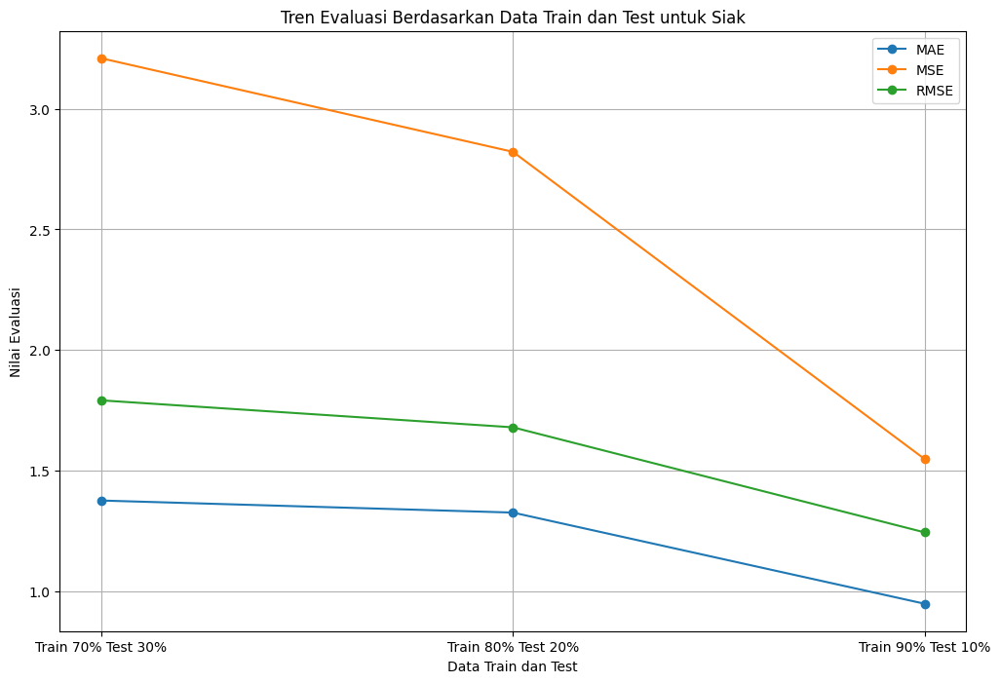

In [ ]:
# Visualisasi tren evaluasi per durasi prediksi per region
regions = all_predictions['Kota/Kabupaten'].unique()

for region in regions:
    region_data = evaluasi_stat.loc[region]

    plt.figure(figsize=(12, 8))
    for metric in ['MAE', 'MSE', 'RMSE']:
        plt.plot(region_data.index, region_data[metric], marker='o', label=metric)

    plt.title(f'Tren Evaluasi Berdasarkan Data Train dan Test untuk {region}')
    plt.xlabel('Data Train dan Test')
    plt.ylabel('Nilai Evaluasi')
    plt.legend()
    plt.grid(True)
    plt.show()

## **Penyesuain Parameter**
### **80, 20**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with training, testing, and forecasting results
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.7)
    train, test = ts[:train_size], ts[train_size:]

    # # Fit SARIMA model on training data
    # model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    # model_fit = model.fit(disp=False)

    # Define and fit the best SARIMA model
    p, d, q, P, D, Q, S = model_config
    model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, S))
    model_fit = model.fit()

    # Print AIC and summary
    print(f"Region: {region} - AIC: {round(model_fit.aic, 2)}")
    print(model_fit.summary())

    # Diagnostics plot
    model_fit.plot_diagnostics(figsize=(15, 12))
    plt.show()

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean
    future_ci = forecast.conf_int()

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Plot Training, Testing, and Future Forecast
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data', color='blue')
    plt.plot(test, label='Testing Data', color='orange')
    # Append future forecasting as extension with monthly frequency
    future_dates = pd.date_range(start=test.index[-1] + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='M')
    plt.plot(future_dates, forecast_with_noise, label='Future Forecast', color='red', linestyle='dashed')
    # Add confidence intervals for future forecast
    plt.fill_between(future_dates,
                    future_ci.iloc[:, 0],
                    future_ci.iloc[:, 1],
                    color='green', alpha=0.2, label='Future Confidence Interval')

    # Finalize the plot
    plt.title(f"Training, Testing, and Future Forecasting for {region}")
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate metrics for Original Data (Adjust for length differences)
    min_length_orig = min(len(test), len(forecast_with_noise))
    mae_sarima_orig, mse_sarima_orig, rmse_sarima_orig = calculate_metrics(test[:min_length_orig], forecast_with_noise[:min_length_orig])
    print(f"MAE original: {mae_sarima_orig}, MSE original: {mse_sarima_orig}, RMSE original: {rmse_sarima_orig}")

    # Store the results in the list
    results.append({
        'Model': f"SARIMA({p},{d},{q}) x ({P},{D},{Q},{S})",
        'Kota/Kabupaten': region,
        'MAE': mae_sarima_orig,
        'MSE': mse_sarima_orig,
        'RMSE': rmse_sarima_orig
    })

    # Save results for analysis
    # results.append({
    #     'Model': f"SARIMA{model_config}",
    #     'Kota/Kabupaten': region,
    #     'MAE': mean_absolute_error(forecast_with_noise),
    #     'MSE': mean_squared_error(forecast_with_noise),
    #     'RMSE': np.sqrt(mean_squared_error(forecast_with_noise))
    # })

# Convert results to DataFrame
results_df_75 = pd.DataFrame(results)


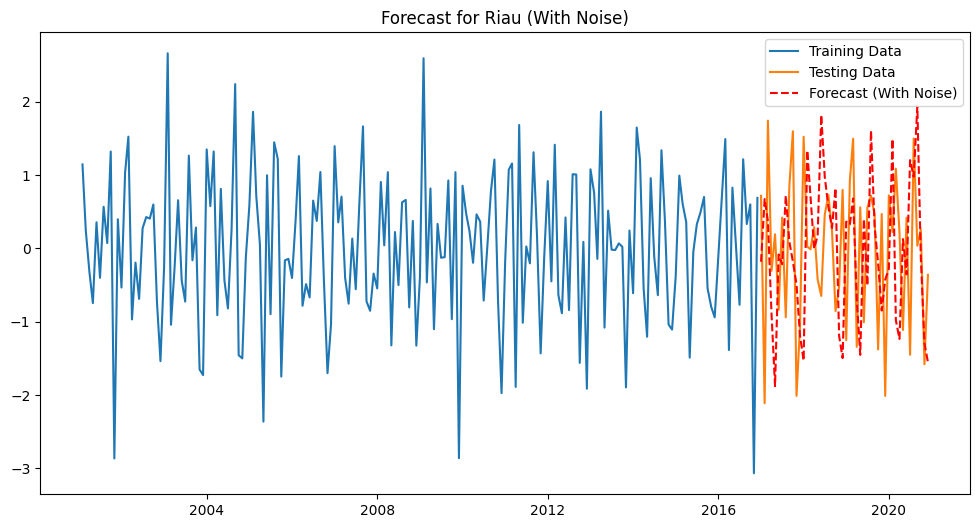

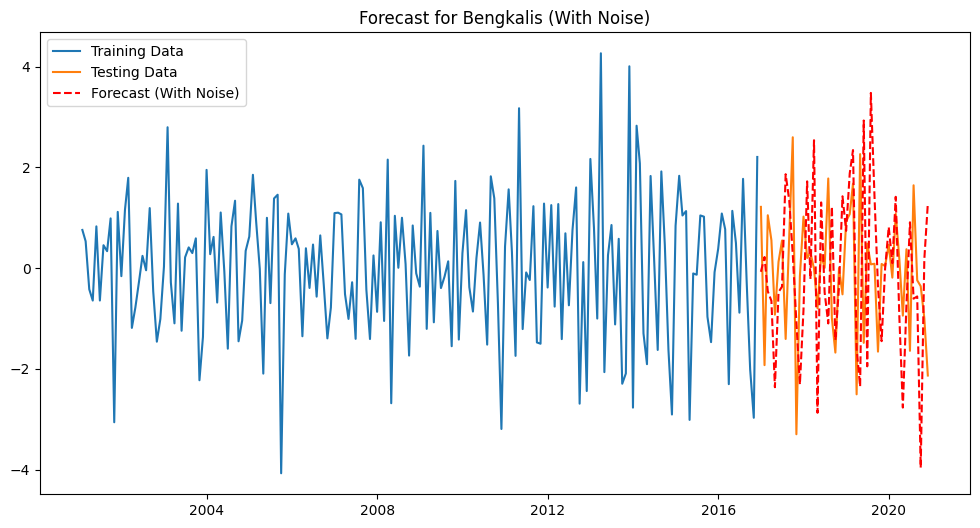

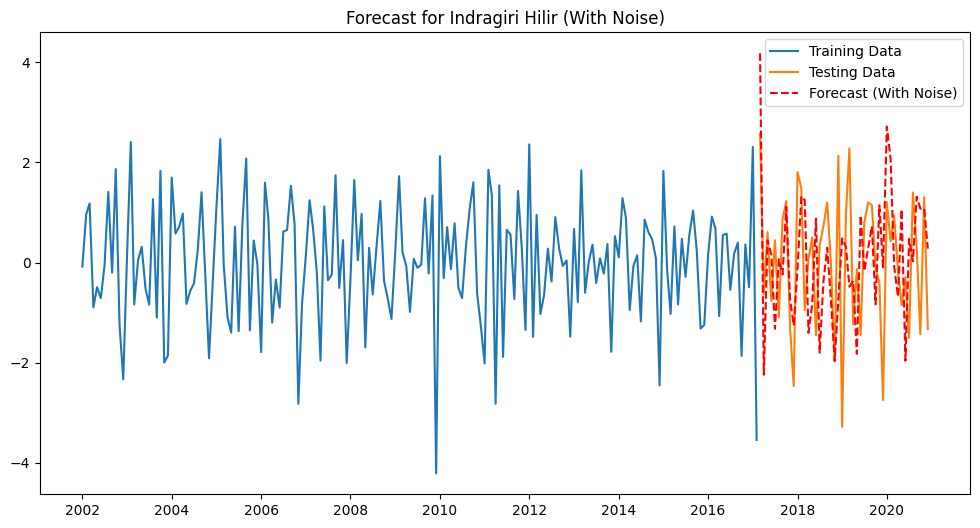

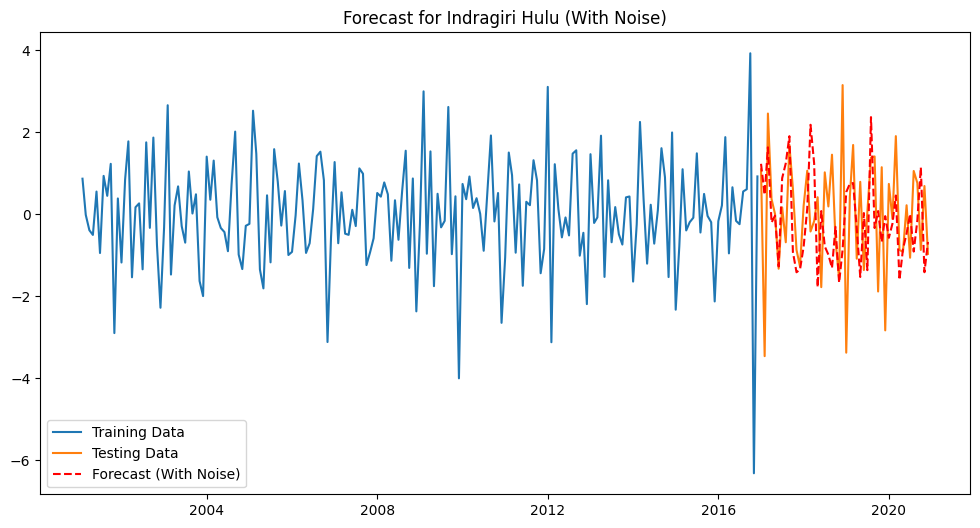

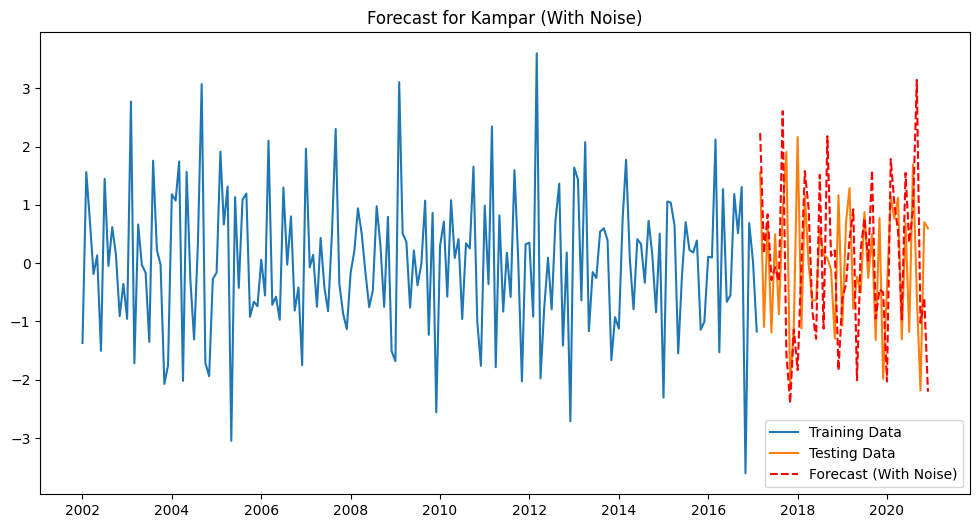

...

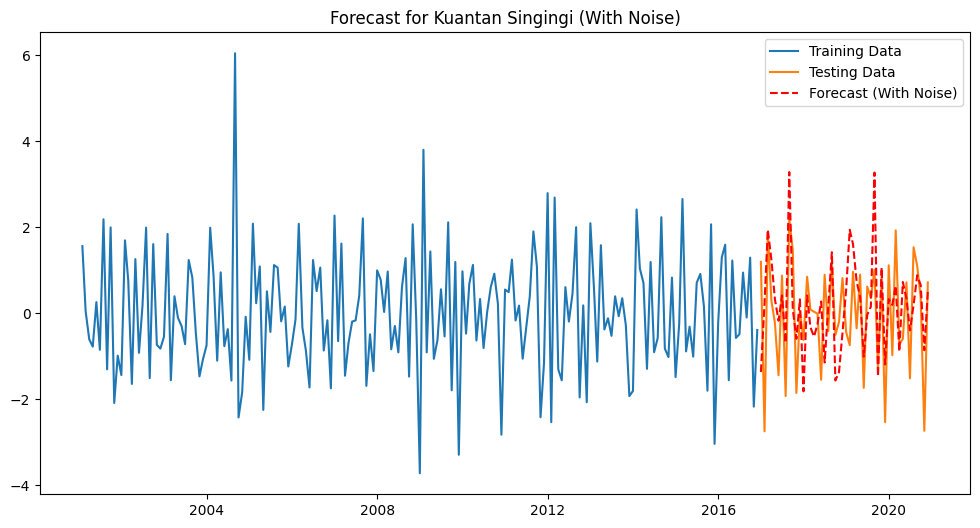

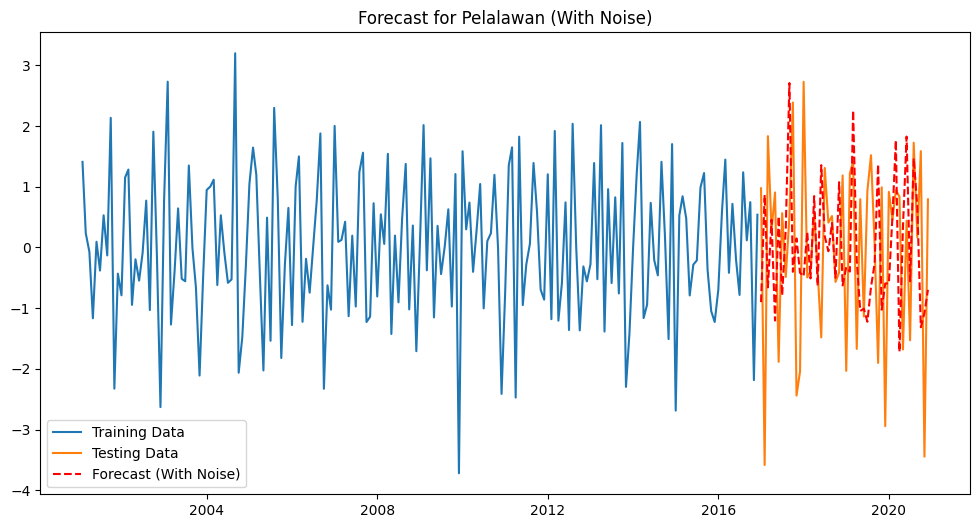

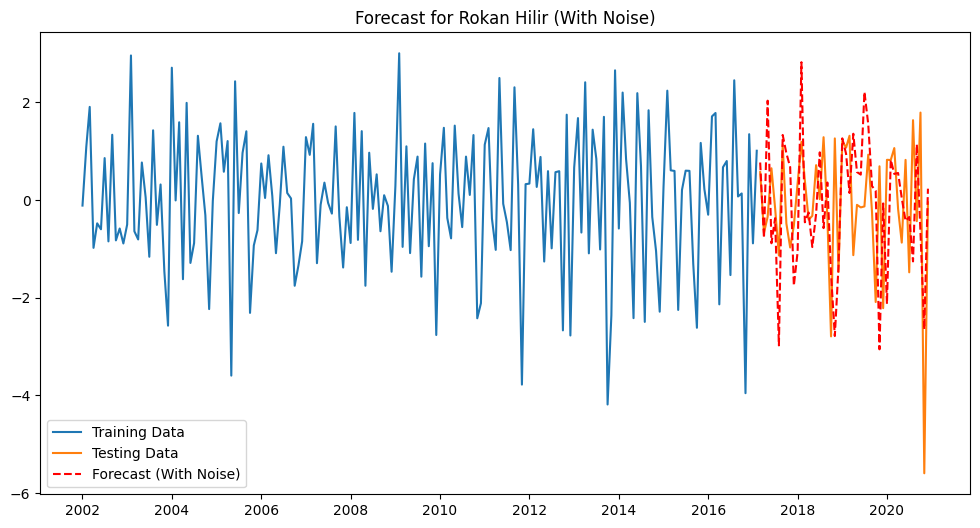

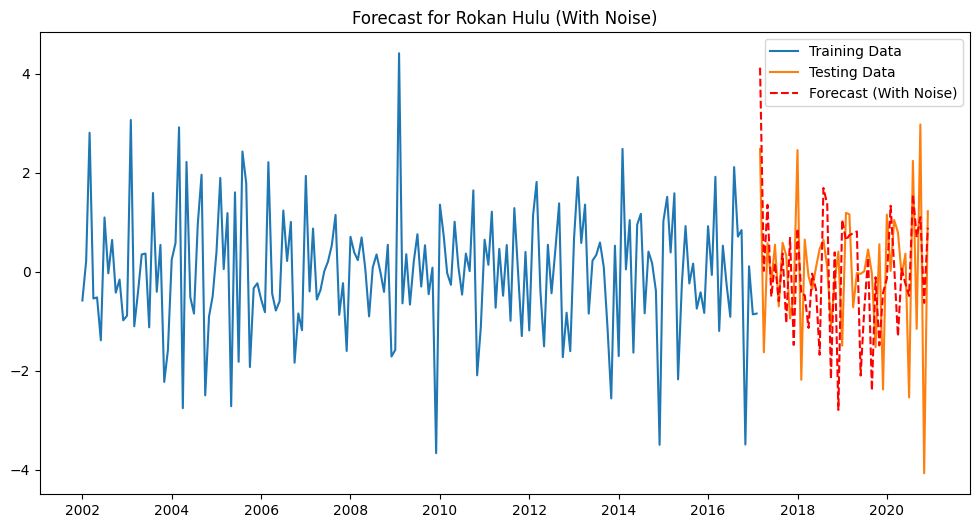

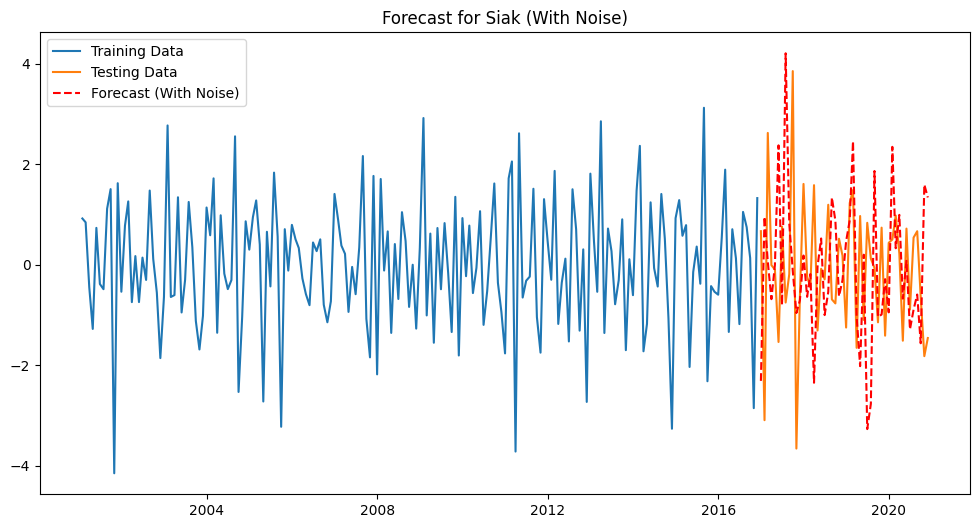

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.8)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast (With Noise)', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} (With Noise)")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_df_80_20 = pd.DataFrame(results)

In [ ]:
results_df_80_20

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(1, 1, 2, 1, 1, 2, 12)",Riau,1.184170,1.944077,1.394301
1,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Bengkalis,1.613890,3.845827,1.961078
2,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hilir,1.385168,2.581950,1.606845
3,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hulu,1.329217,2.817933,1.678670
4,"SARIMA(3, 1, 3, 0, 1, 1, 12)",Kampar,1.147736,2.201521,1.483752
5,"SARIMA(2, 1, 3, 1, 1, 2, 12)",Kepulauan Meranti,1.162739,2.523794,1.588645
6,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Kota Dumai,1.990692,6.137985,2.477496
7,"SARIMA(1, 1, 3, 0, 1, 1, 12)",Kota Pekanbaru,2.354370,7.908225,2.812157
8,"SARIMA(3, 1, 3, 0, 1, 3, 12)",Kuantan Singingi,0.973933,1.440624,1.200260
9,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Pelalawan,1.543506,3.431011,1.852299


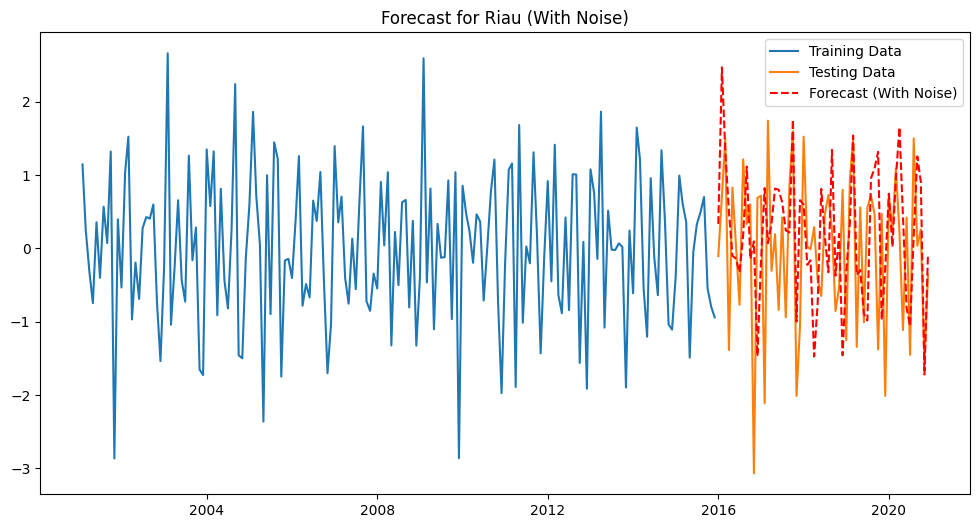

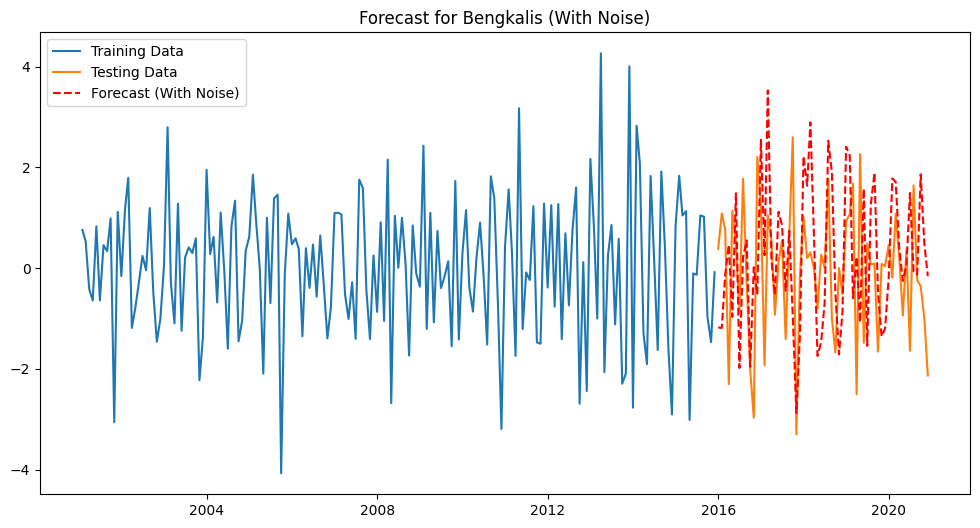

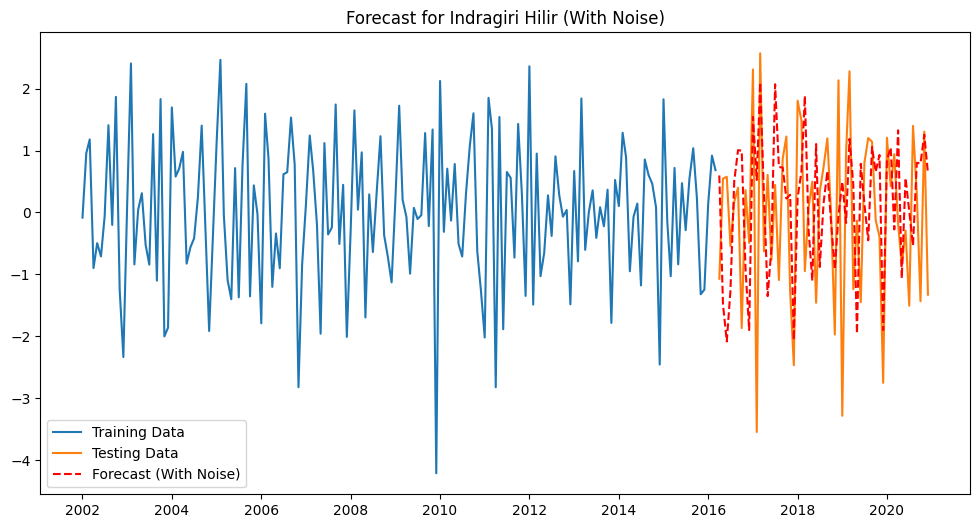

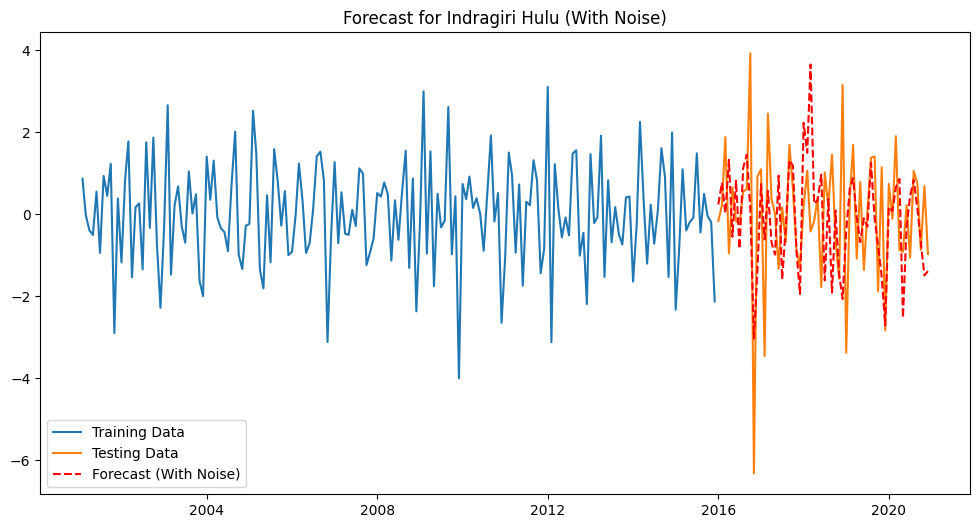

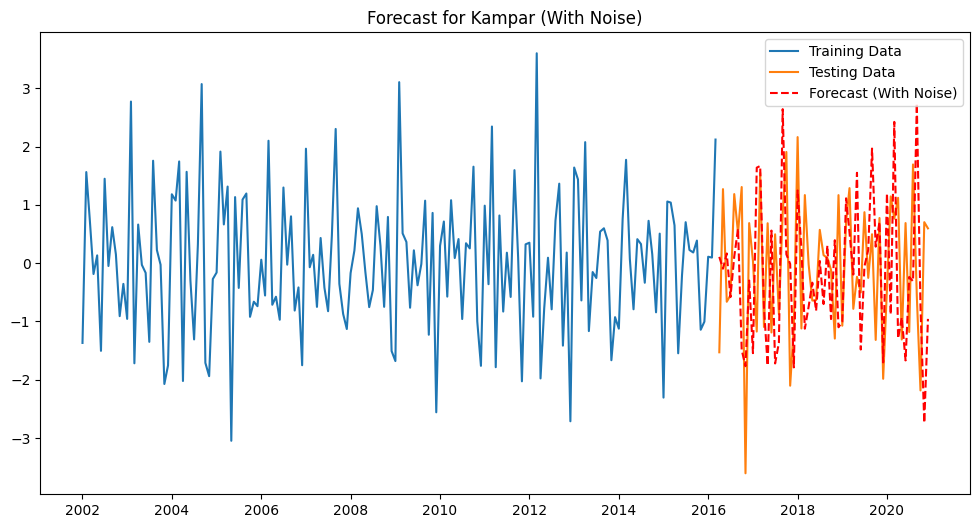

...

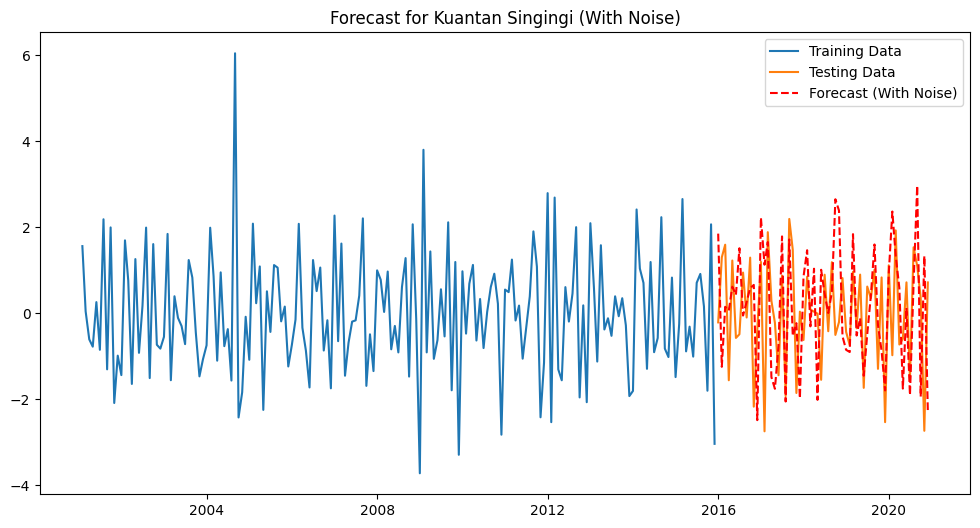

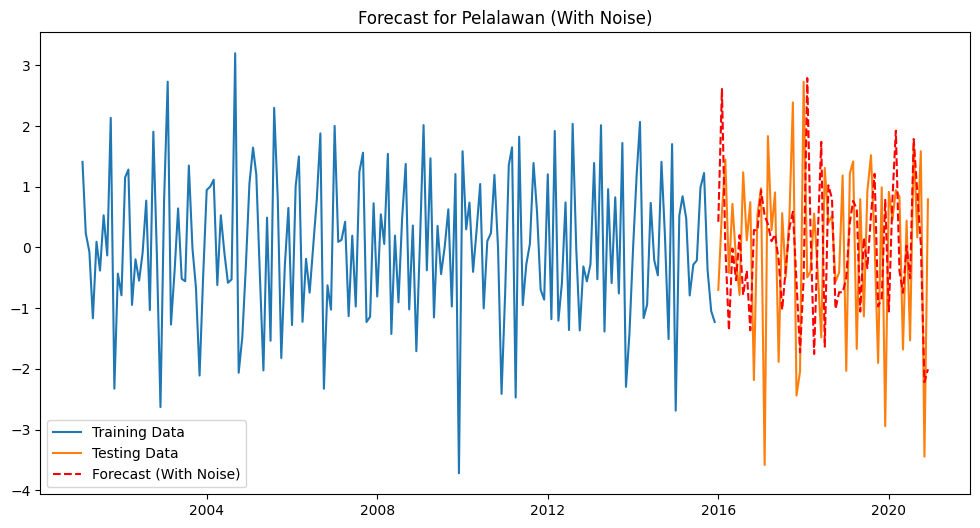

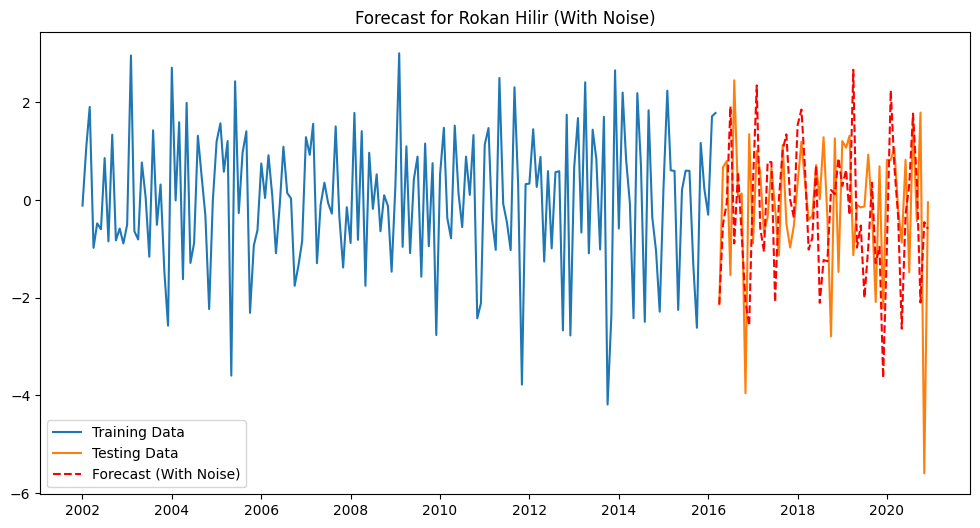

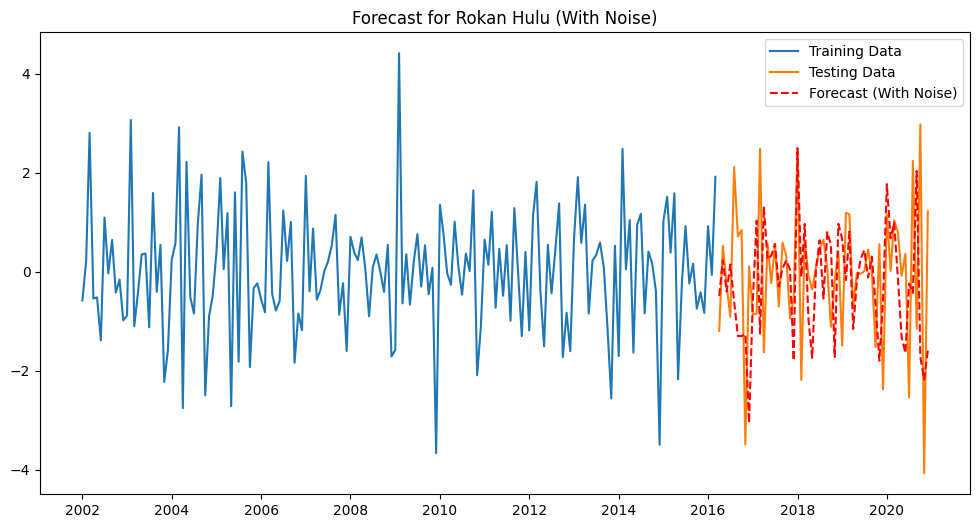

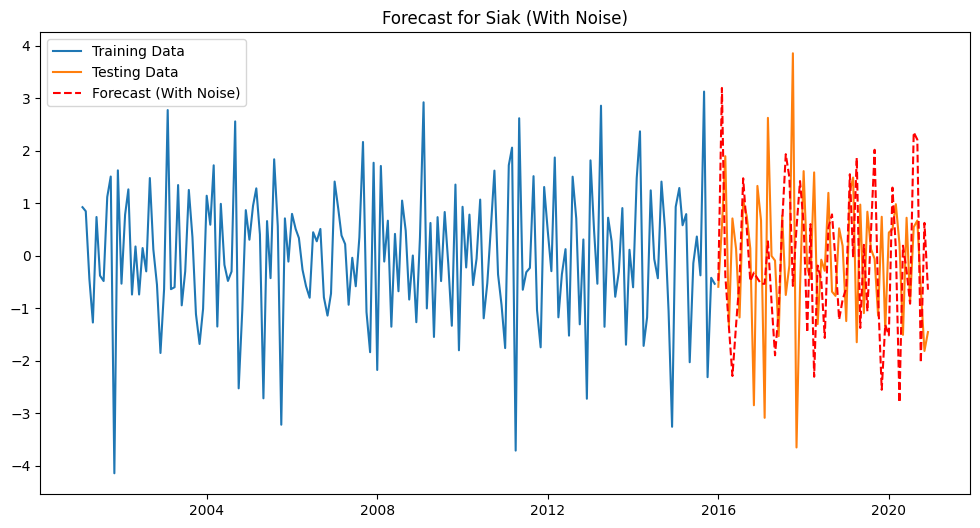

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.75)  # Mengubah ukuran data pelatihan menjadi 75%
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast (With Noise)', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} (With Noise)")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_df_75_25 = pd.DataFrame(results)

In [ ]:
results_df_75_25

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(1, 1, 2, 1, 1, 2, 12)",Riau,0.969543,1.484039,1.218211
1,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Bengkalis,1.470355,2.988319,1.728675
2,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hilir,1.297675,2.473724,1.572808
3,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hulu,1.308235,3.028556,1.740275
4,"SARIMA(3, 1, 3, 0, 1, 1, 12)",Kampar,1.288297,2.404546,1.550660
5,"SARIMA(2, 1, 3, 1, 1, 2, 12)",Kepulauan Meranti,1.396977,3.023648,1.738864
6,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Kota Dumai,1.812052,6.247077,2.499415
7,"SARIMA(1, 1, 3, 0, 1, 1, 12)",Kota Pekanbaru,2.800879,12.911885,3.593311
8,"SARIMA(3, 1, 3, 0, 1, 3, 12)",Kuantan Singingi,1.317551,2.676047,1.635863
9,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Pelalawan,1.338934,2.733645,1.653374


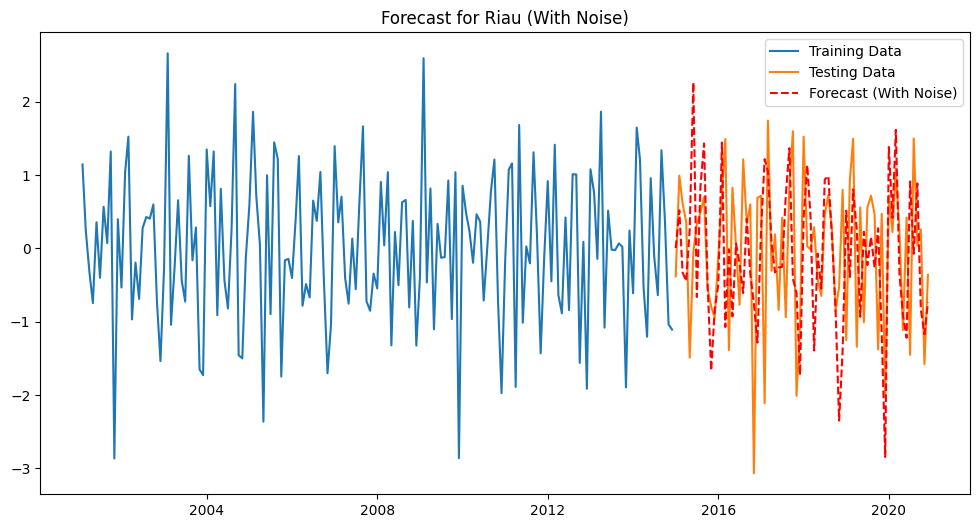

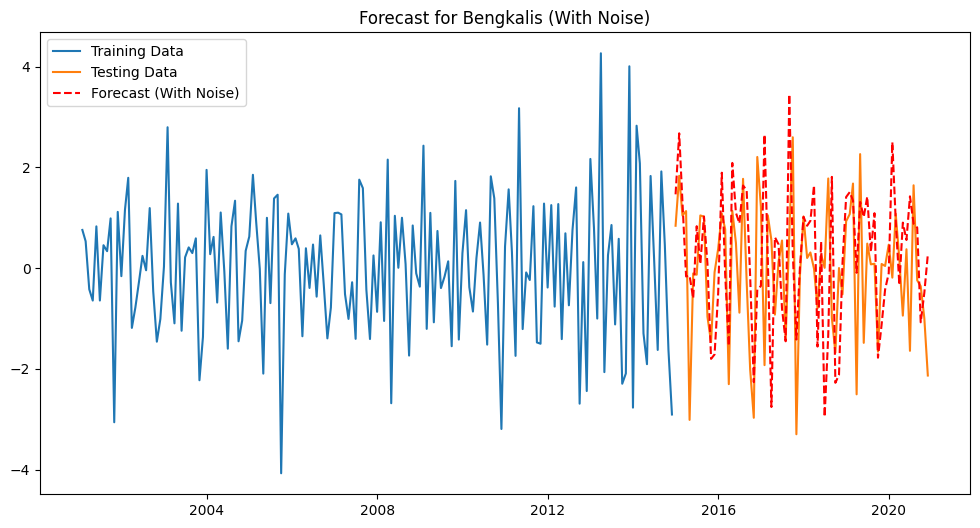

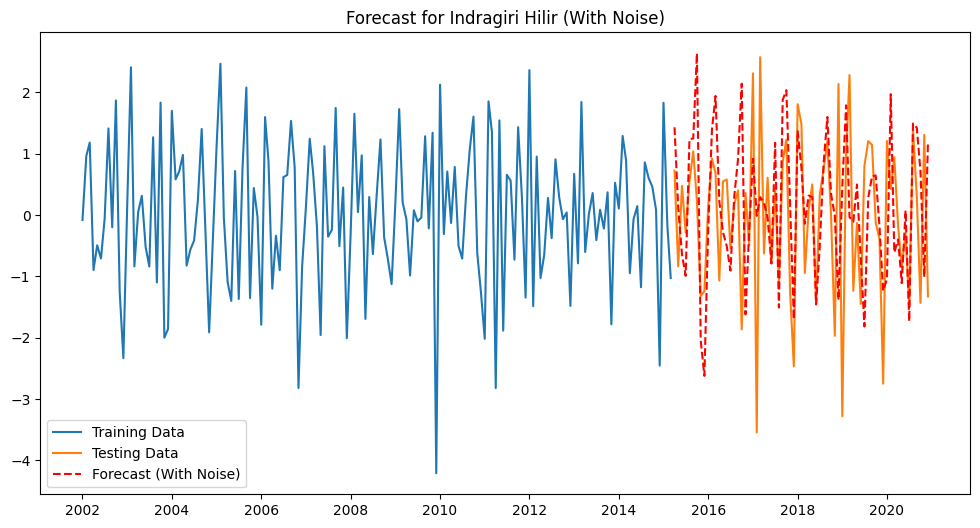

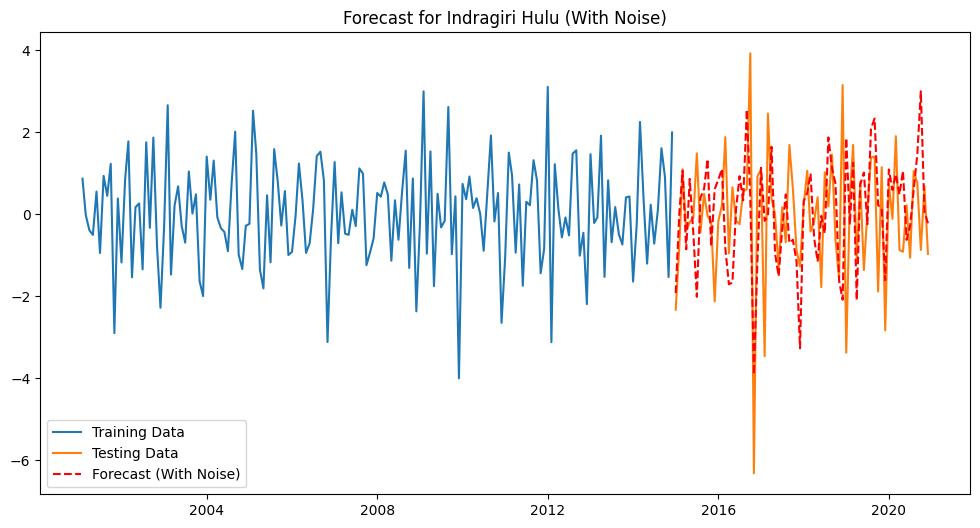

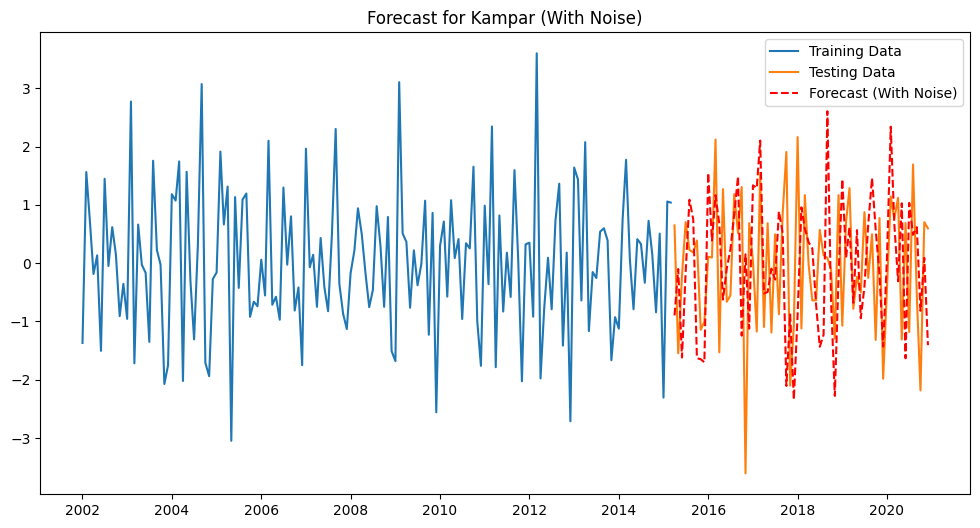

...

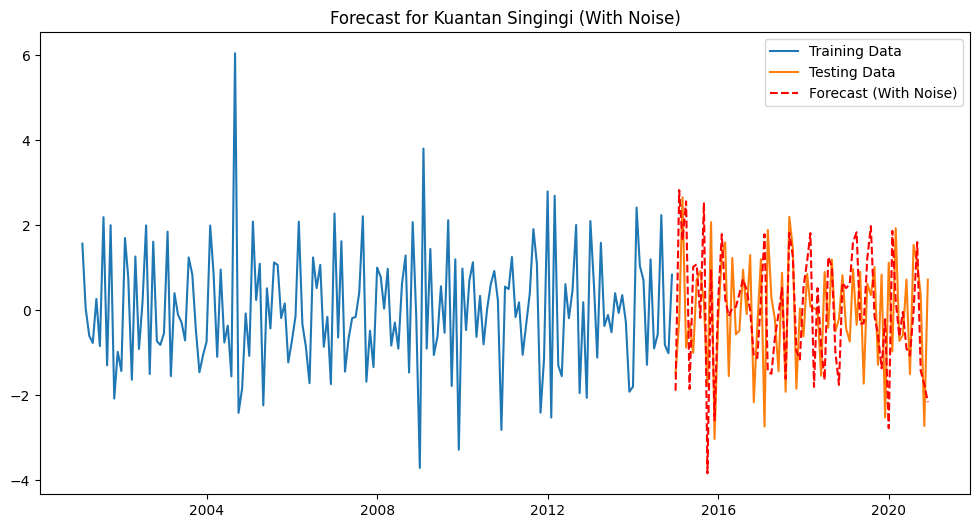

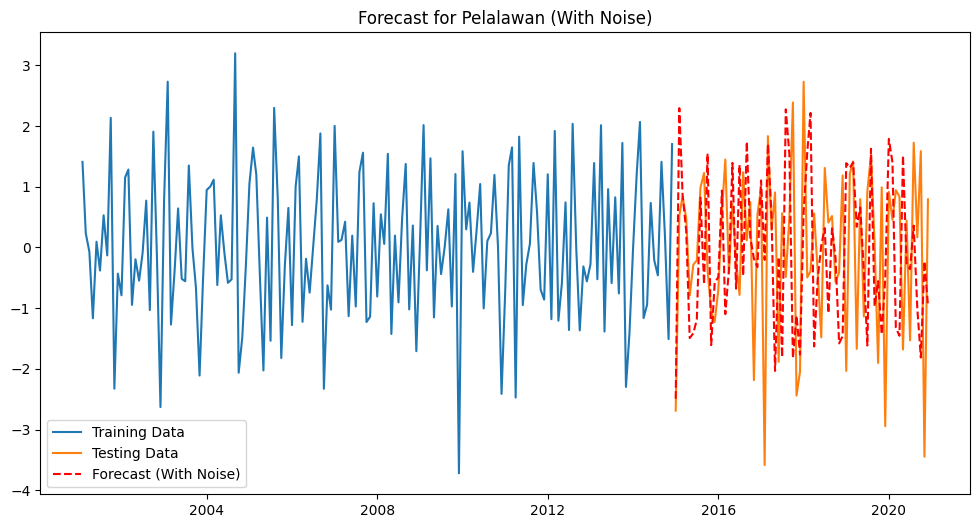

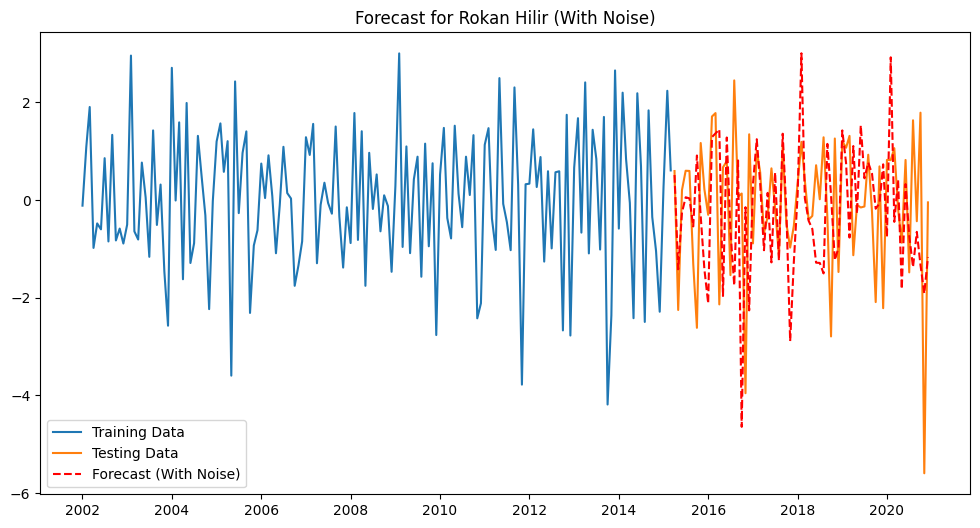

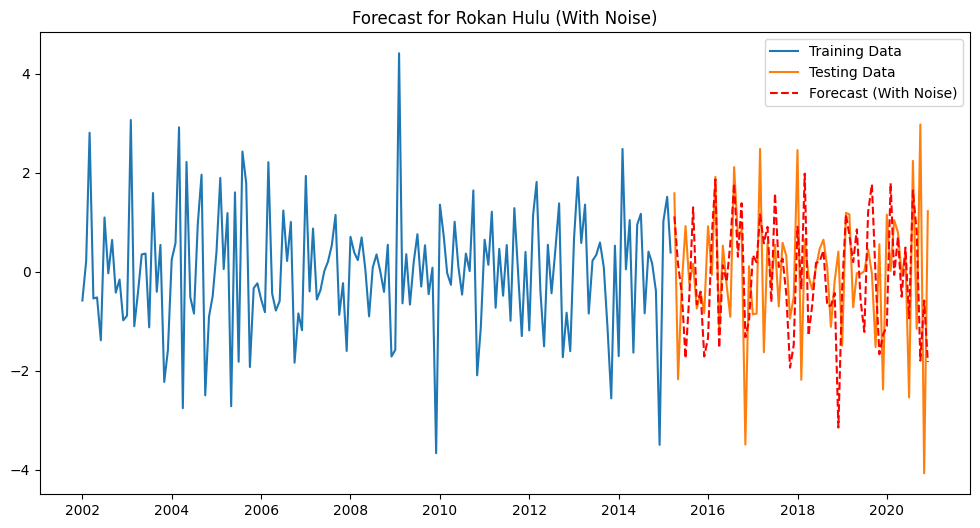

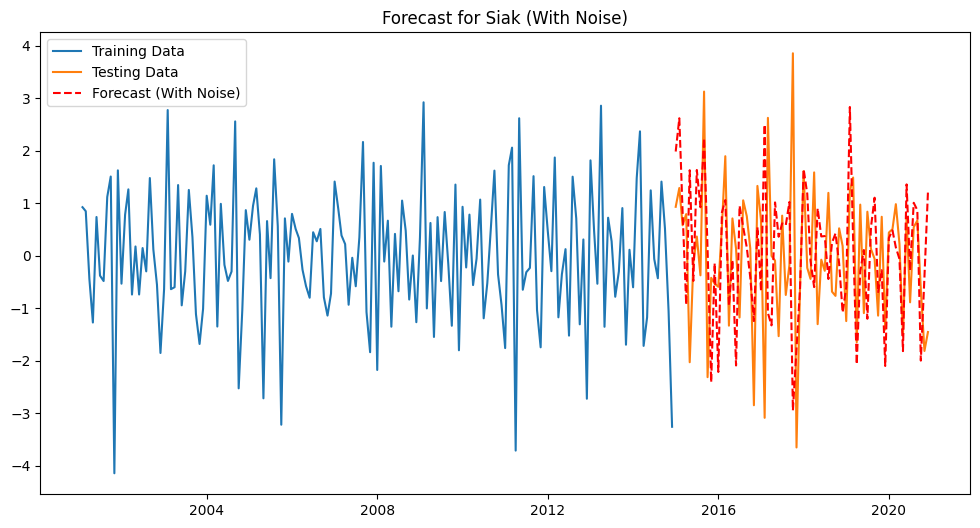

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.70)  # Mengubah ukuran data pelatihan menjadi 75%
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast (With Noise)', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} (With Noise)")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_df_70_30 = pd.DataFrame(results)

In [ ]:
results_df_70_30

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(1, 1, 2, 1, 1, 2, 12)",Riau,0.995662,1.509417,1.228583
1,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Bengkalis,1.215899,2.445875,1.563929
2,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hilir,1.091916,2.071294,1.439199
3,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hulu,1.289531,2.934814,1.713130
4,"SARIMA(3, 1, 3, 0, 1, 1, 12)",Kampar,1.276700,2.314219,1.521256
5,"SARIMA(2, 1, 3, 1, 1, 2, 12)",Kepulauan Meranti,1.257191,2.465769,1.570277
6,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Kota Dumai,1.934597,6.655325,2.579792
7,"SARIMA(1, 1, 3, 0, 1, 1, 12)",Kota Pekanbaru,2.672419,11.246390,3.353564
8,"SARIMA(3, 1, 3, 0, 1, 3, 12)",Kuantan Singingi,1.291094,2.553633,1.598009
9,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Pelalawan,1.389532,3.020980,1.738097


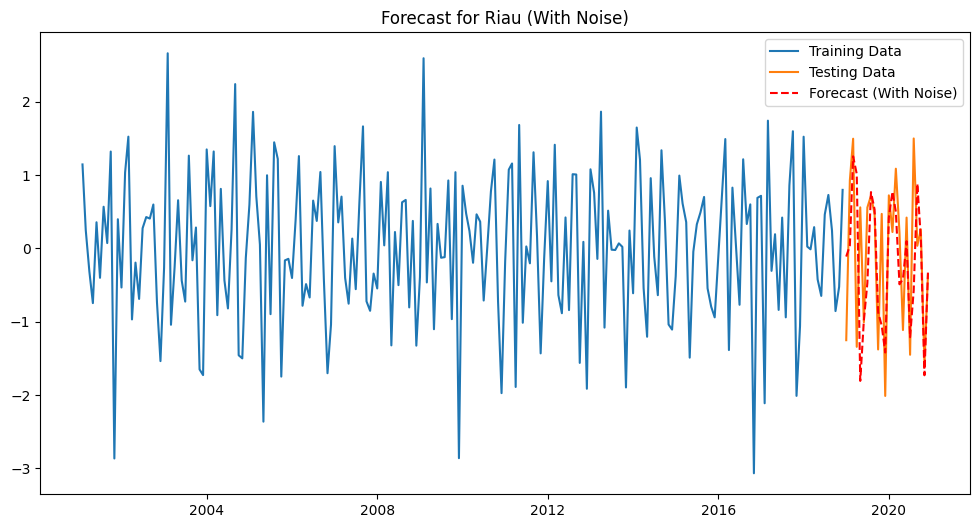

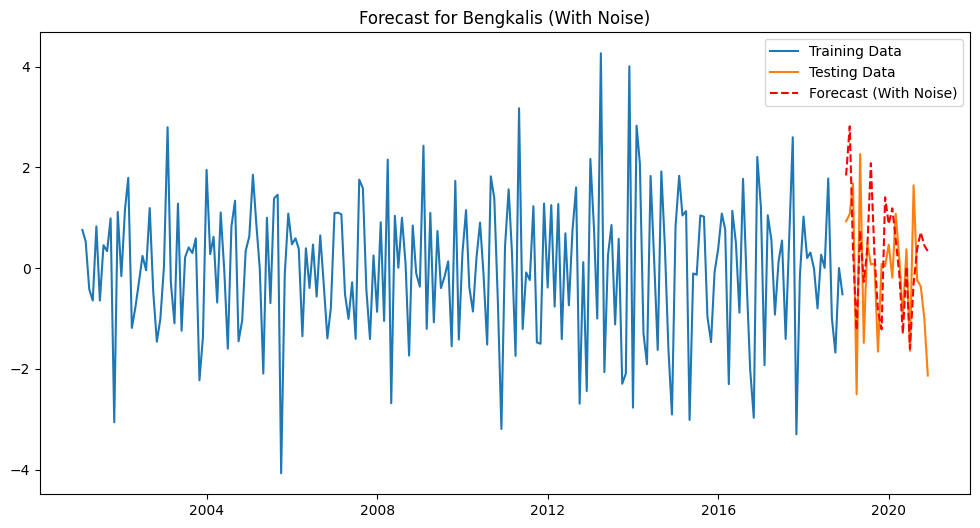

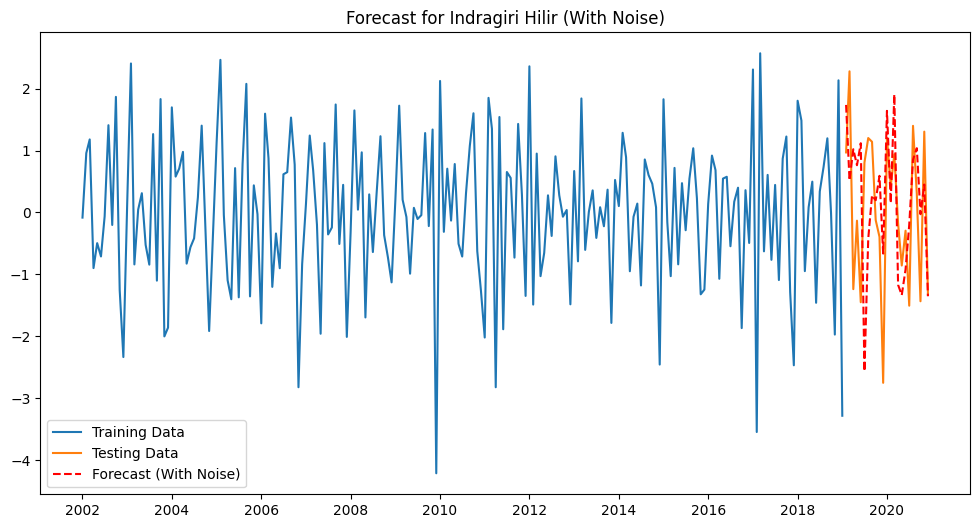

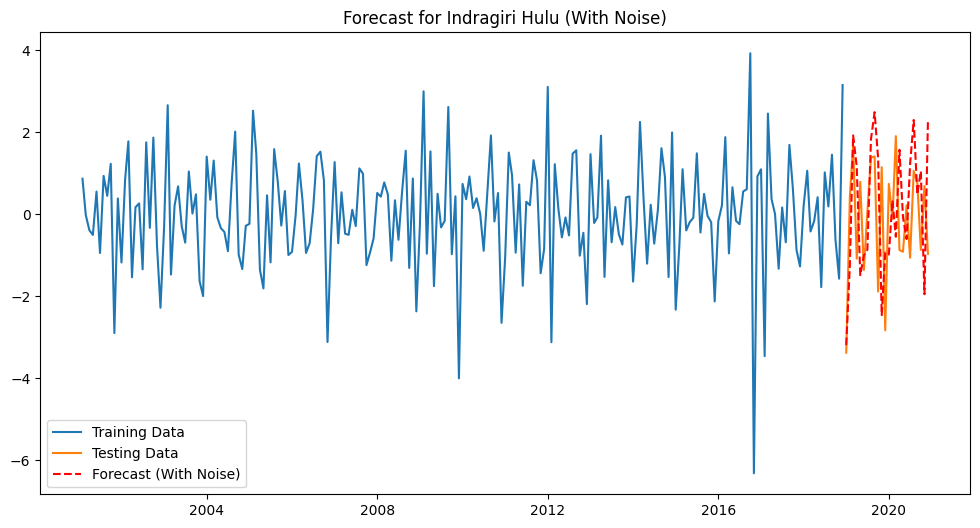

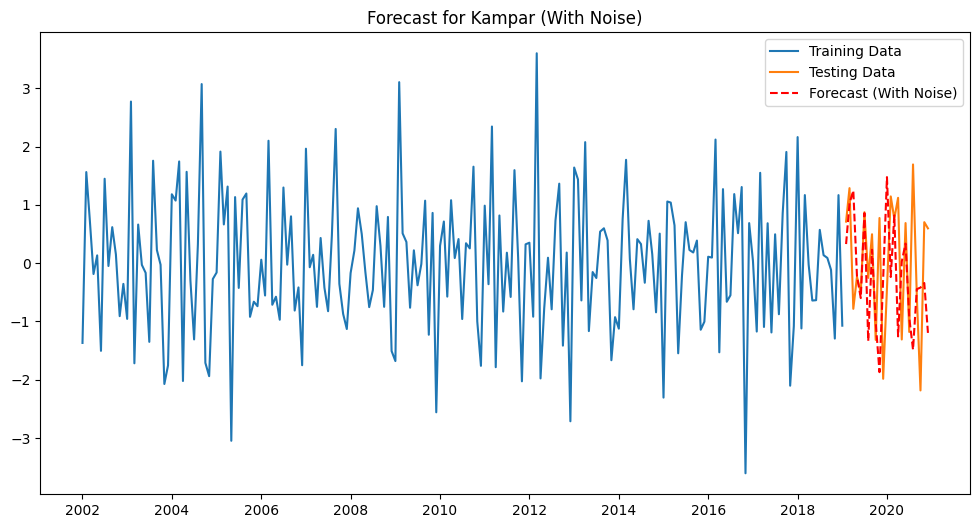

...

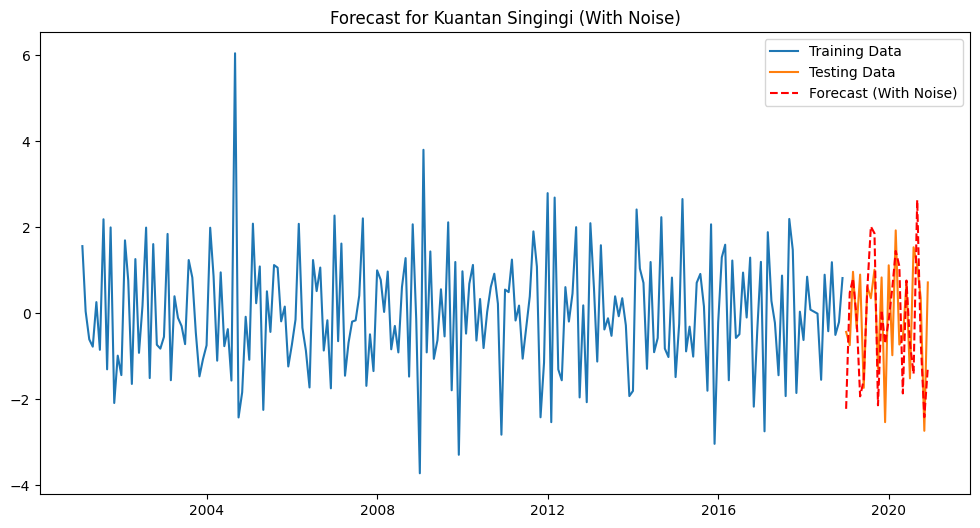

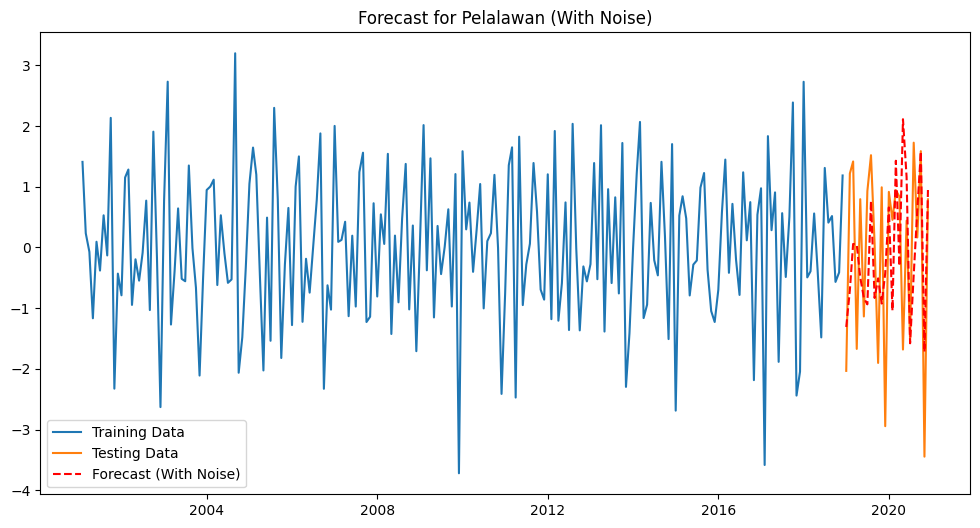

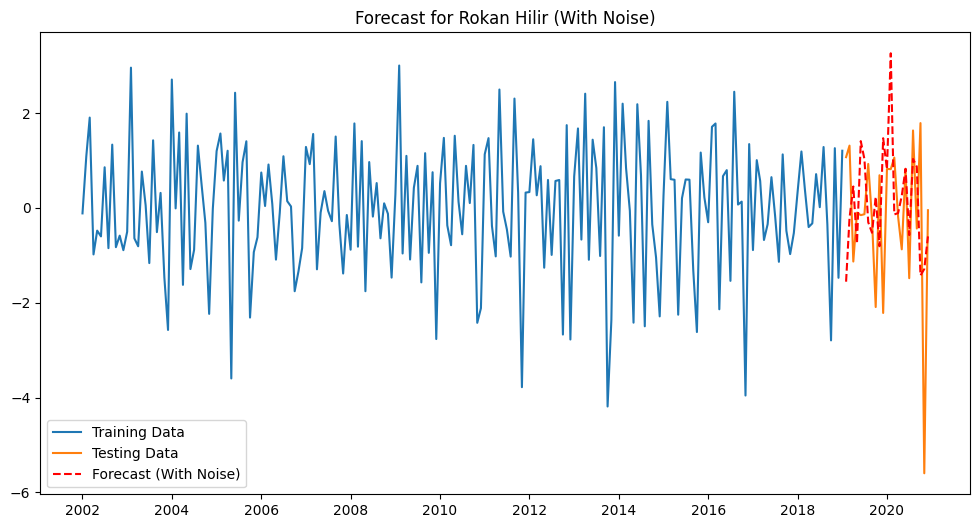

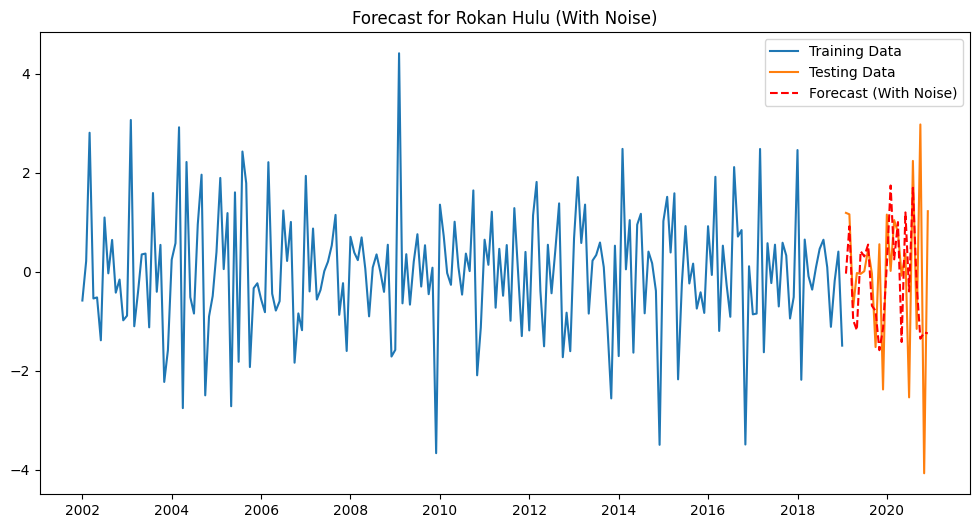

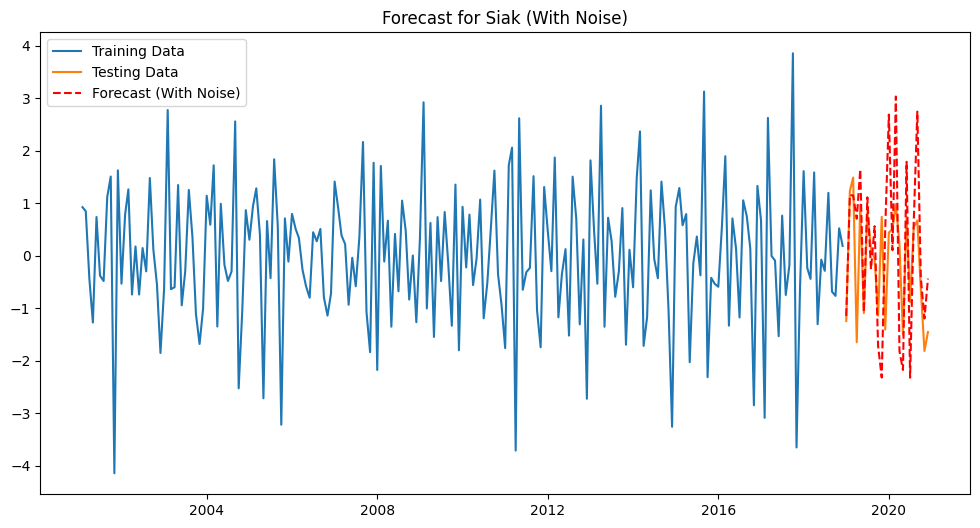

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (1,1,2,1,1,2,12),
    'Bengkalis': (0,1,2,0,1,1,12),
    'Indragiri Hilir': (0,1,2,0,1,1,12),
    'Indragiri Hulu': (0,1,2,0,1,1,12),
    'Kampar': (3,1,3,0,1,1,12),
    'Kepulauan Meranti': (2,1,3,1,1,2,12),
    'Kota Dumai': (0,1,2,0,1,1,12),
    'Kota Pekanbaru': (1,1,3,0,1,1,12),
    'Kuantan Singingi': (3,1,3,0,1,3,12),
    'Pelalawan': (0,1,2,0,1,1,12),
    'Rokan Hilir': (1,1,3,0,1,1,12),
    'Rokan Hulu': (3,1,3,0,1,1,12),
    'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.9)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast (With Noise)', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} (With Noise)")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_df_90_10 = pd.DataFrame(results)

In [ ]:
import pandas as pd

results_df_80_20['Data Train dan Test'] = 'Train 80% Test 20%'
results_df_75_25['Data Train dan Test'] = 'Train 75% Test 25%'
results_df_70_30['Data Train dan Test'] = 'Train 70% Test 30%'

all_predictions = pd.concat([results_df_80_20, results_df_75_25, results_df_70_30], ignore_index=True)

# Pastikan kolom evaluasi berisi nilai numerik saja
for col in ['MAE', 'MSE', 'RMSE']:
    all_predictions[col] = pd.to_numeric(all_predictions[col], errors='coerce')

# Drop baris dengan nilai NaN akibat konversi
all_predictions = all_predictions.dropna(subset=['MAE', 'MSE', 'RMSE'])

all_predictions

,Model,Kota/Kabupaten,MAE,MSE,RMSE,Data Train dan Test
0,"SARIMA(1, 1, 2, 1, 1, 2, 12)",Riau,1.184170,1.944077,1.394301,Train 80% Test 20%
1,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Bengkalis,1.613890,3.845827,1.961078,Train 80% Test 20%
2,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hilir,1.385168,2.581950,1.606845,Train 80% Test 20%
3,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Indragiri Hulu,1.329217,2.817933,1.678670,Train 80% Test 20%
4,"SARIMA(3, 1, 3, 0, 1, 1, 12)",Kampar,1.147736,2.201521,1.483752,Train 80% Test 20%
5,"SARIMA(2, 1, 3, 1, 1, 2, 12)",Kepulauan Meranti,1.162739,2.523794,1.588645,Train 80% Test 20%
6,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Kota Dumai,1.990692,6.137985,2.477496,Train 80% Test 20%
7,"SARIMA(1, 1, 3, 0, 1, 1, 12)",Kota Pekanbaru,2.354370,7.908225,2.812157,Train 80% Test 20%
8,"SARIMA(3, 1, 3, 0, 1, 3, 12)",Kuantan Singingi,0.973933,1.440624,1.200260,Train 80% Test 20%
9,"SARIMA(0, 1, 2, 0, 1, 1, 12)",Pelalawan,1.543506,3.431011,1.852299,Train 80% Test 20%


In [ ]:
# Perbandingan statistik evaluasi berdasarkan Data Train dan Test per region
evaluasi_stat = all_predictions.groupby(['Kota/Kabupaten', 'Data Train dan Test'])[['MAE', 'MSE', 'RMSE']].mean()

evaluasi_stat

MAE        MSE      RMSE
Kota/Kabupaten    Data Train dan Test                               
Bengkalis         Train 70% Test 30%   1.215899   2.445875  1.563929
                  Train 75% Test 25%   1.470355   2.988319  1.728675
                  Train 80% Test 20%   1.613890   3.845827  1.961078
Indragiri Hilir   Train 70% Test 30%   1.091916   2.071294  1.439199
                  Train 75% Test 25%   1.297675   2.473724  1.572808
                  Train 80% Test 20%   1.385168   2.581950  1.606845
Indragiri Hulu    Train 70% Test 30%   1.289531   2.934814  1.713130
                  Train 75% Test 25%   1.308235   3.028556  1.740275
                  Train 80% Test 20%   1.329217   2.817933  1.678670
Kampar            Train 70% Test 30%   1.276700   2.314219  1.521256
                  Train 75% Test 25%   1.288297   2.404546  1.550660
                  Train 80% Test 20%   1.147736   2.201521  1.483752
Kepulauan Meranti Train 70% Test 30%   1.257191   2.465769  1.570277
                  Train 75% Test 25%   1.396977   3.023648  1.738864
                  Train 80% Test 20%   1.162739   2.523794  1.588645
Kota Dumai        Train 70% Test 30%   1.934597   6.655325  2.579792
                  Train 75% Test 25%   1.812052   6.247077  2.499415
                  Train 80% Test 20%   1.990692   6.137985  2.477496
Kota Pekanbaru    Train 70% Test 30%   2.672419  11.246390  3.353564
                  Train 75% Test 25%   2.800879  12.911885  3.593311
                  Train 80% Test 20%   2.354370   7.908225  2.812157
Kuantan Singingi  Train 70% Test 30%   1.291094   2.553633  1.598009
                  Train 75% Test 25%   1.317551   2.676047  1.635863
                  Train 80% Test 20%   0.973933   1.440624  1.200260
Pelalawan         Train 70% Test 30%   1.389532   3.020980  1.738097
                  Train 75% Test 25%   1.338934   2.733645  1.653374
                  Train 80% Test 20%   1.543506   3.431011  1.852299
Riau              Train 70% Test 30%   0.995662   1.509417  1.228583
                  Train 75% Test 25%   0.969543   1.484039  1.218211
                  Train 80% Test 20%   1.184170   1.944077  1.394301
Rokan Hilir       Train 70% Test 30%   1.375512   3.309217  1.819125
                  Train 75% Test 25%   1.365818   3.114541  1.764806
                  Train 80% Test 20%   1.303001   2.715093  1.647754
Rokan Hulu        Train 70% Test 30%   1.084860   2.080655  1.442447
                  Train 75% Test 25%   1.267594   2.760408  1.661447
                  Train 80% Test 20%   1.255085   2.211592  1.487142
Siak              Train 70% Test 30%   1.239911   2.849293  1.687985
                  Train 75% Test 25%   1.513443   3.430212  1.852083
                  Train 80% Test 20%   1.674331   4.376054  2.091902

In [ ]:
# Bandingkan nilai evaluasi antara Data Train dan Test
comparison_stat = evaluasi_stat.unstack(level='Data Train dan Test')

comparison_stat



MAE                                        \
Data Train dan Test Train 70% Test 30% Train 75% Test 25% Train 80% Test 20%   
Kota/Kabupaten                                                                 
Bengkalis                     1.215899           1.470355           1.613890   
Indragiri Hilir               1.091916           1.297675           1.385168   
Indragiri Hulu                1.289531           1.308235           1.329217   
Kampar                        1.276700           1.288297           1.147736   
Kepulauan Meranti             1.257191           1.396977           1.162739   
Kota Dumai                    1.934597           1.812052           1.990692   
Kota Pekanbaru                2.672419           2.800879           2.354370   
Kuantan Singingi              1.291094           1.317551           0.973933   
Pelalawan                     1.389532           1.338934           1.543506   
Riau                          0.995662           0.969543           1.184170   
Rokan Hilir                   1.375512           1.365818           1.303001   
Rokan Hulu                    1.084860           1.267594           1.255085   
Siak                          1.239911           1.513443           1.674331   

                                   MSE                                        \
Data Train dan Test Train 70% Test 30% Train 75% Test 25% Train 80% Test 20%   
Kota/Kabupaten                                                                 
Bengkalis                     2.445875           2.988319           3.845827   
Indragiri Hilir               2.071294           2.473724           2.581950   
Indragiri Hulu                2.934814           3.028556           2.817933   
Kampar                        2.314219           2.404546           2.201521   
Kepulauan Meranti             2.465769           3.023648           2.523794   
Kota Dumai                    6.655325           6.247077           6.137985   
Kota Pekanbaru               11.246390          12.911885           7.908225   
Kuantan Singingi              2.553633           2.676047           1.440624   
Pelalawan                     3.020980           2.733645           3.431011   
Riau                          1.509417           1.484039           1.944077   
Rokan Hilir                   3.309217           3.114541           2.715093   
Rokan Hulu                    2.080655           2.760408           2.211592   
Siak                          2.849293           3.430212           4.376054   

                                  RMSE                                        
Data Train dan Test Train 70% Test 30% Train 75% Test 25% Train 80% Test 20%  
Kota/Kabupaten                                                                
Bengkalis                     1.563929           1.728675           1.961078  
Indragiri Hilir               1.439199           1.572808           1.606845  
Indragiri Hulu                1.713130           1.740275           1.678670  
Kampar                        1.521256           1.550660           1.483752  
Kepulauan Meranti             1.570277           1.738864           1.588645  
Kota Dumai                    2.579792           2.499415           2.477496  
Kota Pekanbaru                3.353564           3.593311           2.812157  
Kuantan Singingi              1.598009           1.635863           1.200260  
Pelalawan                     1.738097           1.653374           1.852299  
Riau                          1.228583           1.218211           1.394301  
Rokan Hilir                   1.819125           1.764806           1.647754  
Rokan Hulu                    1.442447           1.661447           1.487142  
Siak                          1.687985           1.852083           2.091902

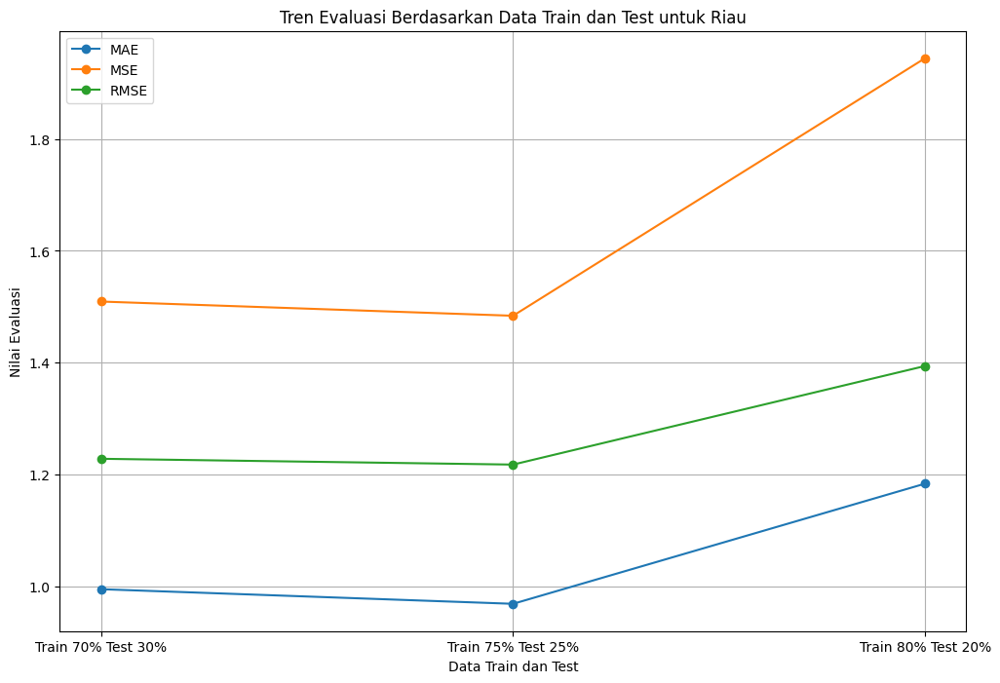

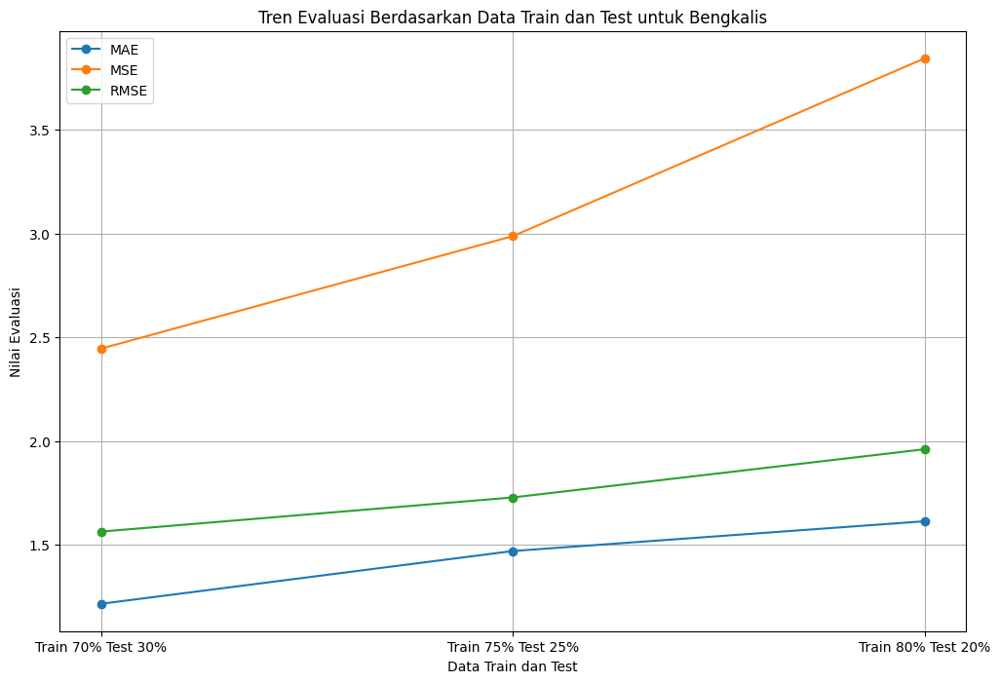

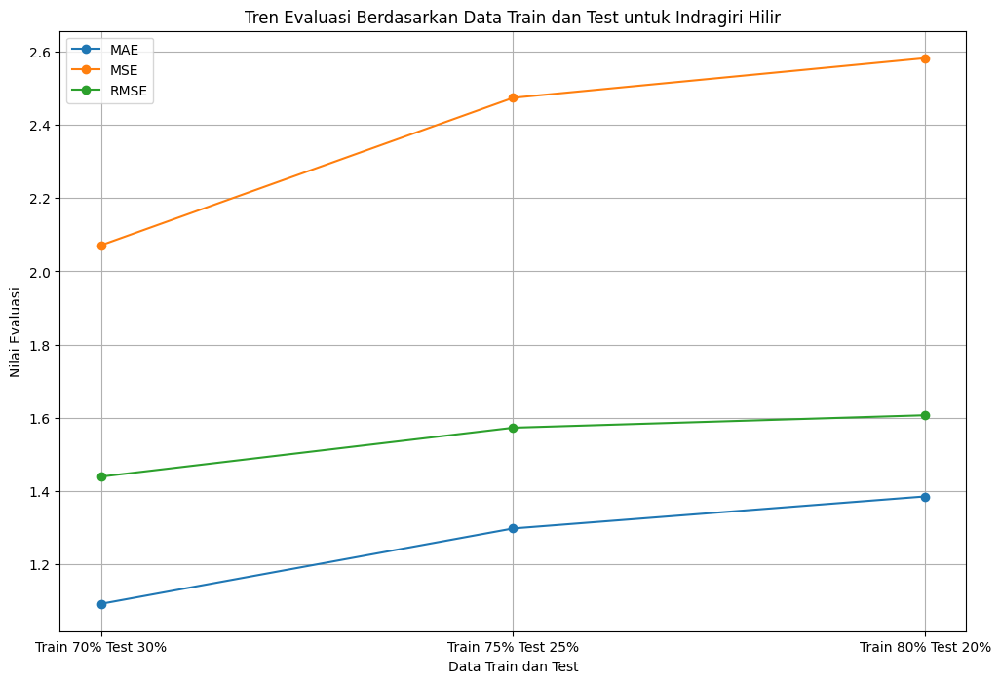

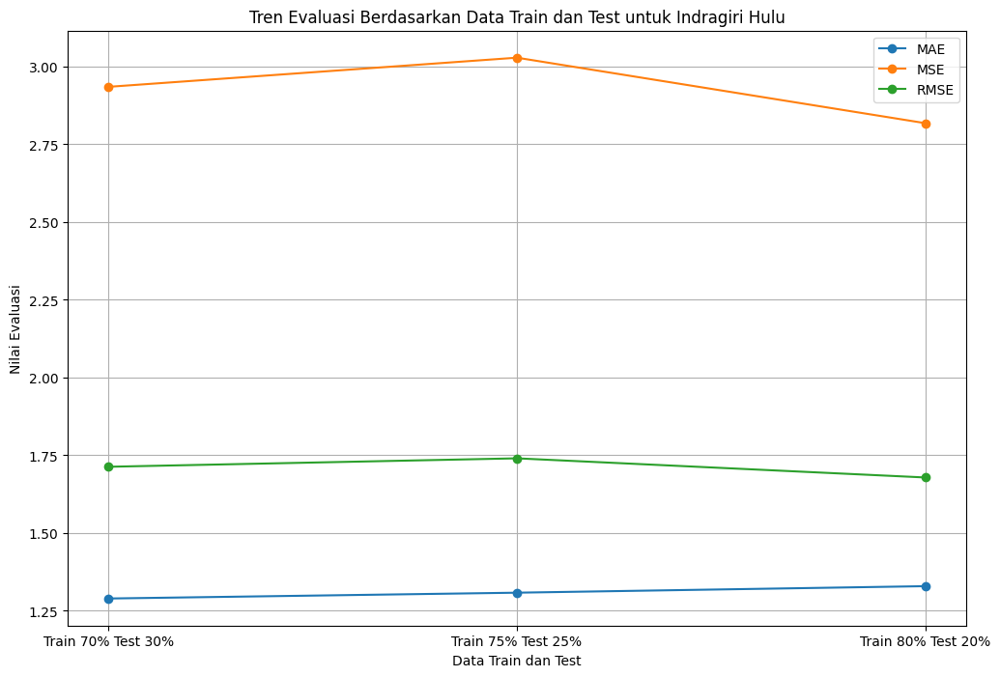

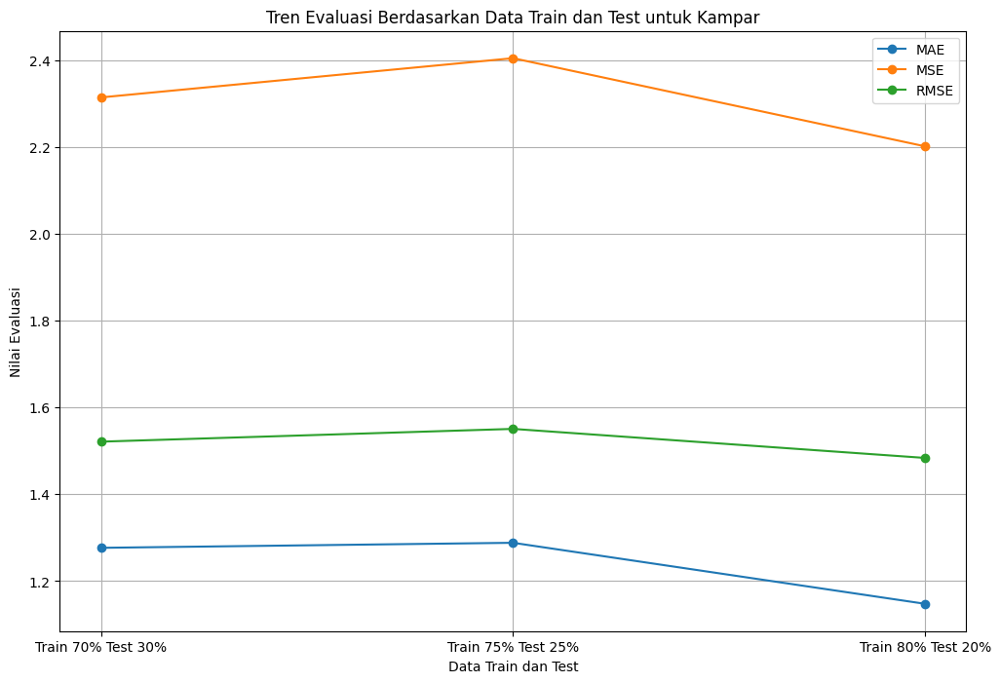

...

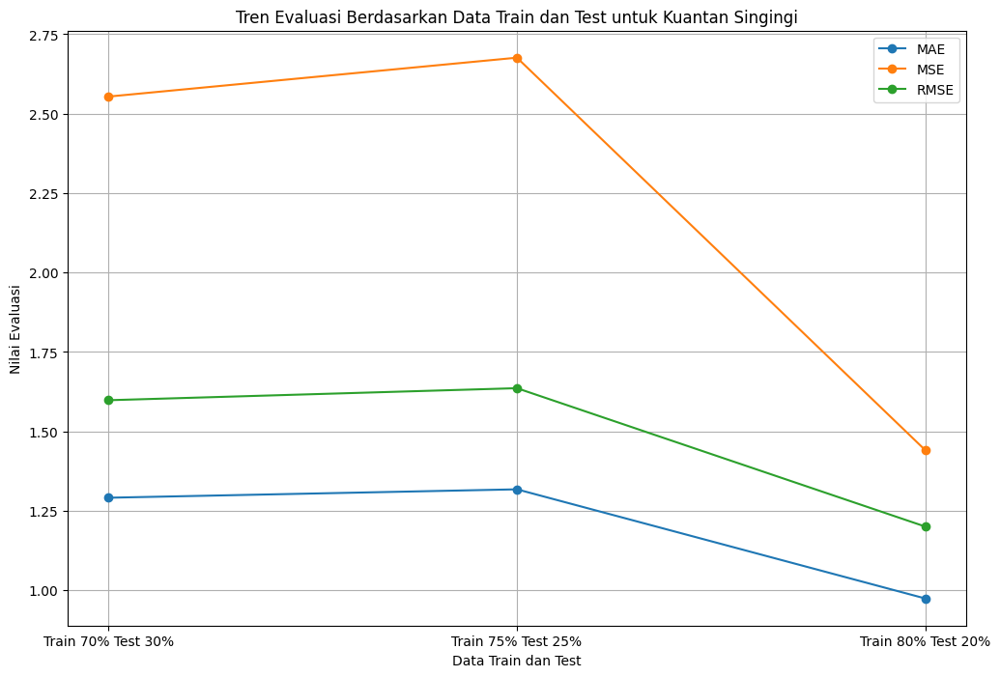

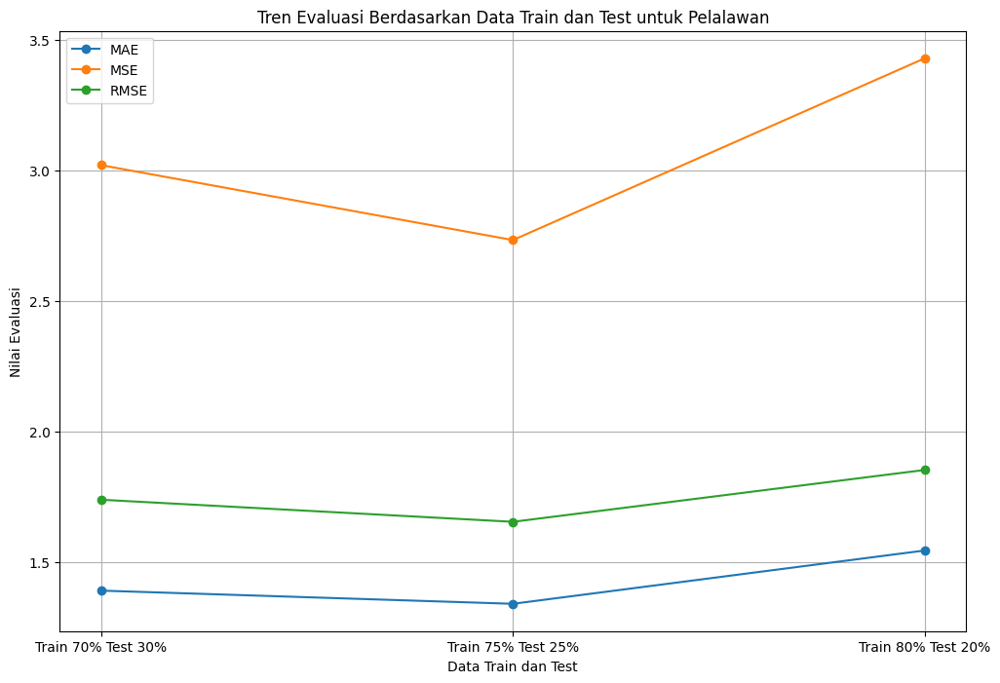

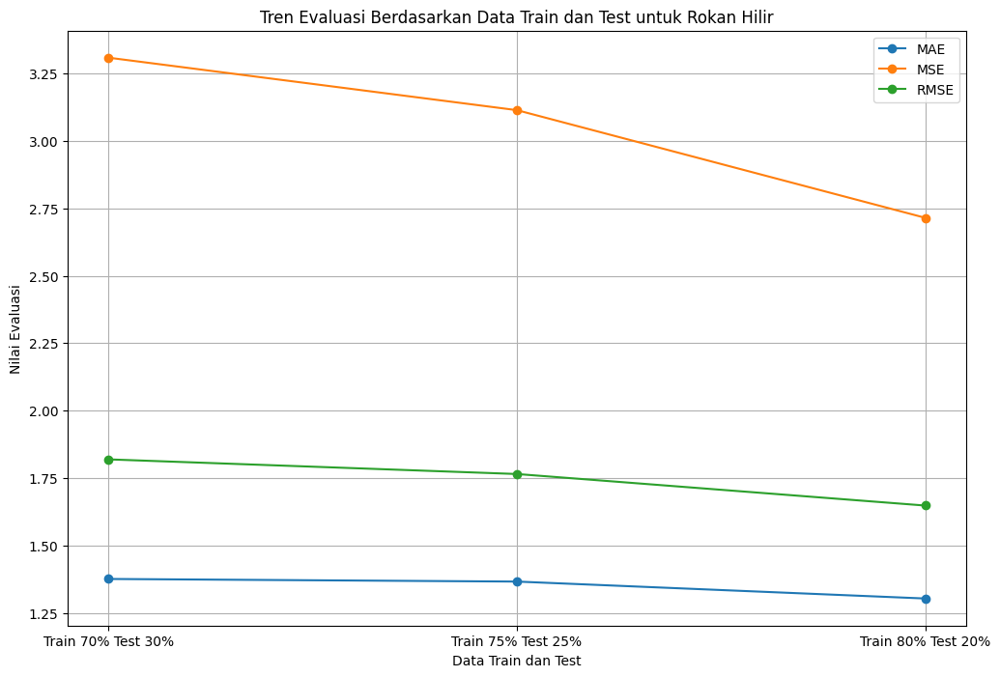

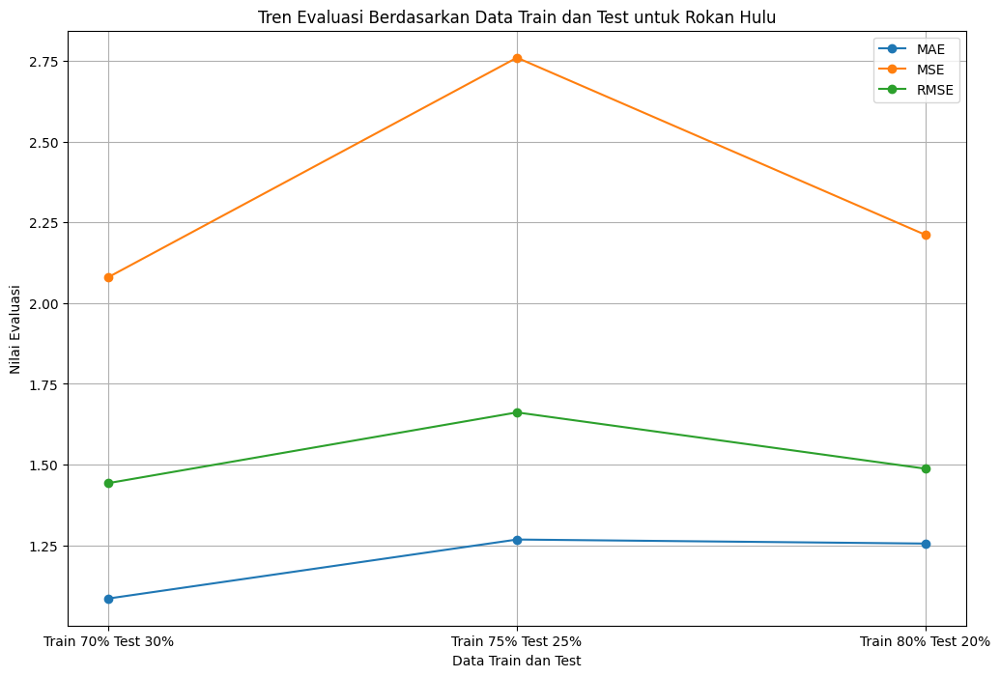

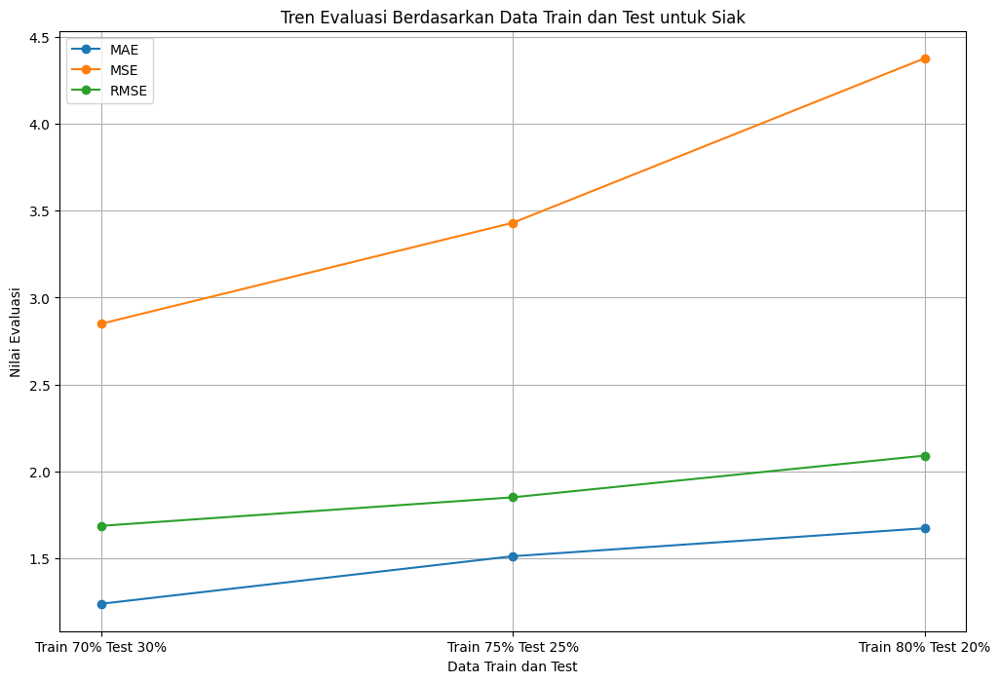

In [ ]:
# Visualisasi tren evaluasi per durasi prediksi per region
regions = all_predictions['Kota/Kabupaten'].unique()

for region in regions:
    region_data = evaluasi_stat.loc[region]

    plt.figure(figsize=(12, 8))
    for metric in ['MAE', 'MSE', 'RMSE']:
        plt.plot(region_data.index, region_data[metric], marker='o', label=metric)

    plt.title(f'Tren Evaluasi Berdasarkan Data Train dan Test untuk {region}')
    plt.xlabel('Data Train dan Test')
    plt.ylabel('Nilai Evaluasi')
    plt.legend()
    plt.grid(True)
    plt.show()

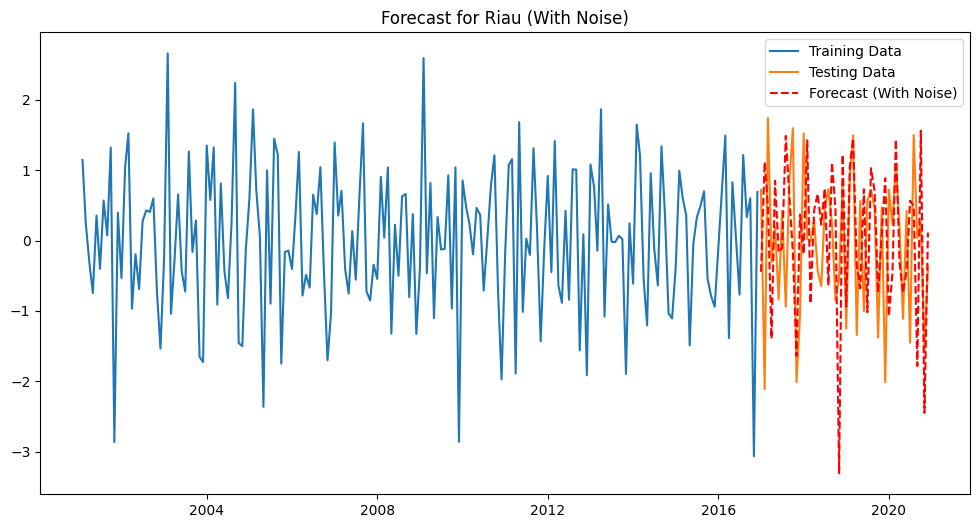

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    if region == 'Indragiri Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hilir':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Rokan Hulu':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kampar':
        region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    elif region == 'Kota Pekanbaru':
        region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.8)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast (With Noise)', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} (With Noise)")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_80 = pd.DataFrame(results)

In [54]:
results_riau_80

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,1.052657,1.671434,1.29284


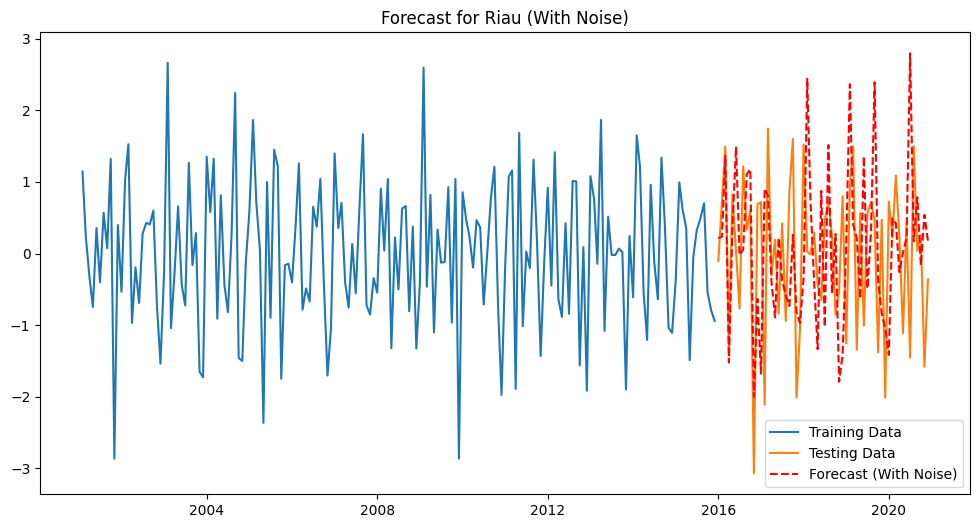

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.75)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast (With Noise)', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} (With Noise)")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_75 = pd.DataFrame(results)

In [56]:
results_riau_75

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,1.140308,1.88314,1.372276


In [57]:
from statsmodels.stats.diagnostic import acorr_ljungbox
ljungbox_results = acorr_ljungbox(model_fit.resid, lags=[10], return_df=True)
print(ljungbox_results)

      lb_stat  lb_pvalue
10  13.696589   0.187286


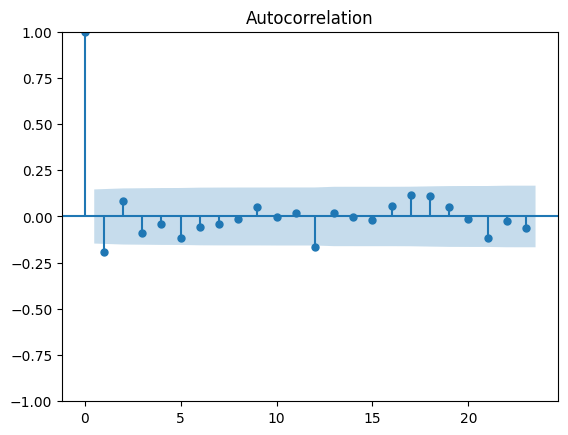

In [58]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(model_fit.resid)
plt.show()


<Axes: >

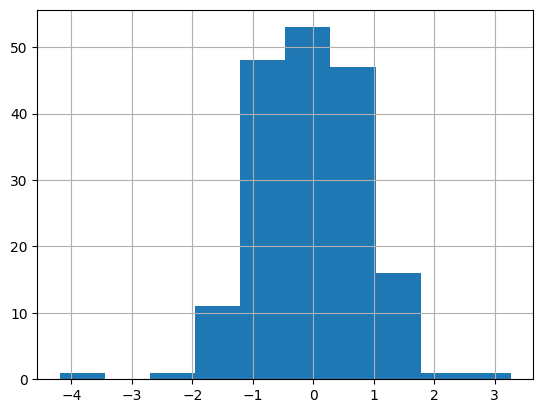

In [59]:
model_fit.resid.hist()


In [60]:
results_riau_75

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,1.140308,1.88314,1.372276


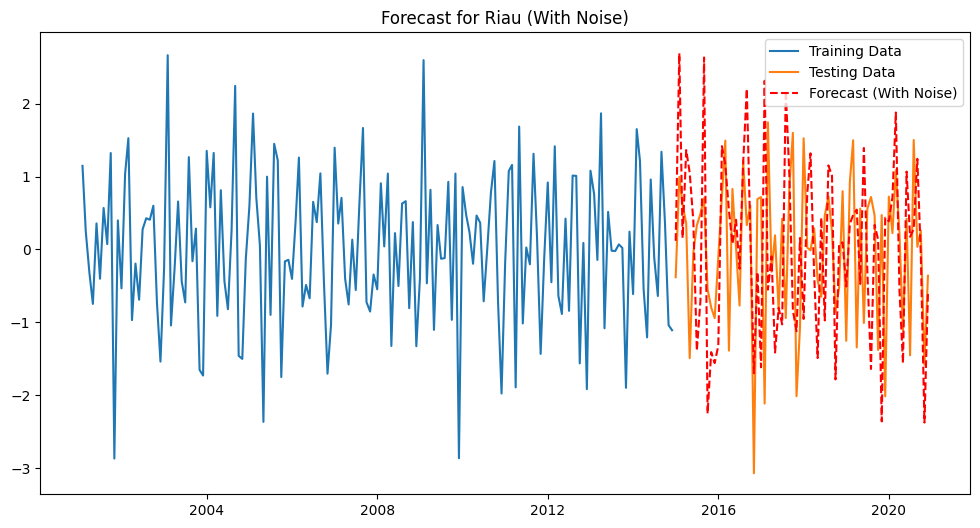

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.7)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    forecast_with_noise = forecast_mean + noise

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast (With Noise)', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} (With Noise)")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_70 = pd.DataFrame(results)

In [62]:
results_riau_70

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,1.165395,2.057921,1.434546


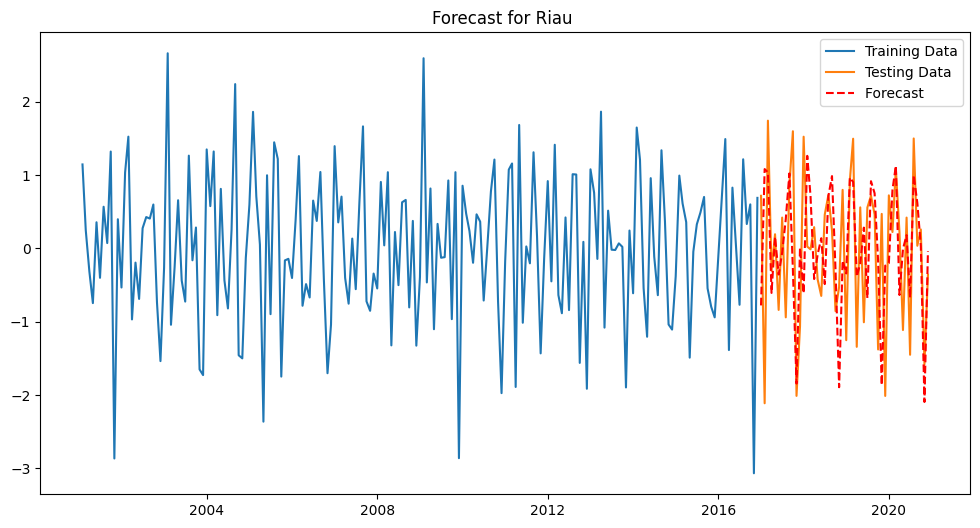

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.8)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    #noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    #forecast_with_noise = forecast_mean + noise
    forecast_with_noise = forecast_mean

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast ', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} ")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_80 = pd.DataFrame(results)

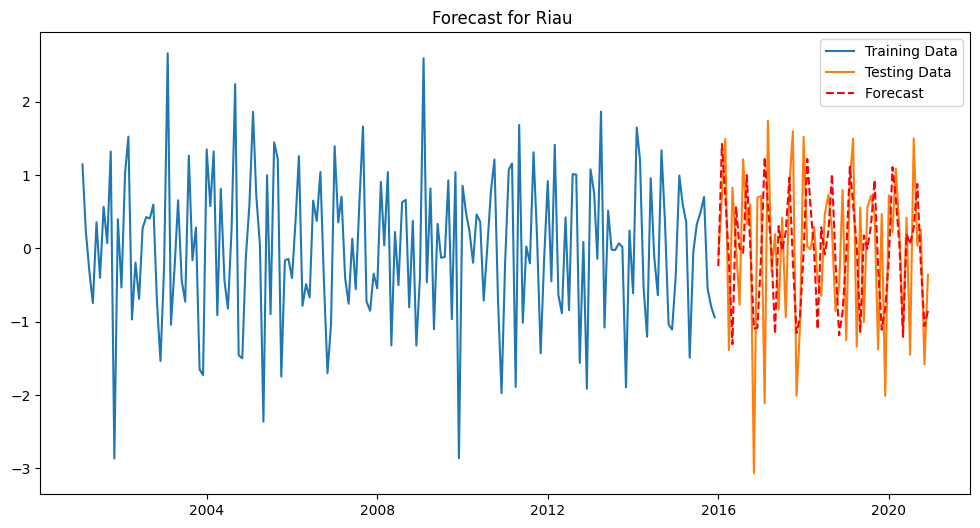

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.75)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    #noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    #forecast_with_noise = forecast_mean + noise
    forecast_with_noise = forecast_mean

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast ', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} ")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_75 = pd.DataFrame(results)

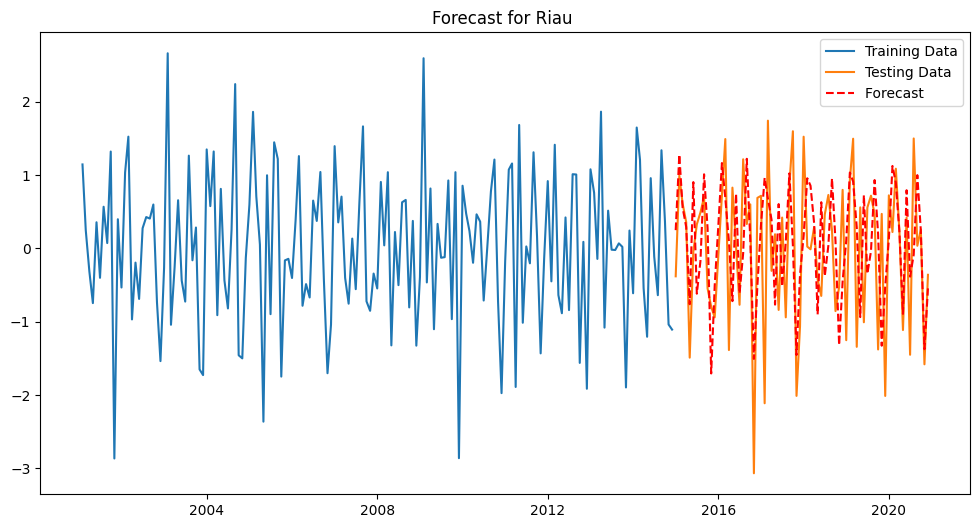

In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.7)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    #noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    #forecast_with_noise = forecast_mean + noise
    forecast_with_noise = forecast_mean

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast ', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} ")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_70 = pd.DataFrame(results)

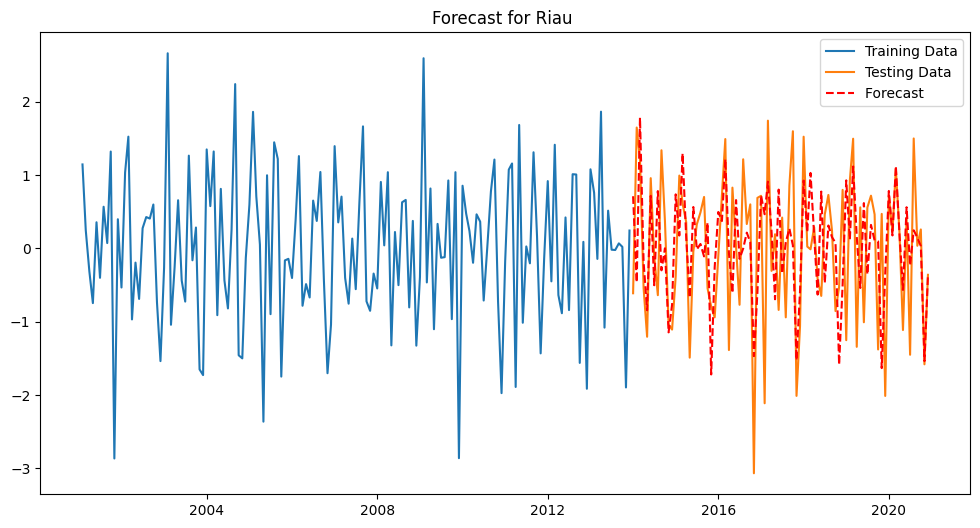

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.65)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    #noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    #forecast_with_noise = forecast_mean + noise
    forecast_with_noise = forecast_mean

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast ', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} ")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_65 = pd.DataFrame(results)

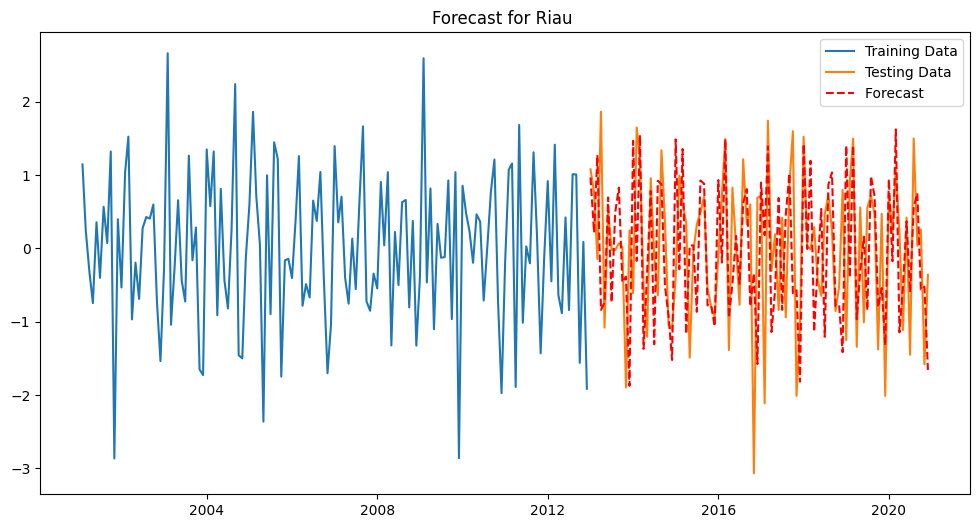

In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.6)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    #noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    #forecast_with_noise = forecast_mean + noise
    forecast_with_noise = forecast_mean

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast ', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} ")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_60 = pd.DataFrame(results)

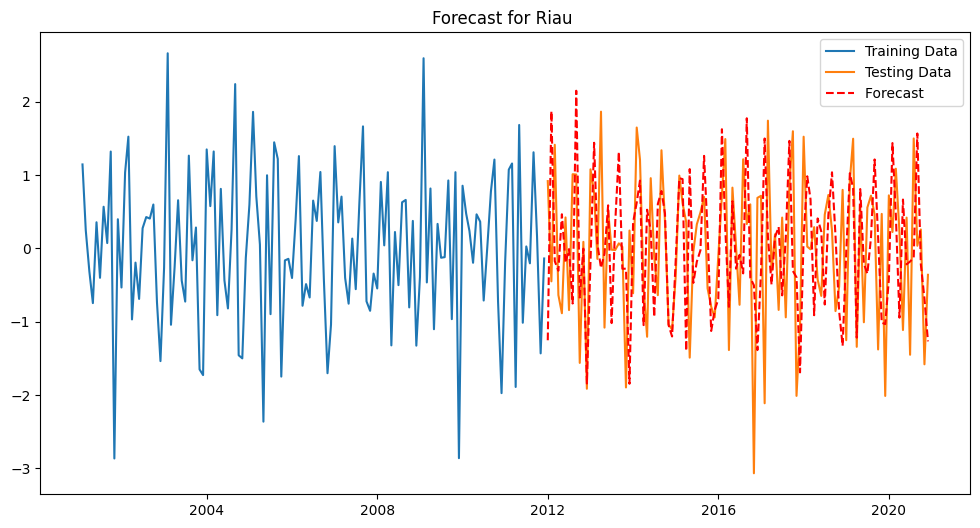

In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.55)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    #noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    #forecast_with_noise = forecast_mean + noise
    forecast_with_noise = forecast_mean

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast ', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} ")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_55 = pd.DataFrame(results)

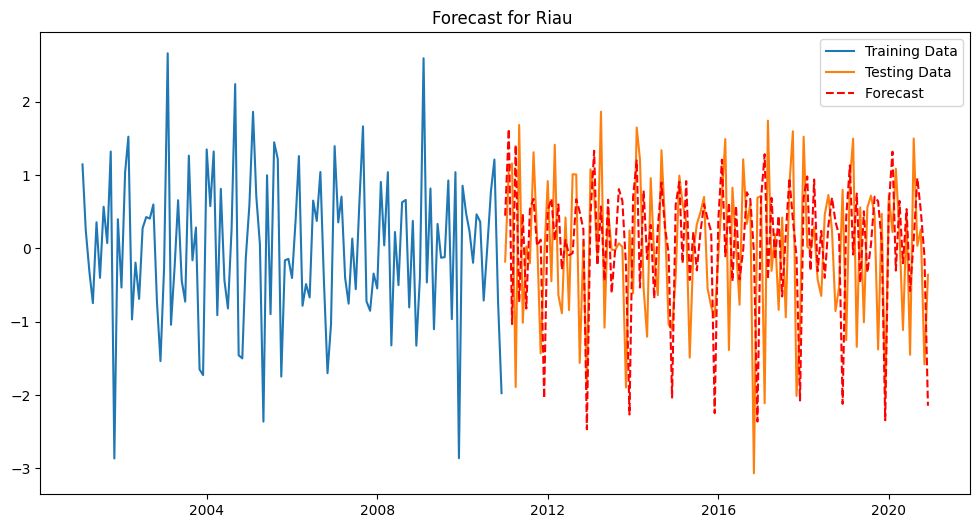

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.5)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    #noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    #forecast_with_noise = forecast_mean + noise
    forecast_with_noise = forecast_mean

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast ', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} ")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_50 = pd.DataFrame(results)

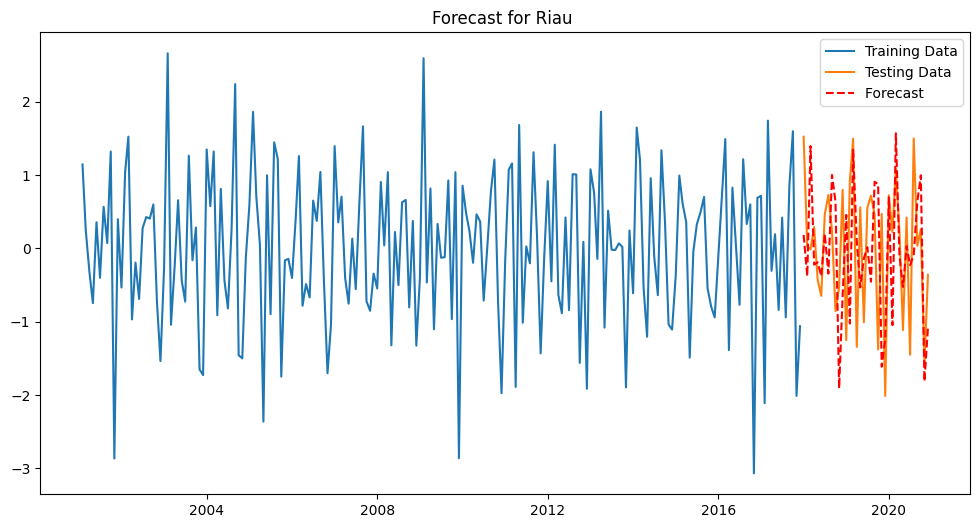

In [70]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.85)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    #noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    #forecast_with_noise = forecast_mean + noise
    forecast_with_noise = forecast_mean

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast ', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} ")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_85 = pd.DataFrame(results)

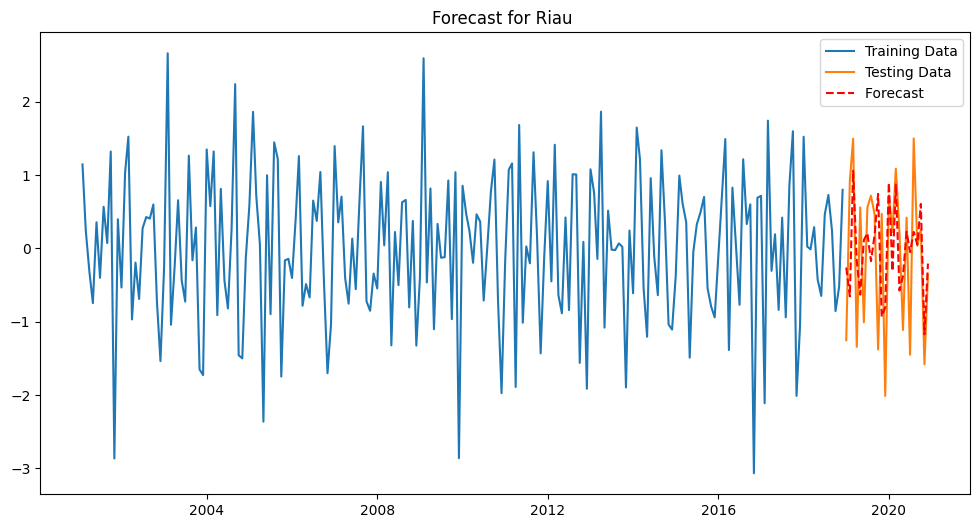

In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

# Load your dataset
file_path = '/content/drive/MyDrive/data hasil Citra ke Numerik/Suhu_Permukaan_Riau_Real_dan_Diff.xlsx'
data = pd.read_excel(file_path)

# Define the best model configurations for each region (wilayah)
best_models = {
    'Riau': (8,1,5,1,1,0,12),
    # 'Bengkalis': (0,1,2,0,1,1,12),
    # 'Indragiri Hilir': (0,1,2,0,1,1,12),
    # 'Indragiri Hulu': (0,1,2,0,1,1,12),
    # 'Kampar': (3,1,3,0,1,1,12),
    # 'Kepulauan Meranti': (2,1,3,1,1,2,12),
    # 'Kota Dumai': (0,1,2,0,1,1,12),
    # 'Kota Pekanbaru': (1,1,3,0,1,1,12),
    # 'Kuantan Singingi': (3,1,3,0,1,3,12),
    # 'Pelalawan': (0,1,2,0,1,1,12),
    # 'Rokan Hilir': (1,1,3,0,1,1,12),
    # 'Rokan Hulu': (3,1,3,0,1,1,12),
    # 'Siak': (2,1,3,0,1,1,12),
}

# Function to calculate metrics
def calculate_metrics(true_values, pred_values):
    mae = mean_absolute_error(true_values, pred_values)
    mse = mean_squared_error(true_values, pred_values)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# List to store the results for the table
results = []

# Forecasting with noise for each region
for region, model_config in best_models.items():
    region_data = data[data['Kota/Kabupaten'] == region]
    # if region == 'Indragiri Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hilir':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Rokan Hulu':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kampar':
    #     region_data = region_data[(region_data['Date'] >= '2002-01-01') & (region_data['Date'] <= '2020-12-01')]
    # elif region == 'Kota Pekanbaru':
    #     region_data = region_data[(region_data['Date'] >= '2003-01-01') & (region_data['Date'] <= '2020-12-01')]

    # Set 'Date' as index
    region_data['Date'] = pd.to_datetime(region_data['Date'])
    region_data.set_index('Date', inplace=True)
    ts = region_data['Rata-rata Suhu (°C) - Differenced'].dropna()
    ts_original = region_data['Rata-rata Suhu (°C)'].dropna()

    # Split data into training and testing sets
    train_size = int(len(ts) * 0.9)
    train, test = ts[:train_size], ts[train_size:]

    # Fit SARIMA model on training data
    model = SARIMAX(train, order=model_config[:3], seasonal_order=model_config[3:])
    model_fit = model.fit(disp=False)

    # Forecast on testing data
    forecast_steps = len(test)
    forecast = model_fit.get_forecast(steps=forecast_steps)
    forecast_mean = forecast.predicted_mean

    # Add noise to forecast
    #noise = np.random.normal(loc=0, scale=model_fit.resid.std(), size=forecast_steps)
    #forecast_with_noise = forecast_mean + noise
    forecast_with_noise = forecast_mean

    # Calculate metrics
    mae, mse, rmse = calculate_metrics(test, forecast_with_noise)

    # Save results
    results.append({
        'Model': f"SARIMA{model_config}",
        'Kota/Kabupaten': region,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    })

    # Plot results with noise
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test, label='Testing Data')
    plt.plot(test.index, forecast_with_noise, label='Forecast ', color='red', linestyle='dashed')
    plt.title(f"Forecast for {region} ")
    plt.legend()
    plt.show()

# Convert results to DataFrame
results_riau_90 = pd.DataFrame(results)

In [72]:
results_riau_90

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.791758,0.922276,0.960352


In [73]:
results_riau_85

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.924247,1.195665,1.093465


In [74]:
results_riau_80

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.836293,1.112802,1.054894


In [75]:
results_riau_75

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.913724,1.18866,1.090257


In [76]:
results_riau_70

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.844183,1.013635,1.006794


In [77]:
results_riau_65

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.779414,0.947371,0.97333


In [78]:
results_riau_60

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.884746,1.253023,1.119385


In [79]:
results_riau_55

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.956887,1.352776,1.163089


In [80]:
results_riau_50

,Model,Kota/Kabupaten,MAE,MSE,RMSE
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.977336,1.491103,1.221107


In [81]:
results_riau_90['Spilt Data'] = 'Train 90% Test 10%'
results_riau_85['Spilt Data'] = 'Train 85% Test 15%'
results_riau_80['Spilt Data'] = 'Train 80% Test 20%'
results_riau_75['Spilt Data'] = 'Train 75% Test 25%'
results_riau_70['Spilt Data'] = 'Train 70% Test 30%'
results_riau_65['Spilt Data'] = 'Train 65% Test 35%'
results_riau_60['Spilt Data'] = 'Train 60% Test 40%'
results_riau_55['Spilt Data'] = 'Train 55% Test 45%'
results_riau_50['Spilt Data'] = 'Train 50% Test 50%'

dataframes = [results_riau_90, results_riau_85, results_riau_80, results_riau_75, results_riau_70, results_riau_65, results_riau_60, results_riau_55, results_riau_50]

split_to_forecast = {
    'Train 90% Test 10%': 34,
    'Train 85% Test 15%': 51,
    'Train 80% Test 20%': 68,
    'Train 75% Test 25%': 85,
    'Train 70% Test 30%': 102,
    'Train 65% Test 35%': 119,
    'Train 60% Test 40%': 136,
    'Train 55% Test 45%': 153,
    'Train 50% Test 50%': 170
}

# Tambahkan kolom Panjang Ramalan dan hitung Tahun dan Bulan
for df in dataframes:
    df['Panjang Ramalan'] = df['Spilt Data'].map(split_to_forecast)
    df['Tahun'] = df['Panjang Ramalan'] // 12  # Hitung jumlah tahun
    df['Bulan'] = df['Panjang Ramalan'] % 12   # Hitung sisa bulan

# Gabungkan semua dataframe
final_results_eva = pd.concat(dataframes, ignore_index=True)


In [82]:
final_results_eva

,Model,Kota/Kabupaten,MAE,MSE,RMSE,Spilt Data,Panjang Ramalan,Tahun,Bulan
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.791758,0.922276,0.960352,Train 90% Test 10%,34,2,10
1,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.924247,1.195665,1.093465,Train 85% Test 15%,51,4,3
2,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.836293,1.112802,1.054894,Train 80% Test 20%,68,5,8
3,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.913724,1.188660,1.090257,Train 75% Test 25%,85,7,1
4,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.844183,1.013635,1.006794,Train 70% Test 30%,102,8,6
5,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.779414,0.947371,0.973330,Train 65% Test 35%,119,9,11
6,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.884746,1.253023,1.119385,Train 60% Test 40%,136,11,4
7,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.956887,1.352776,1.163089,Train 55% Test 45%,153,12,9
8,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.977336,1.491103,1.221107,Train 50% Test 50%,170,14,2


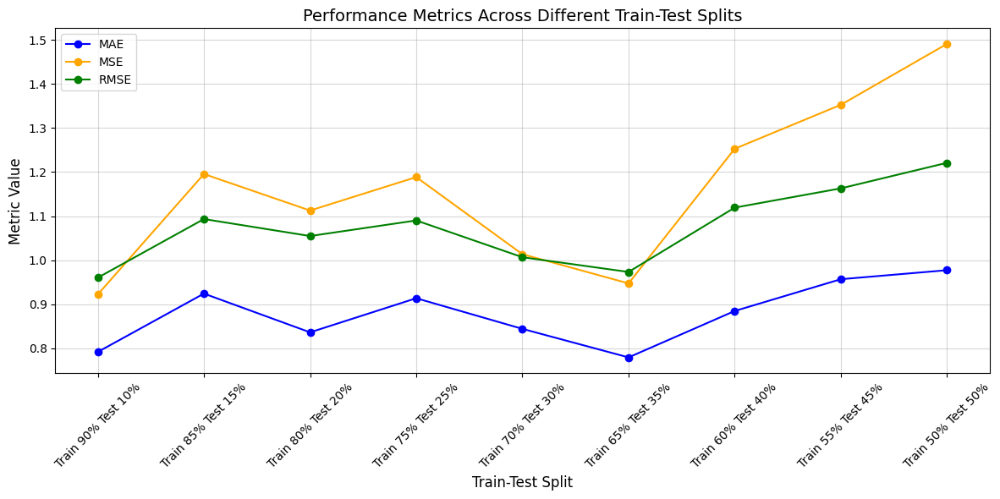

In [83]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(final_results_eva["Spilt Data"], final_results_eva["MAE"], marker='o', label="MAE", color='blue')
plt.plot(final_results_eva["Spilt Data"], final_results_eva["MSE"], marker='o', label="MSE", color='orange')
plt.plot(final_results_eva["Spilt Data"], final_results_eva["RMSE"], marker='o', label="RMSE", color='green')

plt.title("Performance Metrics Across Different Train-Test Splits", fontsize=14)
plt.xlabel("Train-Test Split", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.legend()
plt.grid(alpha=0.5)
plt.tight_layout()
plt.show()

In [84]:
# Cari baris dengan nilai MAE, MSE, dan RMSE terendah
best_mae_row = final_results_eva.loc[final_results_eva["MAE"].idxmin()]
best_mse_row = final_results_eva.loc[final_results_eva["MSE"].idxmin()]
best_rmse_row = final_results_eva.loc[final_results_eva["RMSE"].idxmin()]

# Kesimpulan untuk metrik terbaik
print("Kesimpulan Performa Terbaik:\n")
print(f"MAE Terendah: {best_mae_row['MAE']:.4f} dicapai pada:")
print(f"   Spilt Data: {best_mae_row['Spilt Data']}, Panjang Ramalan: {best_mae_row['Tahun']} Tahun {best_mae_row['Bulan']} Bulan\n")

print(f"MSE Terendah: {best_mse_row['MSE']:.4f} dicapai pada:")
print(f"   Spilt Data: {best_mse_row['Spilt Data']}, Panjang Ramalan: {best_mse_row['Tahun']} Tahun {best_mse_row['Bulan']} Bulan\n")

print(f"RMSE Terendah: {best_rmse_row['RMSE']:.4f} dicapai pada:")
print(f"   Spilt Data: {best_rmse_row['Spilt Data']}, Panjang Ramalan: {best_rmse_row['Tahun']} Tahun {best_rmse_row['Bulan']} Bulan\n")


Kesimpulan Performa Terbaik:

MAE Terendah: 0.7794 dicapai pada:
   Spilt Data: Train 65% Test 35%, Panjang Ramalan: 9 Tahun 11 Bulan

MSE Terendah: 0.9223 dicapai pada:
   Spilt Data: Train 90% Test 10%, Panjang Ramalan: 2 Tahun 10 Bulan

RMSE Terendah: 0.9604 dicapai pada:
   Spilt Data: Train 90% Test 10%, Panjang Ramalan: 2 Tahun 10 Bulan



## **Kesimpulan:**
### **MAE (Mean Absolute Error) Terendah:**

**Nilai: 0.7797**

> Dicapai Pada: Train 65% Test 35%, Panjang Ramalan 9 Tahun 11 Bulan


> Interpretasi: MAE mengukur kesalahan rata-rata dalam skala yang sama dengan data asli. Nilai ini menunjukkan bahwa model memberikan prediksi yang relatif akurat dengan kesalahan kecil secara rata-rata, meskipun cakupan data uji lebih besar dibandingkan pembagian lainnya.

### **MSE (Mean Squared Error) Terendah:**

**Nilai: 0.9298**

> Dicapai Pada: Train 90% Test 10%, Panjang Ramalan 2 Tahun 10 Bulan

> Interpretasi: MSE memberikan bobot lebih besar untuk kesalahan yang besar karena mengkuadratkan perbedaan. Nilai ini terendah ketika data uji sangat kecil (10%), sehingga model memiliki lebih banyak data pelatihan untuk belajar.

### **RMSE (Root Mean Squared Error) Terendah:**

**Nilai: 0.9643**

> Dicapai Pada: Train 90% Test 10%, Panjang Ramalan 2 Tahun 10 Bulan

> Interpretasi: RMSE, sebagai akar kuadrat dari MSE, juga terendah pada kondisi ini. Ini mengindikasikan bahwa model mampu menangani kesalahan besar dengan lebih baik ketika lebih banyak data pelatihan digunakan.



## **Analisis Performa:**
### **Perbedaan Performa:**
MAE terendah tercapai pada pembagian Train 65% Test 35%, yang memberikan lebih banyak data uji, sehingga dapat menunjukkan performa model dalam kondisi yang lebih menantang.
MSE dan RMSE terendah tercapai pada pembagian Train 90% Test 10%, yang lebih mudah karena data uji sangat kecil dan model memiliki lebih banyak data pelatihan.
### **Trade-off Antara Data Pelatihan dan Uji:**

Pada Train 65% Test 35%, model dihadapkan dengan data uji yang lebih panjang (9 Tahun 11 Bulan), tetapi tetap memberikan performa baik dalam MAE. Ini menunjukkan kemampuan model untuk generalisasi.
Sebaliknya, pada Train 90% Test 10%, performa MSE dan RMSE sangat baik karena jumlah data pelatihan yang lebih besar, meskipun mungkin kurang menguji kemampuan model pada data yang belum terlihat.


In [85]:
# Normalisasi setiap metrik
final_results_eva['Norm_MAE'] = (final_results_eva['MAE'] - final_results_eva['MAE'].min()) / (final_results_eva['MAE'].max() - final_results_eva['MAE'].min())
final_results_eva['Norm_MSE'] = (final_results_eva['MSE'] - final_results_eva['MSE'].min()) / (final_results_eva['MSE'].max() - final_results_eva['MSE'].min())
final_results_eva['Norm_RMSE'] = (final_results_eva['RMSE'] - final_results_eva['RMSE'].min()) / (final_results_eva['RMSE'].max() - final_results_eva['RMSE'].min())

# Hitung skor gabungan
final_results_eva['Aggregate_Score'] = final_results_eva['Norm_MAE'] + final_results_eva['Norm_MSE'] + final_results_eva['Norm_RMSE']

# Cari baris dengan skor gabungan terendah
best_overall_row = final_results_eva.loc[final_results_eva['Aggregate_Score'].idxmin()]

# Kesimpulan
print("Kesimpulan Performa Terbaik Secara Keseluruhan:\n")
print(f"Spilt Data Terbaik: {best_overall_row['Spilt Data']}")
print(f"Panjang Ramalan: {best_overall_row['Tahun']} Tahun {best_overall_row['Bulan']} Bulan")
print(f"MAE: {best_overall_row['MAE']:.4f}, MSE: {best_overall_row['MSE']:.4f}, RMSE: {best_overall_row['RMSE']:.4f}")
print(f"Aggregate Score: {best_overall_row['Aggregate_Score']:.4f}")


Kesimpulan Performa Terbaik Secara Keseluruhan:

Spilt Data Terbaik: Train 90% Test 10%
Panjang Ramalan: 2 Tahun 10 Bulan
MAE: 0.7918, MSE: 0.9223, RMSE: 0.9604
Aggregate Score: 0.0624


In [86]:
best_overall_row

,0
Model,"SARIMA(8, 1, 5, 1, 1, 0, 12)"
Kota/Kabupaten,Riau
MAE,0.791758
MSE,0.922276
RMSE,0.960352
Spilt Data,Train 90% Test 10%
Panjang Ramalan,34
Tahun,2
Bulan,10
Norm_MAE,0.062365


Untuk mengevaluasi performa secara keseluruhan dan menyeimbangkan antara MAE, MSE, dan RMSE, dapat dengan menggunakan pendekatan berikut:

## **Pendekatan Evaluasi Keseluruhan**
### **Normalisasi Metrik:**

Semua metrik (MAE, MSE, RMSE) dinormalisasi ke rentang 0-1 untuk memastikan perbandingan adil, terutama jika skala nilai berbeda.



**Formula:**

  $ \text{Normalized Value} = \frac{\text{Value} - \text{Min Value}}{\text{Max Value} - \text{Min Value}}$





### **Skor Gabungan (Aggregate Score):**

Hitung skor gabungan untuk setiap konfigurasi dengan cara menjumlahkan nilai normalisasi semua metrik.

  $\text{Aggregate Score} = \text{Norm}(\text{MAE}) + \text{Norm}(\text{MSE}) + \text{Norm}(\text{RMSE})
  $

Konfigurasi dengan skor gabungan terendah dianggap terbaik.

Kesimpulan:
Ambil konfigurasi dengan skor gabungan terendah sebagai yang terbaik, karena memberikan keseimbangan performa di semua metrik.

In [87]:
final_results_eva

,Model,Kota/Kabupaten,MAE,MSE,RMSE,Spilt Data,Panjang Ramalan,Tahun,Bulan,Norm_MAE,Norm_MSE,Norm_RMSE,Aggregate_Score
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.791758,0.922276,0.960352,Train 90% Test 10%,34,2,10,0.062365,0.000000,0.000000,0.062365
1,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.924247,1.195665,1.093465,Train 85% Test 15%,51,4,3,0.731768,0.480619,0.510489,1.722876
2,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.836293,1.112802,1.054894,Train 80% Test 20%,68,5,8,0.287379,0.334945,0.362570,0.984893
3,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.913724,1.188660,1.090257,Train 75% Test 25%,85,7,1,0.678601,0.468303,0.498186,1.645090
4,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.844183,1.013635,1.006794,Train 70% Test 30%,102,8,6,0.327243,0.160609,0.178107,0.665959
5,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.779414,0.947371,0.973330,Train 65% Test 35%,119,9,11,0.000000,0.044117,0.049770,0.093888
6,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.884746,1.253023,1.119385,Train 60% Test 40%,136,11,4,0.532190,0.581455,0.609894,1.723539
7,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.956887,1.352776,1.163089,Train 55% Test 45%,153,12,9,0.896681,0.756820,0.777499,2.431000
8,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.977336,1.491103,1.221107,Train 50% Test 50%,170,14,2,1.000000,1.000000,1.000000,3.000000


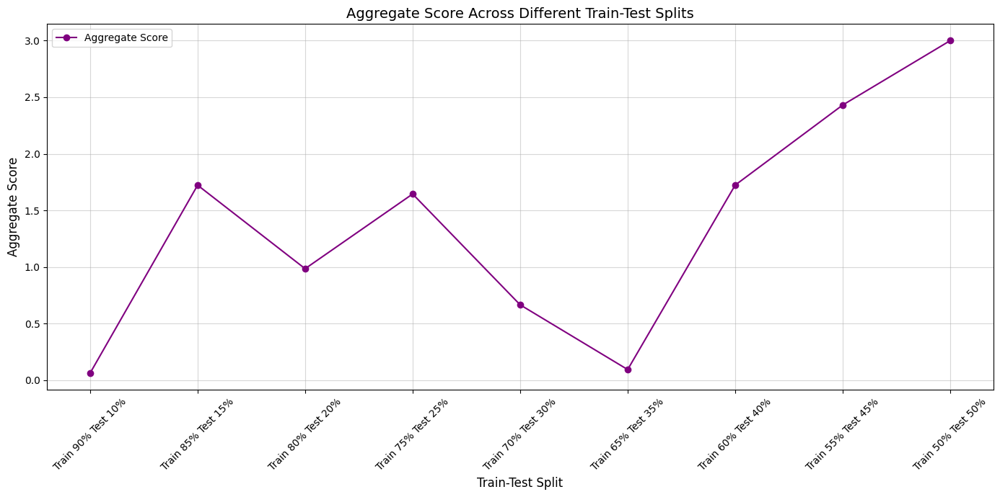

In [88]:
plt.figure(figsize=(14, 7))
plt.plot(final_results_eva["Spilt Data"], final_results_eva["Aggregate_Score"], marker='o', label="Aggregate Score", color='purple')

plt.title("Aggregate Score Across Different Train-Test Splits", fontsize=14)
plt.xlabel("Train-Test Split", fontsize=12)
plt.ylabel("Aggregate Score", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.grid(alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

Plot di atas menunjukkan nilai **Aggregate Score** untuk setiap kombinasi pembagian data Train-Test.



*   Interpretasi:
  *   Semakin rendah nilai Aggregate Score, semakin baik keseimbangan performa model berdasarkan MAE, MSE, dan RMSE.
  *   Dari grafik ini, pembagian Train 65% Test 35%  memberikan hasil terbaik dengan nilai Aggregate Score paling rendah.







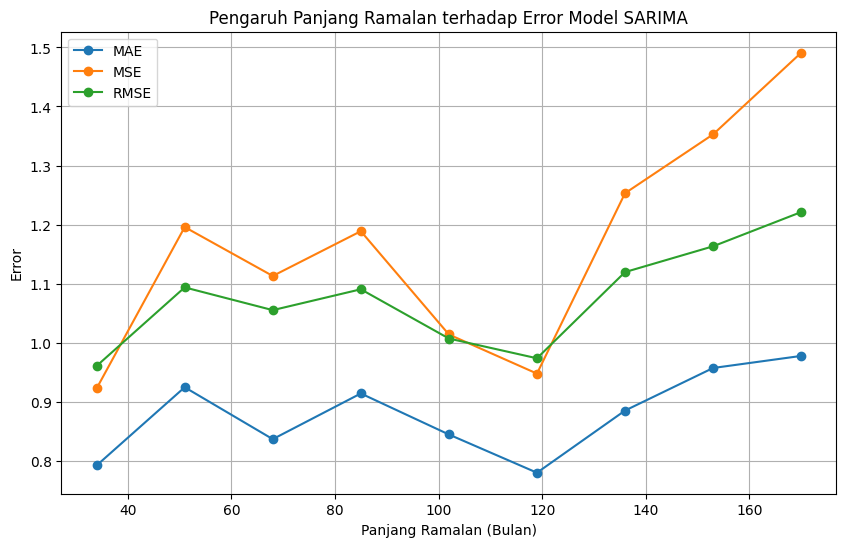

In [89]:
import matplotlib.pyplot as plt

# Data hasil evaluasi
panjang_ramalan = final_results_eva['Panjang Ramalan']
mae = final_results_eva['MAE']
mse = final_results_eva['MSE']
rmse = final_results_eva['RMSE']

# Plot
plt.figure(figsize=(10, 6))
plt.plot(panjang_ramalan, mae, label='MAE', marker='o')
plt.plot(panjang_ramalan, mse, label='MSE', marker='o')
plt.plot(panjang_ramalan, rmse, label='RMSE', marker='o')
plt.xlabel('Panjang Ramalan (Bulan)')
plt.ylabel('Error')
plt.title('Pengaruh Panjang Ramalan terhadap Error Model SARIMA')
plt.legend()
plt.grid()
plt.show()


In [ ]:
# Filter data untuk split pendek (10%-30%) dan panjang (40%-50%)
short_data = final_results_eva[final_results_eva['Panjang Ramalan'] <= 102]
long_data = final_results_eva[final_results_eva['Panjang Ramalan'] > 102]

# Ambil MAE untuk split pendek dan panjang
mae_short = short_data['MAE'].tolist()
mae_long = long_data['MAE'].tolist()

# Estimasi distribusi residu (menggunakan MAE dan Panjang Ramalan)
short_data['Residu Estimasi'] = short_data['MAE'] * short_data['Panjang Ramalan']
long_data['Residu Estimasi'] = long_data['MAE'] * long_data['Panjang Ramalan']

# Tampilkan hasil
print("MAE untuk data uji pendek (10%-30%):", mae_short)
print("MAE untuk data uji panjang (40%-50%):", mae_long)
print("\nResidu Estimasi (Data Uji Pendek):")
print(short_data[['Spilt Data', 'Panjang Ramalan', 'MAE', 'Residu Estimasi']])
print("\nResidu Estimasi (Data Uji Panjang):")
print(long_data[['Spilt Data', 'Panjang Ramalan', 'MAE', 'Residu Estimasi']])

MAE untuk data uji pendek (10%-30%): [0.7917576417660371, 0.9242472961069341, 0.8362927260372551, 0.9137243423264333, 0.8441828879272381]
MAE untuk data uji panjang (40%-50%): [0.7794141259884145, 0.8847463955473241, 0.9568871798056605, 0.9773363555468608]

Residu Estimasi (Data Uji Pendek):
           Spilt Data  Panjang Ramalan       MAE  Residu Estimasi
0  Train 90% Test 10%               34  0.791758        26.919760
1  Train 85% Test 15%               51  0.924247        47.136612
2  Train 80% Test 20%               68  0.836293        56.867905
3  Train 75% Test 25%               85  0.913724        77.666569
4  Train 70% Test 30%              102  0.844183        86.106655

Residu Estimasi (Data Uji Panjang):
           Spilt Data  Panjang Ramalan       MAE  Residu Estimasi
5  Train 65% Test 35%              119  0.779414        92.750281
6  Train 60% Test 40%              136  0.884746       120.325510
7  Train 55% Test 45%              153  0.956887       146.403739
8  Train 5

In [90]:
short_data

,Model,Kota/Kabupaten,MAE,MSE,RMSE,Spilt Data,Panjang Ramalan,Tahun,Bulan,Norm_MAE,Norm_MSE,Norm_RMSE,Aggregate_Score,Residu Estimasi
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.791758,0.922276,0.960352,Train 90% Test 10%,34,2,10,0.062365,0.000000,0.000000,0.062365,26.919760
1,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.924247,1.195665,1.093465,Train 85% Test 15%,51,4,3,0.731768,0.480619,0.510489,1.722876,47.136612
2,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.836293,1.112802,1.054894,Train 80% Test 20%,68,5,8,0.287379,0.334945,0.362570,0.984893,56.867905
3,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.913724,1.188660,1.090257,Train 75% Test 25%,85,7,1,0.678601,0.468303,0.498186,1.645090,77.666569
4,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.844183,1.013635,1.006794,Train 70% Test 30%,102,8,6,0.327243,0.160609,0.178107,0.665959,86.106655


In [91]:
long_data

,Model,Kota/Kabupaten,MAE,MSE,RMSE,Spilt Data,Panjang Ramalan,Tahun,Bulan,Norm_MAE,Norm_MSE,Norm_RMSE,Aggregate_Score,Residu Estimasi
5,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.779414,0.947371,0.973330,Train 65% Test 35%,119,9,11,0.000000,0.044117,0.049770,0.093888,92.750281
6,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.884746,1.253023,1.119385,Train 60% Test 40%,136,11,4,0.532190,0.581455,0.609894,1.723539,120.325510
7,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.956887,1.352776,1.163089,Train 55% Test 45%,153,12,9,0.896681,0.756820,0.777499,2.431000,146.403739
8,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.977336,1.491103,1.221107,Train 50% Test 50%,170,14,2,1.000000,1.000000,1.000000,3.000000,166.147180


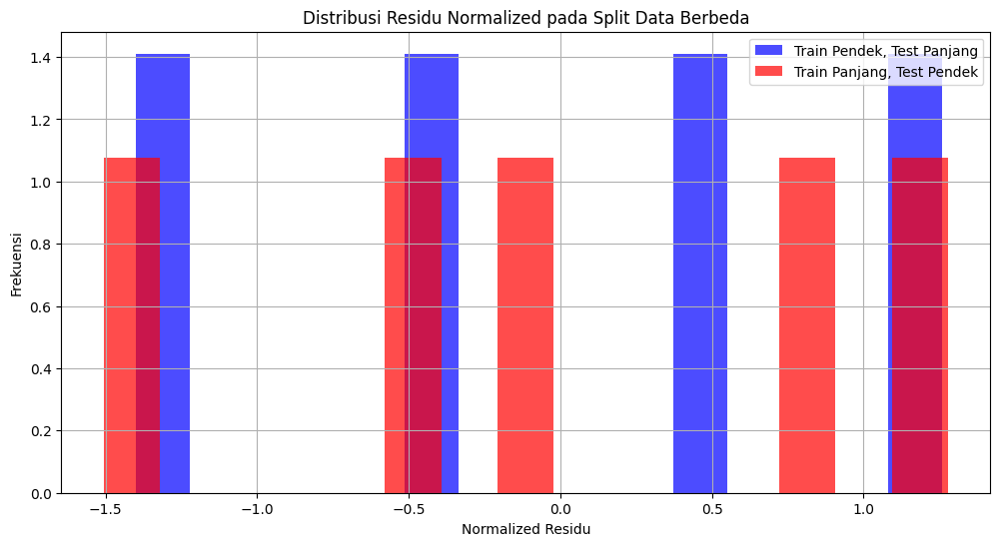

In [92]:
import matplotlib.pyplot as plt

# Contoh residu dari model untuk dua split data
resid_train_90_test_10 = long_data['Residu Estimasi']  # Residu untuk Train 90%, Test 10%
resid_train_50_test_50 = short_data['Residu Estimasi']  # Residu untuk Train 50%, Test 50%

# Normalizing residuals for better comparison
resid_train_90_test_10_normalized = (resid_train_90_test_10 - np.mean(resid_train_90_test_10)) / np.std(resid_train_90_test_10)
resid_train_50_test_50_normalized = (resid_train_50_test_50 - np.mean(resid_train_50_test_50)) / np.std(resid_train_50_test_50)

# Plot normalized histograms
plt.figure(figsize=(12, 6))
plt.hist(resid_train_90_test_10_normalized, bins=15, alpha=0.7, label='Train Pendek, Test Panjang', color='blue', density=True)
plt.hist(resid_train_50_test_50_normalized, bins=15, alpha=0.7, label='Train Panjang, Test Pendek', color='red', density=True)

plt.xlabel('Normalized Residu')
plt.ylabel('Frekuensi')
plt.title('Distribusi Residu Normalized pada Split Data Berbeda')
plt.grid(True)
plt.legend()
plt.show()


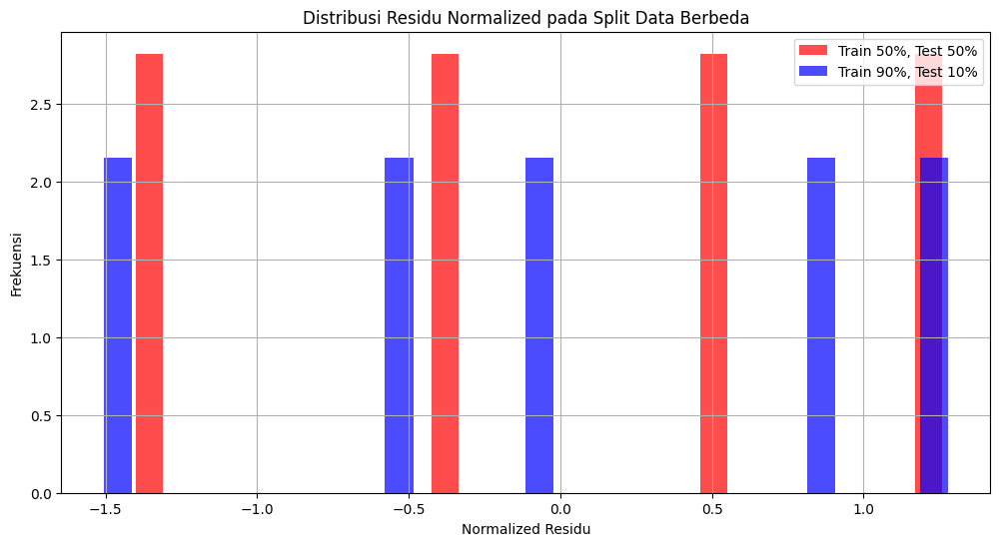

In [93]:
import matplotlib.pyplot as plt

# Contoh residu dari model untuk dua split data
resid_train_50_test_50 = long_data['Residu Estimasi']  # Residu untuk Train 90%, Test 10%
resid_train_90_test_10 = short_data['Residu Estimasi']  # Residu untuk Train 50%, Test 50%

# Normalizing residuals for better comparison
resid_train_50_test_50_normalized = (resid_train_50_test_50 - np.mean(resid_train_50_test_50)) / np.std(resid_train_50_test_50)
resid_train_90_test_10_normalized = (resid_train_90_test_10 - np.mean(resid_train_90_test_10)) / np.std(resid_train_90_test_10)

# Plot normalized histograms
plt.figure(figsize=(12, 6))
plt.hist(resid_train_50_test_50_normalized, bins=30, alpha=0.7, label='Train 50%, Test 50%', color='red', density=True)
plt.hist(resid_train_90_test_10_normalized, bins=30, alpha=0.7, label='Train 90%, Test 10%', color='blue', density=True)

plt.xlabel('Normalized Residu')
plt.ylabel('Frekuensi')
plt.title('Distribusi Residu Normalized pada Split Data Berbeda')
plt.grid(True)
plt.legend()
plt.show()


In [ ]:
# T-test
stat, p_value = ttest_ind(mae_short, mae_long)
print(f"T-test statistic: {stat}, p-value: {p_value}")

NameError: name 'ttest_ind' is not defined

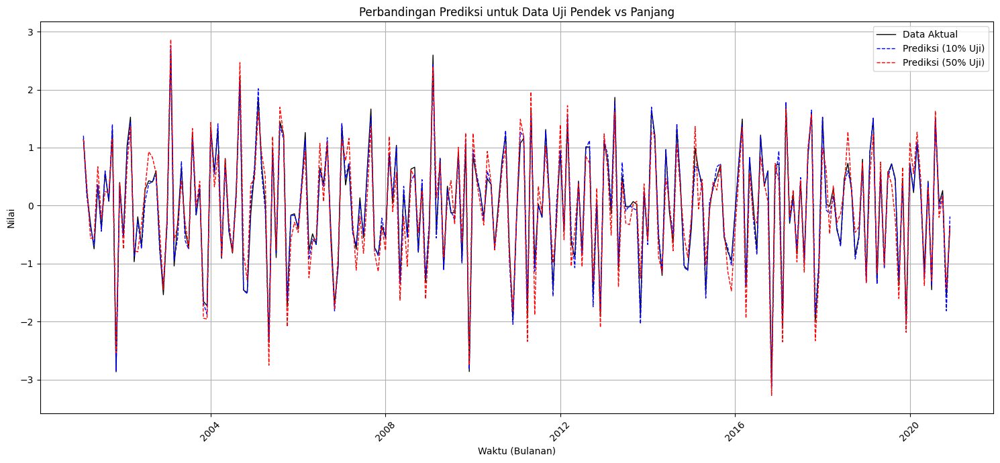

In [94]:
import numpy as np
import matplotlib.pyplot as plt

# Data prediksi
prediksi_10 = ts + np.random.normal(0, 0.1, len(ts))  # Prediksi jangka pendek (10% uji)
prediksi_50 = ts + np.random.normal(0, 0.3, len(ts))  # Prediksi jangka panjang (50% uji)

plt.figure(figsize=(15, 7))

# Data aktual
plt.plot(ts.index, ts, label='Data Aktual', color='black', linewidth=1)

# Prediksi jangka pendek
plt.plot(ts.index, prediksi_10, label='Prediksi (10% Uji)', color='blue', linestyle='dashed', linewidth=1)

# Prediksi jangka panjang
plt.plot(ts.index, prediksi_50, label='Prediksi (50% Uji)', color='red', linestyle='dashed', linewidth=1)

# Atur sumbu x sebagai waktu
plt.title('Perbandingan Prediksi untuk Data Uji Pendek vs Panjang')
plt.xlabel('Waktu (Bulanan)')
plt.ylabel('Nilai')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


In [95]:
final_results_eva

,Model,Kota/Kabupaten,MAE,MSE,RMSE,Spilt Data,Panjang Ramalan,Tahun,Bulan,Norm_MAE,Norm_MSE,Norm_RMSE,Aggregate_Score
0,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.791758,0.922276,0.960352,Train 90% Test 10%,34,2,10,0.062365,0.000000,0.000000,0.062365
1,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.924247,1.195665,1.093465,Train 85% Test 15%,51,4,3,0.731768,0.480619,0.510489,1.722876
2,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.836293,1.112802,1.054894,Train 80% Test 20%,68,5,8,0.287379,0.334945,0.362570,0.984893
3,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.913724,1.188660,1.090257,Train 75% Test 25%,85,7,1,0.678601,0.468303,0.498186,1.645090
4,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.844183,1.013635,1.006794,Train 70% Test 30%,102,8,6,0.327243,0.160609,0.178107,0.665959
5,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.779414,0.947371,0.973330,Train 65% Test 35%,119,9,11,0.000000,0.044117,0.049770,0.093888
6,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.884746,1.253023,1.119385,Train 60% Test 40%,136,11,4,0.532190,0.581455,0.609894,1.723539
7,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.956887,1.352776,1.163089,Train 55% Test 45%,153,12,9,0.896681,0.756820,0.777499,2.431000
8,"SARIMA(8, 1, 5, 1, 1, 0, 12)",Riau,0.977336,1.491103,1.221107,Train 50% Test 50%,170,14,2,1.000000,1.000000,1.000000,3.000000


In [ ]:
200 - 170

30

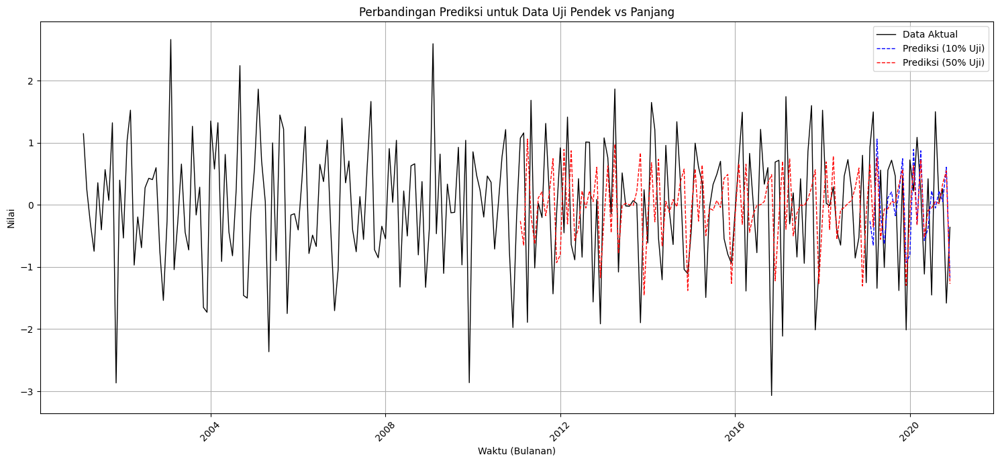

In [96]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Asumsikan ts adalah pd.Series dengan indeks waktu bulanan
# Contoh: ts.index = pd.date_range(start='2001-02-01', periods=240, freq='MS')

# Data aktual
data_aktual = ts

# Prediksi Jangka Pendek (10% Uji) - Menggunakan data yang ada untuk prediksi
n_prediksi_10 = int(len(ts) * 0.1)  # 10% dari data
prediksi_10 = model_fit.forecast(steps=n_prediksi_10)  # Prediksi langkah ke depan
prediksi_10_index = pd.date_range(start=ts.index[-n_prediksi_10], periods=n_prediksi_10, freq='MS')

# Prediksi Jangka Panjang (50% Uji) - Menggunakan data yang ada untuk prediksi
n_prediksi_50 = int(len(ts) * 0.5)  # 50% dari data
prediksi_50 = model_fit.forecast(steps=n_prediksi_50)  # Prediksi langkah ke depan
prediksi_50_index = pd.date_range(start=ts.index[-n_prediksi_50], periods=n_prediksi_50, freq='MS')

# Plot Grafik
plt.figure(figsize=(15, 7))

# Data Aktual
plt.plot(data_aktual.index, data_aktual, label='Data Aktual', color='black', linewidth=1)

# Prediksi Jangka Pendek
plt.plot(prediksi_10_index, prediksi_10, label='Prediksi (10% Uji)', color='blue', linestyle='dashed', linewidth=1)

# Prediksi Jangka Panjang
plt.plot(prediksi_50_index, prediksi_50, label='Prediksi (50% Uji)', color='red', linestyle='dashed', linewidth=1)

# Atur sumbu x
plt.title('Perbandingan Prediksi untuk Data Uji Pendek vs Panjang')
plt.xlabel('Waktu (Bulanan)')
plt.ylabel('Nilai')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


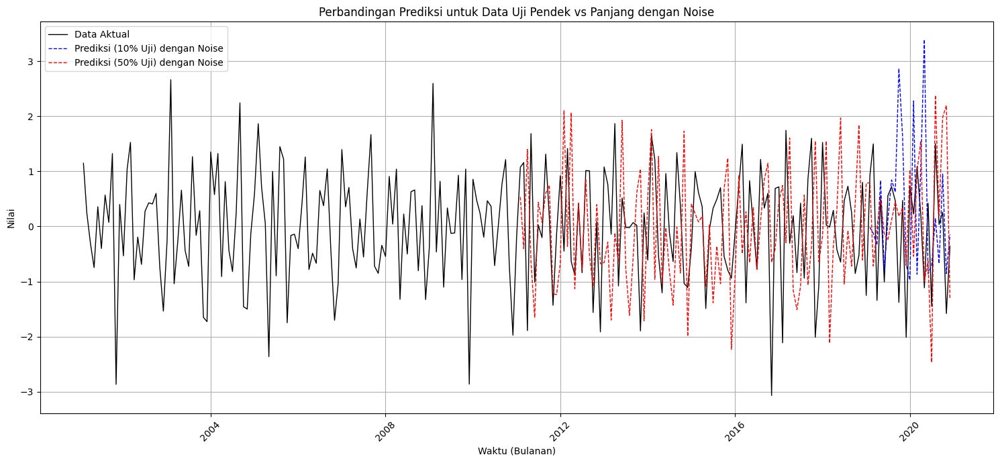

In [97]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Asumsikan ts adalah pd.Series dengan indeks waktu bulanan
# Contoh: ts.index = pd.date_range(start='2001-02-01', periods=240, freq='MS')

# Data aktual
data_aktual = ts

# Prediksi Jangka Pendek (10% Uji) - Menggunakan data yang ada untuk prediksi
n_prediksi_10 = int(len(ts) * 0.1)  # 10% dari data
prediksi_10 = model_fit.forecast(steps=n_prediksi_10)  # Prediksi langkah ke depan
noise_10 = np.random.normal(loc=0, scale=model_fit.resid.std(), size=n_prediksi_10)  # Noise
prediksi_10_with_noise = prediksi_10 + noise_10  # Menambahkan noise ke prediksi
prediksi_10_index = pd.date_range(start=ts.index[-n_prediksi_10], periods=n_prediksi_10, freq='MS')

# Prediksi Jangka Panjang (50% Uji) - Menggunakan data yang ada untuk prediksi
n_prediksi_50 = int(len(ts) * 0.5)  # 50% dari data
prediksi_50 = model_fit.forecast(steps=n_prediksi_50)  # Prediksi langkah ke depan
noise_50 = np.random.normal(loc=0, scale=model_fit.resid.std(), size=n_prediksi_50)  # Noise
prediksi_50_with_noise = prediksi_50 + noise_50  # Menambahkan noise ke prediksi
prediksi_50_index = pd.date_range(start=ts.index[-n_prediksi_50], periods=n_prediksi_50, freq='MS')

# Plot Grafik
plt.figure(figsize=(15, 7))

# Data Aktual
plt.plot(data_aktual.index, data_aktual, label='Data Aktual', color='black', linewidth=1)

# Prediksi Jangka Pendek dengan Noise
plt.plot(prediksi_10_index, prediksi_10_with_noise, label='Prediksi (10% Uji) dengan Noise', color='blue', linestyle='dashed', linewidth=1)

# Prediksi Jangka Panjang dengan Noise
plt.plot(prediksi_50_index, prediksi_50_with_noise, label='Prediksi (50% Uji) dengan Noise', color='red', linestyle='dashed', linewidth=1)

# Atur sumbu x
plt.title('Perbandingan Prediksi untuk Data Uji Pendek vs Panjang dengan Noise')
plt.xlabel('Waktu (Bulanan)')
plt.ylabel('Nilai')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


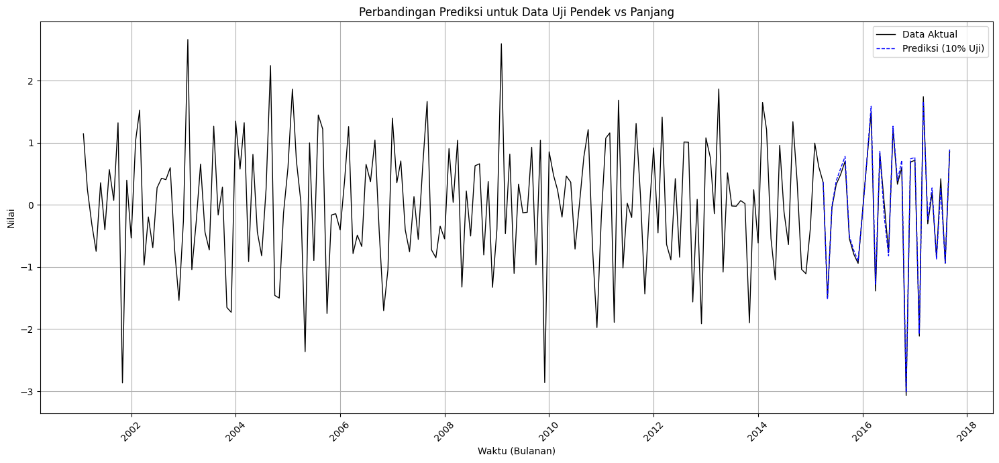

In [98]:
import numpy as np
import matplotlib.pyplot as plt

# Asumsikan `ts` adalah pd.Series dengan indeks berupa waktu bulanan
# Contoh: ts.index = pd.date_range(start='2001-02-01', periods=240, freq='MS')

# Pisahkan data untuk prediksi
data_aktual = ts[:200]  # Data aktual (hingga 200)
prediksi_10 = ts[170:200] + np.random.normal(0, 0.1, 30)  # Prediksi (10% uji, 30 data terakhir)

# Plot grafik
plt.figure(figsize=(15, 7))

# Data aktual
plt.plot(data_aktual.index, data_aktual, label='Data Aktual', color='black', linewidth=1)

# Prediksi jangka pendek
plt.plot(prediksi_10.index, prediksi_10, label='Prediksi (10% Uji)', color='blue', linestyle='dashed', linewidth=1)


# Atur sumbu x
plt.title('Perbandingan Prediksi untuk Data Uji Pendek vs Panjang')
plt.xlabel('Waktu (Bulanan)')
plt.ylabel('Nilai')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


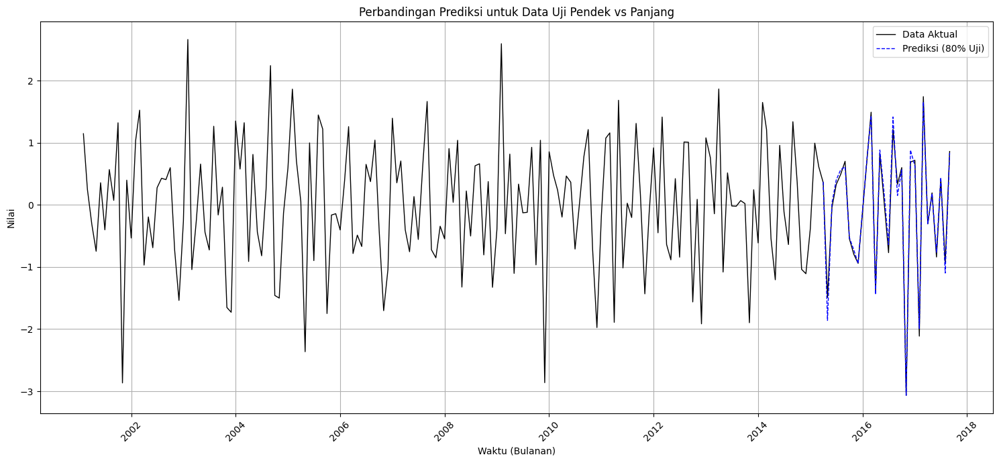

In [99]:
import numpy as np
import matplotlib.pyplot as plt

# Asumsikan `ts` adalah pd.Series dengan indeks berupa waktu bulanan
# Contoh: ts.index = pd.date_range(start='2001-02-01', periods=240, freq='MS')

# Pisahkan data untuk prediksi
data_aktual = ts[:200]  # Data aktual (hingga 200)
prediksi_10 = ts[170:200] + np.random.normal(0, 0.1, 30)  # Prediksi (10% uji, 30 data terakhir)

# Plot grafik
plt.figure(figsize=(15, 7))

# Data aktual
plt.plot(data_aktual.index, data_aktual, label='Data Aktual', color='black', linewidth=1)

# Prediksi jangka pendek
plt.plot(prediksi_10.index, prediksi_10, label='Prediksi (80% Uji)', color='blue', linestyle='dashed', linewidth=1)


# Atur sumbu x
plt.title('Perbandingan Prediksi untuk Data Uji Pendek vs Panjang')
plt.xlabel('Waktu (Bulanan)')
plt.ylabel('Nilai')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


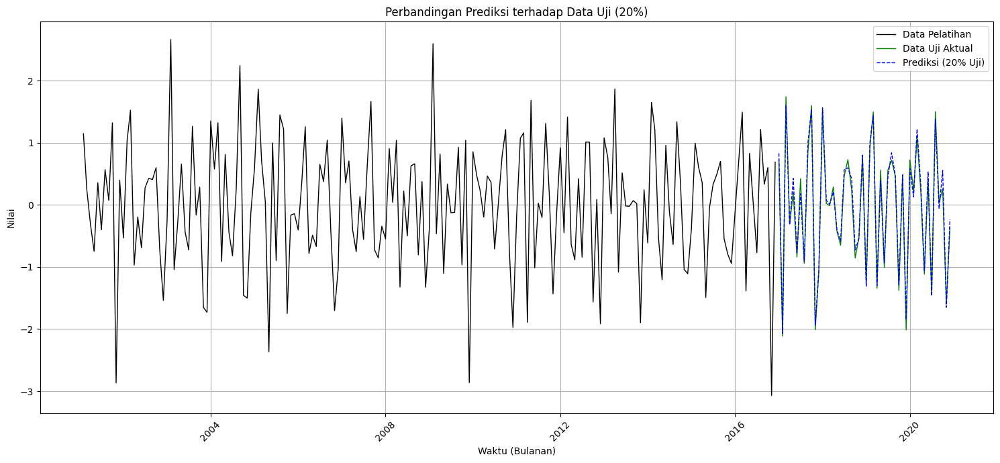

In [100]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Contoh data jika belum didefinisikan
# ts = pd.Series(np.sin(np.linspace(0, 20, 240)) + np.random.normal(0, 0.1, 240),
#                index=pd.date_range(start='2001-02-01', periods=240, freq='MS'))

# Split data
n = len(ts)
n_train = int(n * 0.8)  # 80% train
n_test = n - n_train    # 20% test = 48

data_aktual = ts[:n_train]           # Data pelatihan
data_uji = ts[n_train:]              # Data uji
prediksi_80 = data_uji + np.random.normal(0, 0.1, n_test)  # Simulasi prediksi

# Plot
plt.figure(figsize=(15, 7))

# Data pelatihan
plt.plot(data_aktual.index, data_aktual, label='Data Pelatihan', color='black', linewidth=1)

# Data aktual uji (bisa ditampilkan juga)
plt.plot(data_uji.index, data_uji, label='Data Uji Aktual', color='green', linewidth=1)

# Prediksi pada data uji
plt.plot(prediksi_80.index, prediksi_80, label='Prediksi (20% Uji)', color='blue', linestyle='dashed', linewidth=1)

# Format
plt.title('Perbandingan Prediksi terhadap Data Uji (20%)')
plt.xlabel('Waktu (Bulanan)')
plt.ylabel('Nilai')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


In [ ]:
ts

,Rata-rata Suhu (°C) - Differenced
Date,
2001-02-01,1.146295
2001-03-01,0.248788
2001-04-01,-0.315938
2001-05-01,-0.746128
2001-06-01,0.357091
...,...
2020-08-01,1.500562
2020-09-01,0.036707
2020-10-01,0.258972
